In [4]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from numpy import sqrt, cos, sin,exp
import matplotlib
from matplotlib import cm
import scipy.integrate as integrate
import scipy.special as special
from scipy.integrate import quad
from scipy.stats import vonmises
import math
from scipy.optimize import fsolve
from scipy.optimize import root
import scipy.optimize as optimize

## Example 1: A nonlinear, anisotropic, hyper-viscoelastic model

Fiber microstructure can be modeled with probability distributions for fiber orientation and waviness. The waviness distribution is assumed to be a Weibull distribution. 

In [1]:
# Weibull distribution for fiber waviness or slack 
def weibull(lams, beta, delta, gama):
    return (beta/delta)*((lams-gama)/delta)**(beta-1)*np.exp(-((lams-gama)/delta)**beta)

# These auxiliar functions are the integration of the stress considerin the waviness distribution,
# note in the main text how, for a total stretch lambda (lam variable), the stretch that contributes to
# energy is the effective stretch 'lamr', which is lamr=lam/lams where lams is fiber waviness or slack. 
# An integral is needed over the fiber waviness, i.e. different 'lams' values  
def integrand(lams, lam, beta, delta, gama):
    p_lams=(beta/delta)*((lams-gama)/delta)**(beta-1)*np.exp(-((lams-gama)/delta)**beta)
    lamr = lam/lams
    return p_lams*(lamr**2-(1/lamr))

# this auxiliar function is related to the second derivative of the strain energy and is needed
# for the update of the viscous stretch in the non-equilibrium branch 
def integrand2(lams, lam, beta, delta, gama):
    p_lams=(beta/delta)*((lams-gama)/delta)**(beta-1)*np.exp(-((lams-gama)/delta)**beta)
    lamr = lam/lams
    return p_lams*(2*lamr**2+(1/lamr))

The second Piola Kirchhoff stress tensor results from taking the derivative of the strain energy with respect to the right Cauchy Green deformation tensor. In the case of hyper-viscoelastic materials, there is also a non-equilibrium branch. The stress has a similar form to that of the equilibrium branch, but depending on an internal variable that keeps track of the viscous dissipation. 

The model is microstructure-driven in that it computes the stress contribution from each fiber orientation and, for each fiber orientation, from the distribution of fiber waviness or slack. The orientation distribution is a von Mises distribution. It is not evaluated directly, rather, a vector with a set of fiber orientations is passed to the function. The waviness distribution is defined above. 

In [9]:
# eval the second Piola Kirchhoff stress tensor
def evalPK2(F,param,rho_theta,I4v_theta_n,dt):
    # F: deformation gradient 
    # param: parameters 
    # rho_theta: array with angles and weight of the orientation distribution per angle 
    # I4e_theta: internal variable needed for the viscoelastic branch 
    # dt: time step, needed because we need to integrate the viscoelastic branch 
    
    # unpack parameters 
    # isotropic matrix
    mu0      = param[0]
    K        = param[1]
    # collagen 
    mu_co    = param[2]
    beta_co  = param[3]
    delta_co = param[4]
    gama_co  = param[5]
    # beta controls the viscosity branch relative to equilibrium branch
    beta_visc= param[6]
    # tau controls the time scale of relaxation 
    tau_visc = param[7]
    
    C=np.dot(F,F.transpose())
    J=np.sqrt(np.linalg.det(C))
    I1= np.trace(C)
    Cinv = np.linalg.inv(C)
    Sp=np.zeros([3,3])
    Id=np.eye(3)
    
    # W Isochoric
    Siso=2*(J**(-2./3.))*(mu0)*(Id-(1./3.)*I1*(Cinv))

    # W Volume
    #Wvol = p*(J-1)
    p = 2*K*(J-1)
    Svol = p*J*Cinv

    ntheta = len(rho_theta)
    dtheta = rho_theta[1,0]-rho_theta[0,0]
    I4v_theta = np.ones((ntheta))
    for i in range(ntheta):
        thetai = rho_theta[i,0]
        rhooi = rho_theta[i,1]*dtheta
        a0 = np.array([math.cos(thetai),math.sin(thetai),0])
        d_a0 = np.outer(a0,a0)
        lam = np.sqrt(np.dot(a0,np.dot(C,a0)))
        # integrate the stress contribution from equilibrium branch 
        if lam>gama_co:
            int_po = quad(integrand, gama_co, lam, args=(lam,beta_co,delta_co,gama_co),limit=10)
        else:
            int_po = [0]
        # update the internal variable
        # first calculate updated elastic strain 
        lame_n = lam/np.sqrt(I4v_theta_n[i])
        # evaluate the integrals
        if lame_n>gama_co:
            int_pd_aux1 = quad(integrand, gama_co, lame_n, args=(lame_n,beta_co,delta_co,gama_co),limit=10)
            int_pd_aux2 = quad(integrand2, gama_co, lame_n, args=(lame_n,beta_co,delta_co,gama_co),limit=10)
            #print(int_pd_aux1)
            #print(int_pd_aux2)
        else:
            int_pd_aux1 = [0]
            int_pd_aux2 = [0]
        dPsif = 2*beta_visc*mu_co*(1.0/(lame_n**2))*int_pd_aux1[0]
        d2Psif = -2*mu_co*beta_visc/lame_n**4*int_pd_aux1[0]+mu_co*beta_visc/lame_n**4*int_pd_aux2[0]
        if np.abs(d2Psif*lame_n**2 + dPsif)>0:
            I4edot = ((-1.0/tau_visc)*dPsif*lame_n**2)/(d2Psif*lame_n**2 + dPsif)
        else:
            I4edot = -2*(lame_n**2-1)/tau_visc
        if (d2Psif*lame_n**2 + dPsif)<0:
            print('negative I4edot denominator, check')
        # new elastic strain 
        #print(I4edot)
        #lame = lame_n + dt*I4edot
        I4e = lame_n**2 + dt*I4edot
        lame = np.sqrt(I4e)
        # update the viscoelastic internal variable 
        I4v_theta[i] = (lam/lame)**2

        # stress with the new elastic stretch 
        Sfiber_eq = 2*mu_co*(1.0/(lam**2))*int_po[0]*rhooi  
        Sfiber_visc = 2*beta_visc*mu_co*(1.0/(lame**2))*int_pd_aux1[0]*rhooi*lame**2/lam**2  
        
        Sp += (Sfiber_eq + Sfiber_visc)*d_a0
        
    # this is compressible 
    S = Siso + Svol + Sp
    
    # this is incompressible 
    p = mu0/Cinv[2,2]
    S = mu0*Id - p*Cinv + Sp
    
    return S, I4v_theta

Figure 2: Fiber orientation and waviness plots. 

As discussed above, fiber orientation is assumed to follow a von Mises distribution, while the waviness or slack of the fibers is modeled with a Weibull distribution. Parameters are based on our previous work: 

Rausch M, Meador WD, Tubon JT, Moreno-Flores O, Tepole AB. The biaxial mechanics of thermally denaturing skin-Part II: Modeling. bioRxiv. 2021 Jan 1.

In [5]:
## Plot the fitted waviness and orientation distributions 
kappa_avg = (1.37+1.11+1.68+1.37+1.56+1.26+1.4+1.26+1.33+1.21+1.35+1.16+1.22+1.1+1.09+1.11+1.04+1.11+1.09+1.07+1.03+1.09)/22
print(kappa_avg)
theta0 = 0.0 
# save the optimal values so the optimization doesnt have to be run every time 
beta_co = 1.60997462
delta_co = 0.1519089
gama_co = 0.963249326398276
#gama_co = 1.0
ntheta = 51
rho_theta = np.zeros((ntheta,2))
for i in range(ntheta):
    theta = -np.pi/2+2*i/(ntheta-1)*np.pi/2.0
    rho_theta[i,0] = theta
    VM = vonmises.pdf(2*theta, kappa_avg)
    rho_theta[i,1] = VM
# waviness
lams_ls = np.linspace(0.96,1.4,100)
plams_Co = np.zeros(100)
# Different delta values with a maximum stretch of 2
for i in range(100):
    if lams_ls[i]<gama_co:
        plams_Co[i]=0
    else:
        #plams_Co[i]=weibull(lams_ls[i],optimal_skin.x[2] ,optimal_skin.x[3], optimal_skin.x[4])
        plams_Co[i]=weibull(lams_ls[i],beta_co ,delta_co,gama_co)

1.2277272727272726


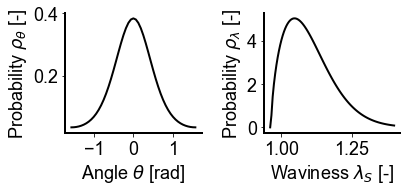

In [6]:
# plot the initial orientation distribution
font = {'family' : 'arial',
        'weight' : 'normal',
        'size'   : 18}
matplotlib.rc('font', **font)
plasma_ls = np.linspace(0,1,3)
plasma_colors = [ cm.plasma(x) for x in plasma_ls ]
fig, axs = plt.subplots(1, 2,figsize=(6,3))
#axs[0].plot(np.linspace(-np.pi/2,np.pi/2,51),rho_theta[:,1],color='royalblue',linewidth=2)
axs[0].plot(np.linspace(-np.pi/2,np.pi/2,ntheta),rho_theta[:,1],color='black',linewidth=2)
#axs[0].set_title('Orientation')
axs[0].set_xlabel(r'Angle $\theta$ [rad]')
axs[0].set_ylabel('Probability '+r'$\rho_\theta$ [-]')
axs[0].spines['right'].set_visible(False)
axs[0].spines['top'].set_visible(False)
axs[0].spines['bottom'].set_linewidth(2)
axs[0].spines['left'].set_linewidth(2)
#axs[1].plot(lams_ls,plams_Co,color='royalblue',linewidth=2,label='Co')
axs[1].plot(lams_ls,plams_Co,color='black',linewidth=2,label='Co')
#axs[1].set_title(r'Waviness')
axs[1].set_xlabel('Waviness '+r'$\lambda$'r'$_{S}$ [-]')
axs[1].set_ylabel('Probability '+r'$\rho_\lambda$ [-]')
axs[1].spines['right'].set_visible(False)
axs[1].spines['top'].set_visible(False)
axs[1].spines['bottom'].set_linewidth(2)
axs[1].spines['left'].set_linewidth(2)
plt.tight_layout()
#plt.savefig('orient_wave.png',dpi=300)

Figure 2: Cyclic biaxial test. 

As discussed in the main text, a tissue is subjected to uniform biaxial deformation in a cyclic manner. Thus, the total deformation $F$ over time is known, and the function to evaluate the second Piola Kirchhoff stress tensor is called for every $F$. The Cauchy stress is calculated by push-forward of the second Piola Kirchhoff stress $\sigma = F\, S\, F^T$

In [10]:
## Biaxial test 
n_up = 25
n_down = 25
n_one = n_up+n_down
n_cycles = 5
lam_up = np.zeros((n_up))
lam_down = np.zeros((n_down))
lam_vec = np.zeros((n_cycles*n_one))
time_vec = np.zeros((n_cycles*n_one))
dt = 0.1
count = 0
dlam = 0.01
for i in range(n_cycles):
    for j in range(n_up):
        lam_vec[i*n_one+j] = j*dlam+1
        time_vec[count] = count*dt
        count+=1
        if i==0:
            lam_up[j] = j*dlam+1
    for j in range(n_down):
        lam_vec[i*n_one+n_up+j] = -j*dlam+1+n_up*dlam
        time_vec[count] = count*dt
        count+=1
        if i==0:
            lam_down[j] = -j*dlam+1+n_up*dlam
lam_cycle = np.zeros((n_one))
lam_cycle[:n_up] = lam_up
lam_cycle[n_up:] = lam_down
I4v_theta_n = np.ones(ntheta)
mu0 = 1e-3 
K=1
mu_co = 1
beta_co = 1.60997462
delta_co = 0.1519089
gama_co = 1.00
beta_visc = 10 
tau_visc = 5
param = [mu0,K,mu_co,beta_co,delta_co,gama_co,beta_visc,tau_visc]
sigma_vec = np.zeros((n_cycles*n_one,2))
lamv_vec = np.zeros((n_cycles*n_one,2))
for i in range(n_cycles*n_one):
    lam = lam_vec[i]
    F = np.array([[lam,0,0],[0,lam,0],[0,0,1./(lam**2)]])
    S,I4vnew=evalPK2(F,param,rho_theta,I4v_theta_n,dt)
    I4v_theta_n = I4vnew
    sigma = np.dot(F,np.dot(S,F.transpose()))
    sigma_vec[i,0] = sigma[0,0]
    sigma_vec[i,1] = sigma[1,1]
    lamv_vec[i,0] = np.sqrt(I4vnew[int(ntheta/2)])
    lamv_vec[i,1] = np.sqrt(I4vnew[0])

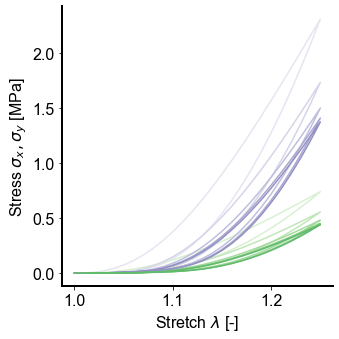

In [11]:
# Try with just one panel 
# plot the initial orientation distribution
font = {'family' : 'arial',
        'weight' : 'normal',
        'size'   : 16}
matplotlib.rc('font', **font)
fig, axs = plt.subplots(1, 1,figsize=(5,5))
color_ls = np.linspace(0,1,12)
colors = [ cm.Purples(x) for x in color_ls ]
colors2 = [ cm.Greens(x) for x in color_ls ]
for i in range(n_cycles):
    axs.plot(lam_cycle,sigma_vec[i*n_one:(i+1)*n_one,0],color=colors[i+2])
    axs.plot(lam_cycle,sigma_vec[i*n_one:(i+1)*n_one,1],color=colors2[i+2])
axs.set_xlabel(r'Stretch $\lambda$ [-]')
axs.set_ylabel('Stress '+r'$\sigma_x, \sigma_y$ [MPa]')
axs.spines['right'].set_visible(False)
axs.spines['top'].set_visible(False)
axs.spines['bottom'].set_linewidth(2)
axs.spines['left'].set_linewidth(2)
plt.tight_layout()
#plt.savefig('biaxial.png',dpi=300)

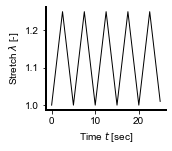

In [12]:
font = {'family' : 'arial',
        'weight' : 'normal',
        'size'   : 10}
matplotlib.rc('font', **font)
fig, axs = plt.subplots(1, 1,figsize=(2.5,2.2))
axs.plot(time_vec,lam_vec,color='black',linewidth=1)
axs.set_xlabel(r'Time $t$ [sec]')
axs.set_ylabel('Stretch '+r'$\lambda$ [-]')
axs.spines['right'].set_visible(False)
axs.spines['top'].set_visible(False)
axs.spines['bottom'].set_linewidth(2)
axs.spines['left'].set_linewidth(2)
plt.tight_layout()
#plt.savefig('cyclic.png',dpi=300)

## Example 2: A growing tissue in response to stretch

Second Piola Kirchhoff stress with added growth. 

This function is similar to the hyper-viscoelastic case, but with an additional split of the deformation. Note that there are two sets of internal variables in this case, one for the growth deformation in every fiber direction, and one for the viscous dissipation also in each fiber orientation. For a given total deformation $F$, and the previous growth $\lambda^g_t$ and previous viscous dissipation $\lambda^v_t$, the function first updates the growth, then computes the stress in each fiber direction, then updates the viscous stretch for that orientation. 

In [13]:
# Then growth, need a new eval PK2, because now it depends on growth 
def evalPK2g(F,param,rho_theta,I4v_theta_n,lamg_theta_n,dt):
    # F: deformation gradient 
    # param: parameters 
    # rho_theta: array with angles and weight of the orientation distribution per angle 
    # I4e_theta: internal variable needed for the viscoelastic branch
    # lamg_theta_n: internal variable needed for the growth
    # dt: time step, needed because we need to integrate the viscoelastic branch 
    
    # unpack parameters 
    # isotropic matrix
    mu0      = param[0]
    K        = param[1]
    # collagen 
    mu_co    = param[2]
    beta_co  = param[3]
    delta_co = param[4]
    gama_co  = param[5]
    # beta controls the viscosity branch relative to equilibrium branch
    beta_visc= param[6]
    # tau controls the time scale of relaxation 
    tau_visc = param[7]
    # growth time scale 
    tau_growth = param[8]
    
    C=np.dot(F,F.transpose())
    J=np.sqrt(np.linalg.det(C))
    I1= np.trace(C)
    Cinv = np.linalg.inv(C)
    Sf=np.zeros([3,3])
    Id=np.eye(3)
    
    # W Isochoric
    Siso=2*(J**(-2./3.))*(mu0)*(Id-(1./3.)*I1*(Cinv))

    # W Volume
    #Wvol = p*(J-1)
    p = 2*K*(J-1)
    Svol = p*J*Cinv

    ntheta = len(rho_theta)
    I4v_theta = np.ones((ntheta))
    lamg_theta = np.ones((ntheta))
    dtheta = rho_theta[1,0]-rho_theta[0,0]
    for i in range(ntheta):
        thetai = rho_theta[i,0]
        rhooi = rho_theta[i,1]*dtheta
        a0 = np.array([math.cos(thetai),math.sin(thetai),0])
        d_a0 = np.outer(a0,a0)
        # total deformation
        lam = np.sqrt(np.dot(a0,np.dot(C,a0)))
        # update the growth with forward Euler and stretch driven growth of fiber 
        lamgi = lamg_theta_n[i] + dt/tau_growth*(lam/lamg_theta_n[i]-1)
        lamg_theta[i] = lamgi
        # new stretch in the equilibrium branch 
        lam_eq = lam/lamgi
        # integrate the stress contribution from equilibrium branch 
        if lam_eq>gama_co:
            int_po = quad(integrand, gama_co, lam_eq, args=(lam_eq,beta_co,delta_co,gama_co),limit=10)
        else:
            int_po = [0]
        # update the internal variable for viscous branch
        # first calculate updated elastic strain of viscous branch
        lame_n = lam_eq/np.sqrt(I4v_theta_n[i])
        # evaluate the integrals
        if lame_n>gama_co:
            int_pd_aux1 = quad(integrand, gama_co, lame_n, args=(lame_n,beta_co,delta_co,gama_co),limit=10)
            int_pd_aux2 = quad(integrand2, gama_co, lame_n, args=(lame_n,beta_co,delta_co,gama_co),limit=10)
            #print(int_pd_aux1)
            #print(int_pd_aux2)
        else:
            int_pd_aux1 = [0]
            int_pd_aux2 = [0]
        dPsif = 2*beta_visc*mu_co*(1.0/(lame_n**2))*int_pd_aux1[0]
        d2Psif = -2*mu_co*beta_visc/lame_n**4*int_pd_aux1[0]+mu_co*beta_visc/lame_n**4*int_pd_aux2[0]
        if np.abs(d2Psif*lame_n**2 + dPsif)>0:
            I4edot = ((-1.0/tau_visc)*dPsif*lame_n**2)/(d2Psif*lame_n**2 + dPsif)
        else:
            I4edot = -2*(lame_n**2-1)/tau_visc
        if (d2Psif*lame_n**2 + dPsif)<0:
            print('negative I4edot denominator, check')
        # new elastic strain 
        #print(I4edot)
        I4e = lame_n**2 + dt*I4edot
        lame = np.sqrt(I4e)
        # update the viscoelastic internal variable 
        I4v_theta[i] = (lam_eq/lame)**2

        # stress with the new elastic stretch 
        Sfiber_eq = 2*mu_co*(1.0/(lam_eq**2))*int_po[0]*rhooi  
        Sfiber_visc = 2*beta_visc*mu_co*(1.0/(lame**2))*int_pd_aux1[0]*rhooi*lame**2/lam_eq**2  
        # this is PK2 in the intermediate, for PK2 need to pull back
        Sf_middle =  (Sfiber_eq + Sfiber_visc)*d_a0
        # for a fiber, growth is only in the direction of fiber 
        # Fg = lamg*a0a0 + s0s0 + n0n0 = (1+lamg-1)*a0a0 + s0s0 + n0n0 = Id + (lamg-1)*a0a0
        # Fginv = 1/lamg*a0a0 + s0s0 + n0n0 = (1+1/lamg - 1)*a0a0 + s0s0 + n0n0 = Id + (1/lamg-1)*a0a0
        Fginv = (1/lamgi-1)*d_a0 + np.eye(3)
        Sf += np.dot(Fginv,np.dot(Sf_middle,Fginv))
        
        
    # this is compressible 
    S = Siso + Svol + Sf
    
    # this is incompressible 
    p = mu0/Cinv[2,2]
    S = mu0*Id - p*Cinv + Sf
    
    return S, I4v_theta, lamg_theta

Figure 3: Creep test, viscous dissipation and growth under constant biaxial stress

As opposed to the previous example, here the target stress is specified for every time step. Thus, one cannot simply evaluate the stress function, but now a nonlinear system needs to be solved for the unknown principal stretches $\lambda_x$, $\lambda_y$. A Newto-Raphson scheme is implemented with the derivative of the residual computed with forward difference. 

In [14]:
# apply a constant force and solve for the stretch over time 
# first just viscoelastic behavior 
Force = 10 #N, applied to a tissue with dimension 100mmx1mm 
PK1_BC = np.array([[Force/100,0,0],[0,Force/100,0],[0,0,0]])
n_t = 500
time_vec = np.linspace(0,1000,n_t)
dt = time_vec[1]-time_vec[0]
# initial condition for deformation
lamx = 1.01
lamy = 1.01
lamx_vec = np.ones((n_t+1))
lamy_vec = np.ones((n_t+1))
lamxg_vec = np.ones((n_t+1))
lamyg_vec = np.ones((n_t+1))
lamxv_vec = np.ones((n_t+1))
lamyv_vec = np.ones((n_t+1))
I4v_theta_n = np.ones((ntheta))
lamg_theta_n = np.ones((ntheta))
tau_growth = 10000
param = [mu0,K,mu_co,beta_co,delta_co,gama_co,beta_visc,tau_visc,tau_growth]
for i in range(n_t):
    # solve equilibrium 
    resnorm = 1
    iter=0
    tol=1e-4
    itermax = 20
    eps = 1e-5
    while resnorm>tol and iter<itermax:
        F = np.array([[lamx,0,0],[0,lamy,0],[0,0,1/(lamx*lamy)]])
        PK2,I4vnew,lamgnew = evalPK2g(F,param,rho_theta,I4v_theta_n,lamg_theta_n,dt)
        PK1 = np.dot(F,PK2)
        res = np.array([PK1[0,0]-PK1_BC[0,0],PK1[1,1]-PK1_BC[1,1]])
        resnorm = np.linalg.norm(res)
        # numerical derivative 
        lamxp = lamx+eps
        F = np.array([[lamxp,0,0],[0,lamy,0],[0,0,1/(lamxp*lamy)]])
        PK2,aux,aux2 = evalPK2g(F,param,rho_theta,I4v_theta_n,lamg_theta_n,dt)
        PK1px = np.dot(F,PK2)
        lamyp = lamy+eps
        F = np.array([[lamx,0,0],[0,lamyp,0],[0,0,1/(lamx*lamyp)]])
        PK2,aux,aux2 = evalPK2g(F,param,rho_theta,I4v_theta_n,lamg_theta_n,dt)
        PK1py = np.dot(F,PK2)
        dres = np.array([[(PK1px[0,0]-PK1[0,0])/eps,(PK1py[0,0]-PK1[0,0])/eps],\
                         [(PK1px[1,1]-PK1[1,1])/eps,(PK1py[1,1]-PK1[1,1])/eps]])
        dlam = np.linalg.solve(dres,res)
        lamx += -dlam[0]
        lamy += -dlam[1]
        iter +=1
    I4v_theta_n = I4vnew
    lamg_theta_n = lamgnew
    lamx_vec[i+1] = lamx
    lamy_vec[i+1] = lamy
    lamxg_vec[i+1] = lamgnew[int(ntheta/2)]
    lamyg_vec[i+1] = lamgnew[0]
    lamxv_vec[i+1] = np.sqrt(I4vnew[int(ntheta/2)])
    lamyv_vec[i+1] = np.sqrt(I4vnew[0])
    

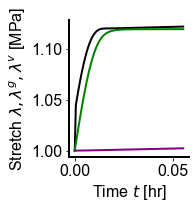

In [15]:
font = {'family' : 'arial',
        'weight' : 'normal',
        'size'   : 16}
matplotlib.rc('font', **font)
fig, axs = plt.subplots(1, 1,figsize=(3,3))
axs.plot(time_vec[0:100]/3600,lamx_vec[0:100],color='black',linewidth=2)
axs.plot(time_vec[0:100]/3600,lamxv_vec[0:100],color='green',linewidth=2)
axs.plot(time_vec[0:100]/3600,lamxg_vec[0:100],color='purple',linewidth=2)
axs.set_xlabel(r'Time $t$ [hr]')
axs.set_ylabel('Stretch '+r'$\lambda, \lambda^g, \lambda^v$ [MPa]')
axs.spines['right'].set_visible(False)
axs.spines['top'].set_visible(False)
axs.spines['bottom'].set_linewidth(2)
axs.spines['left'].set_linewidth(2)
plt.tight_layout()
#plt.savefig('growth_subplot.png',dpi=300)

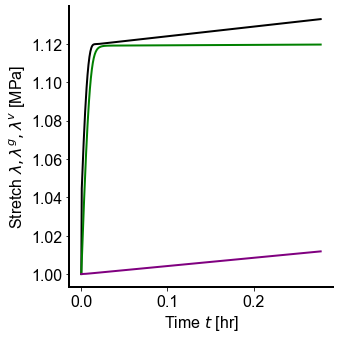

In [16]:
font = {'family' : 'arial',
        'weight' : 'normal',
        'size'   : 16}
matplotlib.rc('font', **font)
fig, axs = plt.subplots(1, 1,figsize=(5,5))
axs.plot(time_vec[0:]/3600,lamx_vec[0:-1],color='black',linewidth=2)
axs.plot(time_vec[0:]/3600,lamxv_vec[0:-1],color='green',linewidth=2)
axs.plot(time_vec[0:]/3600,lamxg_vec[0:-1],color='purple',linewidth=2)
axs.set_xlabel(r'Time $t$ [hr]')
axs.set_ylabel('Stretch '+r'$\lambda, \lambda^g, \lambda^v$ [MPa]')
axs.spines['right'].set_visible(False)
axs.spines['top'].set_visible(False)
axs.spines['bottom'].set_linewidth(2)
axs.spines['left'].set_linewidth(2)
plt.tight_layout()
#plt.savefig('growth_plot.png',dpi=300)

## Example 3: A nonlinear adhesion model

Before specifying the Bell model of adhesion, note that the binding and unbinding rates depend on the energy at the adhesion. Furthermore, the contractility of the cell is regulated based on the apparent stiffness of the substrate, the actin cytoskeleton stiffness, and the nuclear stiffness. 

In [17]:
# energy density of a sigle fiber subjected to total strain lam, with current viscous stretch lamv 
def evalPsi(lam,lamv,param,dt):
    mu_co = param[0]
    beta_visc = param[1]
    tau_visc = param[2]
    # equilibrium portion of the energy 
    Psi_eq = mu_co*(lam**2+(2./lam)-3)
    # non-equilibrium, need the elastic part of viscous branch 
    lame = lam/lamv 
    Psi_neq = beta_visc*mu_co*(lame**2+(2./lame)-3)
    return Psi_eq+Psi_neq

# stress of a single fiber 
def evalPK1one(lam,lamv,param,dt):
    mu_co = param[0]
    beta_visc = param[1]
    tau_visc = param[2]
    # equilibrium portion of the energy 
    Psi_eq = mu_co*(lam**2+(2./lam)-3)
    # non-equilibrium, need the elastic part of viscous branch 
    lame = lam/lamv 
    Psi_neq = beta_visc*mu_co*(lame**2+(2./lame)-3)
    # update of the viscous branch 
    dPsif = 2*beta_visc*mu_co*(1.0/(lame**2))*(lame**2-(1/lame))
    d2Psif = -2*mu_co*beta_visc/lame**4*(lame**2-(1/lame))+mu_co*beta_visc/lame**4*(2*lame**2+(1/lame))
    if np.abs(d2Psif*lame**2 + dPsif)>0:
        I4edot = ((-1.0/tau_visc)*dPsif*lame**2)/(d2Psif*lame**2 + dPsif)
    else:
        I4edot = 0
    if (d2Psif*lame**2 + dPsif)<0:
        print('negative I4edot denominator, check')
    # new elastic strain 
    lame = lame + dt*I4edot
    # update the viscoelastic internal variable 
    lamvnew = (lam/lame)
    # eval stress of the neo-hookean uniaxial 
    PK2_eq = 2*mu_co*(1.0/(lam**2))*(lam**2-(1/lam))
    PK2_neq = 2*beta_visc*mu_co*(1.0/(lame**2))*(lame**2-(1/lame))
    # transform to PK1 
    PK1 = lam*(PK2_eq+PK2_neq)
    return PK1,lamvnew

# Apparent stiffness of a single fiber
def evalKeff(lam,lamv,param,dt):
    mu_co = param[0]
    beta_visc = param[1]
    tau_visc = param[2]
    # equilibrium portion of the energy 
    Psi_eq = mu_co*(lam**2+(2./lam)-3)
    # non-equilibrium, need the elastic part of viscous branch 
    lame = lam/lamv 
    Psi_neq = beta_visc*mu_co*(lame**2+(2./lame)-3)
    # stress
    PK2_eq = 2*mu_co*(1.0/(lam**2))*(lam**2-(1/lam))
    PK2_neq = 2*beta_visc*mu_co*(1.0/(lame**2))*(lame**2-(1/lame))
    # transform to PK1 
    PK1 = lam*(PK2_eq+PK2_neq)
    # stiffness is derivative with respect to stretch
    dPK2_eq = 2*mu_co*(-2.0/(lam**3))*(lam**2-(1/lam))+2*mu_co*(1.0/(lam**2))*(2*lam+(1/lam**2))
    dlame = 1/lamv
    dPK2_neq = 2*beta_visc*mu_co*(-2.0*dlame/(lame**3))*(lame**2-(1/lame))+2*beta_visc*mu_co*(1.0/(lame**2))*(2*lame*dlame+(dlame/lame**2))
    keff = (PK2_eq+PK2_neq) + lam*(dPK2_eq+dPK2_neq)
    return keff

Figure 4: Monte Carlo simulation of integrin bonds 

In [19]:
## Montecarlo simulation based on nonlinear strain energy

## adding one coupling, which is the change in f with stiffness 
# so solve again MC but with the coupling 
# coupling f = f0/(1-beta+(ka/keff+ka/kN)), where f is the contractile force by the cell
f0 = 100 #pN 
ka = 50 #pN/nm 
kN = 25 #10-50 pN/nm 
beta = 0.5 #0 to 1 
n_bond = 100
state_vec = np.zeros((n_bond))
tau_vec = np.zeros((n_bond))
f_vec = np.ones((n_bond))
n_step = 1000
kon = 0.002 #1/s, 
koffhat = 1e-4 #1/s
dt = 1. # s
lam = 1.0
lamc = lam
f = 10 # pN no longer use because here doing the coupling 
A0 = 2e4 # nm^2 
A0 = 2e4*1e-6 # um^2
l0 = 0.01 # um 
kBT = 1.380649e-23*320 # Joules = N*m
mu_co = 20
param_one = [mu_co,beta_visc,tau_visc]
lamv0 = lam # initially the fiber is at equilibrium, no energy in viscous branch 
lamv_vec = lamv0*np.ones((n_bond))
E0 = evalPsi(lam,lamv0,param_one,dt) # initial energy in the fiber
PK10,aux = evalPK1one(lam,lamv0,param_one,dt)
F0 = PK10*A0*1e6
bond_tvec = np.zeros((n_step))
f_tvec = np.zeros((n_step))
tau_off_arr = []
deltaE_arr = []
# loop over time 
for ti in range(n_step):
    # loop over possible bonds 
    for i in range(n_bond):
        Pon = np.random.rand() 
        Poff = np.random.rand()
        if state_vec[i]==0:
            tau_vec[i]+=dt
            # if there is no bond then bond forms acording to Poisson process 
            if Pon<1-np.exp(-dt*kon):
                state_vec[i]=1
                tau_vec[i] = 0
                lamv_vec[i] = lamv0
        else:
            # if there is a bond then need to compute the stretch in the fiber from cell contractility
            # this requires solving a coupled system, one is for the equilibrium of the fiber, the other is the 
            # feedback between the apparent ECM stiffness and the cell contractile force 
            # solution of the coupled system is done with Newton Raphson 
            lamvi = lamv_vec[i]
            # solve for the next equilibrium, nonlinear function of lam
            resnorm = 1
            iter = 0
            itermax = 100
            tol = 1e-4
            eps = 1e-7
            lamc=lam+1e-3
            while resnorm>tol and iter<itermax:
                # stress PK1 given lamc and lamvi 
                PK1,lamvn= evalPK1one(lamc,lamvi,param_one,dt)
                if PK1<PK10:
                    PK1=PK10
                    lamc=lam
                # keff is force over distance
                keff = evalKeff(lamc,lamvi,param_one,dt)+1e-8 # 1 N/mm^2*um^2/um = 1 N/mm^2*um = 1 1e12pN/1e6um^2*um = 1e6 pN/um = 1e3 pN/nm
                # active force now depends on keff too 
                f = f0/(1-beta+(ka/keff+ka/kN))
                res = PK1*A0*1e6-F0-f # 1 N/mm^2*um^2 = 1e12 pN/(1e6 um^2)*um^2 = 1e6 pN 
                #print('res',res)
                resnorm = np.abs(res)
                lamp = lamc+eps
                #Ep,aux = evalPsi(lamp,lamvi,param_one,dt)
                PK1p,aux= evalPK1one(lamp,lamvi,param_one,dt)
                keffp = evalKeff(lamp,lamvi,param_one,dt)+1e-8
                fp = f0/(1-beta+(ka/keffp+ka/kN))
                resp = PK1p*A0*1e6-F0-fp
                dres = (resp-res)/eps
                lamc -= res/dres
                #print('lamc',lamc)
                iter+=1
            print('res',resnorm)
            print('iter',iter)
            #print('dE',dE)
            print('lamc',lamc)
            print('keff',keff)
            lamv_vec[i] = lamvn 
            f_vec[i] = f
            Wf = f*(lamc*l0-lam*l0)*1e-18 # 1 pN*um = 1e-12N*1e-6m = 1e-18 Nm 
            print('Wf',Wf)
            koff = koffhat*np.exp(Wf/kBT)
            print('koff',koff)
            tau_vec[i] += dt
            if Poff<1-np.exp(-dt*koff):
                tau_off_arr.append(tau_vec[i])
                deltaE_arr.append(Wf)
                state_vec[i]=0
                tau_vec[i] = 0
                lamv_vec[i] = lamv0
                f_vec[i] = 0
    bond_tvec[ti] = np.sum(state_vec[:])
    f_tvec[ti] = np.sum(f_vec[:])/(bond_tvec[ti]+1e-5)

res 1.0246972529159848e-05
iter 3
lamc 1.0000023454204863
keff 1319.9938081305716
Wf 9.241656194507122e-25
koff 0.00010002092001397233
res 1.0188662550092431e-05
iter 3
lamc 1.0000031495653792
keff 1319.993936797407
Wf 1.2410226911849611e-24
koff 0.00010002809360414524
res 1.0155795685307112e-05
iter 3
lamc 1.0000039077593086
keff 1319.9940581115147
Wf 1.539773713630561e-24
koff 0.00010003485774768017
res 1.0173055287054922e-05
iter 3
lamc 1.000004622628094
keff 1319.9941724931036
Wf 1.821453337923662e-24
koff 0.00010004123578968689
res 1.0246972529159848e-05
iter 3
lamc 1.0000023454204863
keff 1319.9938081305716
Wf 9.241656194507122e-25
koff 0.00010002092001397233
res 1.010150236879781e-05
iter 3
lamc 1.000005296647498
keff 1319.9942803383385
Wf 2.0870370880606193e-24
koff 0.00010004724974697393
res 1.0188662550092431e-05
iter 3
lamc 1.0000031495653792
keff 1319.993936797407
Wf 1.2410226911849611e-24
koff 0.00010002809360414524
res 1.0101301910481197e-05
iter 3
lamc 1.000005932151805


iter 3
lamc 1.0000125616081623
keff 1319.9954427371354
Wf 4.949648334284214e-24
koff 0.00010011209451946502
res 1.0173055287054922e-05
iter 3
lamc 1.000004622628094
keff 1319.9941724931036
Wf 1.821453337923662e-24
koff 0.00010004123578968689
res 1.0082937649258383e-05
iter 3
lamc 1.0000065313419022
keff 1319.99447789263
Wf 2.5735435142112232e-24
koff 0.00010005826728064873
res 9.733490976771009e-06
iter 3
lamc 1.0000137087310248
keff 1319.9956262745952
Wf 5.401648972500472e-24
koff 0.00010012233722177171
res 9.739854924362135e-06
iter 3
lamc 1.000014276929537
keff 1319.9957171849687
Wf 5.6255361421670735e-24
koff 0.00010012741107532753
res 1.0173055287054922e-05
iter 3
lamc 1.000004622628094
keff 1319.9941724931036
Wf 1.821453337923662e-24
koff 0.00010004123578968689
res 9.82765997292745e-06
iter 3
lamc 1.0000118170792434
keff 1319.9953236134977
Wf 4.656281724339555e-24
koff 0.0001001054471540966
res 9.787067689615014e-06
iter 3
lamc 1.000012781978006
keff 1319.9954779959526
Wf 5.03648

iter 3
lamc 1.000004622628094
keff 1319.9941724931036
Wf 1.821453337923662e-24
koff 0.00010004123578968689
res 9.835632560850627e-06
iter 3
lamc 1.0000115382319514
keff 1319.9952789982117
Wf 4.54640757102449e-24
koff 0.00010010295763999829
res 9.811396523673466e-06
iter 3
lamc 1.00001232788287
keff 1319.995405341438
Wf 4.857553594956853e-24
koff 0.00010011000770622637
res 9.651148289435696e-06
iter 3
lamc 1.000015297243961
keff 1319.9958804322666
Wf 6.0275704740646185e-24
koff 0.00010013652284278485
res 1.0188662550092431e-05
iter 3
lamc 1.0000031495653792
keff 1319.993936797407
Wf 1.2410226911849611e-24
koff 0.00010002809360414524
res 9.999790954395849e-06
iter 3
lamc 1.000007628961354
keff 1319.9946535137688
Wf 3.0060383219260525e-24
koff 0.00010006806267380749
res 9.686464089497804e-06
iter 3
lamc 1.0000155323146522
keff 1319.9959180427995
Wf 6.120195341657187e-24
koff 0.00010013862222444263
res 1.0101301910481197e-05
iter 3
lamc 1.000005932151805
keff 1319.994382020788
Wf 2.3374447

res 9.835632560850627e-06
iter 3
lamc 1.0000115382319514
keff 1319.9952789982117
Wf 4.54640757102449e-24
koff 0.00010010295763999829
res 9.657495873227617e-06
iter 3
lamc 1.0000159263267279
keff 1319.9959810833393
Wf 6.275447858362294e-24
koff 0.00010014214118687489
res 9.875176509410721e-06
iter 3
lamc 1.0000105961342467
keff 1319.9951282631728
Wf 4.175192965749184e-24
koff 0.0001000945471662736
res 9.733490976771009e-06
iter 3
lamc 1.0000137087310248
keff 1319.9956262745952
Wf 5.401648972500472e-24
koff 0.00010012233722177171
res 9.68500141595996e-06
iter 3
lamc 1.0000153612954703
keff 1319.9958906803029
Wf 6.052808680214479e-24
koff 0.0001001370948730006
res 9.642642474716467e-06
iter 3
lamc 1.0000155829339037
keff 1319.995926141701
Wf 6.140140837411821e-24
koff 0.00010013907430326863
res 9.937853882036052e-06
iter 3
lamc 1.0000094721586457
keff 1319.994948427064
Wf 3.732313044198971e-24
koff 0.0001000845139220805
res 9.883521094877779e-06
iter 3
lamc 1.000010243291725
keff 1319.995

res 9.627089973207603e-06
iter 3
lamc 1.0000159544316105
keff 1319.9959855800134
Wf 6.2865220208973724e-24
koff 0.00010014239219920179
res 9.781859063195952e-06
iter 3
lamc 1.0000125616081623
keff 1319.9954427371354
Wf 4.949648334284214e-24
koff 0.00010011209451946502
res 9.793579387462614e-06
iter 3
lamc 1.0000129897555572
keff 1319.995511239998
Wf 5.118351183623854e-24
koff 0.0001001159173407562
res 9.686383634743834e-06
iter 3
lamc 1.0000149997952086
keff 1319.995832841412
Wf 5.910366788748842e-24
koff 0.00010013386643494675
res 9.69866498223837e-06
iter 3
lamc 1.0000152293106512
keff 1319.9958695631638
Wf 6.00080272263486e-24
koff 0.00010013591614861588
res 9.643028889172456e-06
iter 3
lamc 1.0000160923704313
keff 1319.996007649716
Wf 6.3408740329775455e-24
koff 0.00010014362417733099
res 9.781859063195952e-06
iter 3
lamc 1.0000125616081623
keff 1319.9954427371354
Wf 4.949648334284214e-24
koff 0.00010011209451946502
res 9.765264067596036e-06
iter 3
lamc 1.0000138635524536
keff 1319

res 9.645405334879342e-06
iter 3
lamc 1.0000162752169515
keff 1319.9960369044636
Wf 6.412921018848499e-24
koff 0.0001001452572646294
res 9.714877812427858e-06
iter 3
lamc 1.0000147259707697
keff 1319.995789030324
Wf 5.802471788200204e-24
koff 0.00010013142106965749
res 9.650075774914058e-06
iter 3
lamc 1.0000156306607044
keff 1319.995933777825
Wf 6.1589466212771224e-24
koff 0.00010013950055158458
res 9.659688309682224e-06
iter 3
lamc 1.0000161109873633
keff 1319.996010628357
Wf 6.348209659779543e-24
koff 0.00010014379045258981
res 9.630593105214302e-06
iter 3
lamc 1.0000161754078352
keff 1319.996020935385
Wf 6.3735932483083625e-24
koff 0.00010014436581969819
res 9.734564905272691e-06
iter 3
lamc 1.0000143992832529
keff 1319.9957367612383
Wf 5.673747157492475e-24
koff 0.00010012850369338431
res 9.713763333252246e-06
iter 3
lamc 1.0000146234157792
keff 1319.995772621819
Wf 5.762062061438879e-24
koff 0.00010013050522662344
res 9.685961742889049e-06
iter 3
lamc 1.0000156756603324
keff 1319

Wf 1.539773713630561e-24
koff 0.00010003485774768017
res 9.607554716239974e-06
iter 3
lamc 1.000016343337493
keff 1319.9960478034784
Wf 6.439762545239036e-24
koff 0.0001001458656876725
res 9.686464089497804e-06
iter 3
lamc 1.0000155323146522
keff 1319.9959180427995
Wf 6.120195341657187e-24
koff 0.00010013862222444263
res 9.63185586755344e-06
iter 3
lamc 1.000016005915295
keff 1319.995993817214
Wf 6.306808129016232e-24
koff 0.00010014285201557696
res 9.638544440804253e-06
iter 3
lamc 1.0000162573640483
keff 1319.9960340480666
Wf 6.4058864422483754e-24
koff 0.00010014509781087737
res 9.645001583180601e-06
iter 3
lamc 1.0000162910878714
keff 1319.9960394437499
Wf 6.419174635003037e-24
koff 0.0001001453990164527
res 9.68500141595996e-06
iter 3
lamc 1.0000153612954703
keff 1319.9958906803029
Wf 6.052808680214479e-24
koff 0.0001001370948730006
res 9.669749672980288e-06
iter 3
lamc 1.000015478627653
keff 1319.995909453059
Wf 6.099041061723686e-24
koff 0.00010013814274989498
res 9.633477056070

keff 1319.9959477659904
Wf 6.1933958295501384e-24
koff 0.00010014028137548521
res 9.627089973207603e-06
iter 3
lamc 1.0000159544316105
keff 1319.9959855800134
Wf 6.2865220208973724e-24
koff 0.00010014239219920179
res 9.975719791555093e-06
iter 3
lamc 1.0000086047240637
keff 1319.9948096369815
Wf 3.3905179395328624e-24
koff 0.00010007677139625667
res 9.6275501775267e-06
iter 3
lamc 1.0000163714349124
keff 1319.9960522989593
Wf 6.450833767095916e-24
koff 0.00010014611664267768
res 9.66668653745728e-06
iter 3
lamc 1.000015864903905
keff 1319.9959712559123
Wf 6.251245433026083e-24
koff 0.00010014159260518057
res 9.654181539531237e-06
iter 3
lamc 1.00001616069506
keff 1319.9960185814004
Wf 6.367795975756419e-24
koff 0.00010014423441324498
res 9.631975828483519e-06
iter 3
lamc 1.0000163177394743
keff 1319.9960437079
Wf 6.4296761619160715e-24
koff 0.00010014563705687177
res 9.63416889732116e-06
iter 3
lamc 1.0000163388019714
keff 1319.996047077818
Wf 6.4379754144309665e-24
koff 0.000100145825

res 9.886662866165352e-06
iter 3
lamc 1.000009869065189
keff 1319.9950119321998
Wf 3.888706064112721e-24
koff 0.000100088056820298
res 9.633477056070205e-06
iter 3
lamc 1.0000160294723845
keff 1319.9959975862616
Wf 6.3160903253688974e-24
koff 0.00010014306241178198
res 9.975719791555093e-06
iter 3
lamc 1.0000086047240637
keff 1319.9948096369815
Wf 3.3905179395328624e-24
koff 0.00010007677139625667
res 9.638544440804253e-06
iter 3
lamc 1.0000162573640483
keff 1319.9960340480666
Wf 6.4058864422483754e-24
koff 0.00010014509781087737
res 9.731371626742202e-06
iter 3
lamc 1.0000145146454988
keff 1319.9957552188816
Wf 5.719203325056685e-24
koff 0.00010012953388857154
res 9.64198971331598e-06
iter 3
lamc 1.0000162833858006
keff 1319.9960382114473
Wf 6.4161397892606896e-24
koff 0.00010014533022504251
res 9.756938077032373e-06
iter 3
lamc 1.000013185660365
keff 1319.9955425843932
Wf 5.195543523736019e-24
koff 0.00010011766657459831
res 9.654334071740323e-06
iter 3
lamc 1.0000163812369436
keff 1

res 9.975815899565532e-06
iter 3
lamc 1.0000090511975537
keff 1319.9948810730841
Wf 3.566441814696059e-24
koff 0.00010008075644331787
res 9.661451137787935e-06
iter 3
lamc 1.0000163976665604
keff 1319.9960564959256
Wf 6.461169819259929e-24
koff 0.00010014635093391872
res 1.0188662550092431e-05
iter 3
lamc 1.0000031495653792
keff 1319.993936797407
Wf 1.2410226911849611e-24
koff 0.00010002809360414524
res 9.630593105214302e-06
iter 3
lamc 1.0000161754078352
keff 1319.996020935385
Wf 6.3735932483083625e-24
koff 0.00010014436581969819
res 9.63119066454965e-06
iter 3
lamc 1.0000163051968431
keff 1319.9960417011278
Wf 6.4247339909719296e-24
koff 0.00010014552503152605
res 9.63521688390756e-06
iter 3
lamc 1.0000163741057466
keff 1319.9960527262836
Wf 6.4518861554866345e-24
koff 0.00010014614049754212
res 9.62829675188459e-06
iter 3
lamc 1.0000163833476772
keff 1319.996054204955
Wf 6.4555277519215665e-24
koff 0.0001001462230429561
res 9.656640344246625e-06
iter 3
lamc 1.0000161285404996
keff 1

iter 3
lamc 1.0000163388019714
keff 1319.996047077818
Wf 6.4379754144309665e-24
koff 0.00010014582517825317
res 9.622782656037998e-06
iter 3
lamc 1.0000163872142076
keff 1319.9960548235838
Wf 6.45705128034768e-24
koff 0.00010014625757735891
res 9.620317413805424e-06
iter 3
lamc 1.000016393707165
keff 1319.9960558624316
Wf 6.459609699339542e-24
koff 0.00010014631557004965
res 9.640679806466323e-06
iter 3
lamc 1.0000162146913316
keff 1319.9960272205965
Wf 6.3890721182975846e-24
koff 0.0001001447166792247
res 9.757793101528023e-06
iter 3
lamc 1.0000133703708618
keff 1319.9955721377034
Wf 5.268324971352155e-24
koff 0.00010011931588244299
res 9.648873160017502e-06
iter 3
lamc 1.0000162372816495
keff 1319.9960308349614
Wf 6.397973377714516e-24
koff 0.00010014491844461738
res 9.787067689615014e-06
iter 3
lamc 1.000012781978006
keff 1319.9954779959526
Wf 5.036480628450541e-24
koff 0.00010011406212859908
res 9.607554716239974e-06
iter 3
lamc 1.000016343337493
keff 1319.9960478034784
Wf 6.439762

res 1.0003616559117745e-05
iter 3
lamc 1.0000070962929068
keff 1319.9945682859218
Wf 2.7961510631732198e-24
koff 0.00010006330890572413
res 9.651148289435696e-06
iter 3
lamc 1.000015297243961
keff 1319.9958804322666
Wf 6.0275704740646185e-24
koff 0.00010013652284278485
res 9.653087907679492e-06
iter 3
lamc 1.0000164053665899
keff 1319.996057727899
Wf 6.4642038606904575e-24
koff 0.0001001464197077984
res 9.76841449329413e-06
iter 3
lamc 1.000013544526711
keff 1319.995600002274
Wf 5.336947572900471e-24
koff 0.00010012087097113634
res 9.64656182844692e-06
iter 3
lamc 1.0000162665530352
keff 1319.9960355182702
Wf 6.409507177328402e-24
koff 0.00010014517988256462
res 9.811396523673466e-06
iter 3
lamc 1.00001232788287
keff 1319.995405341438
Wf 4.857553594956853e-24
koff 0.00010011000770622637
res 9.631975828483519e-06
iter 3
lamc 1.0000163177394743
keff 1319.9960437079
Wf 6.4296761619160715e-24
koff 0.00010014563705687177
res 9.714877812427858e-06
iter 3
lamc 1.0000147259707697
keff 1319.995

res 9.886662866165352e-06
iter 3
lamc 1.000009869065189
keff 1319.9950119321998
Wf 3.888706064112721e-24
koff 0.000100088056820298
res 9.650075774914058e-06
iter 3
lamc 1.0000156306607044
keff 1319.995933777825
Wf 6.1589466212771224e-24
koff 0.00010013950055158458
res 9.635403102947748e-06
iter 3
lamc 1.0000164091766428
keff 1319.9960583374886
Wf 6.46570513527025e-24
koff 0.00010014645373783147
res 9.734564905272691e-06
iter 3
lamc 1.0000143992832529
keff 1319.9957367612383
Wf 5.673747157492475e-24
koff 0.00010012850369338431
res 9.629313836967412e-06
iter 3
lamc 1.0000163116526037
keff 1319.9960427340247
Wf 6.427277753310499e-24
koff 0.0001001455826915668
res 9.76841449329413e-06
iter 3
lamc 1.000013544526711
keff 1319.995600002274
Wf 5.336947572900471e-24
koff 0.00010012087097113634
res 9.640669979660288e-06
iter 3
lamc 1.0000163476138493
keff 1319.9960484876844
Wf 6.4414475572688284e-24
koff 0.00010014590388235046
res 9.69866498223837e-06
iter 3
lamc 1.0000152293106512
keff 1319.995

keff 1319.9960579554167
Wf 6.4647641898656614e-24
koff 0.00010014643240901814
res 9.635403102947748e-06
iter 3
lamc 1.0000164091766428
keff 1319.9960583374886
Wf 6.46570513527025e-24
koff 0.00010014645373783147
res 9.607554716239974e-06
iter 3
lamc 1.000016343337493
keff 1319.9960478034784
Wf 6.439762545239036e-24
koff 0.0001001458656876725
res 9.651148289435696e-06
iter 3
lamc 1.000015297243961
keff 1319.9958804322666
Wf 6.0275704740646185e-24
koff 0.00010013652284278485
res 9.651997480375485e-06
iter 3
lamc 1.0000163516458487
keff 1319.9960491327906
Wf 6.443036285361567e-24
koff 0.00010014593989454461
res 9.70858155113774e-06
iter 3
lamc 1.000015080843348
keff 1319.9958458088674
Wf 5.942302174378692e-24
koff 0.00010013459023974723
res 9.63374777285253e-06
iter 3
lamc 1.0000163906514854
keff 1319.9960553735368
Wf 6.4584056703541716e-24
koff 0.00010014628827784634
res 9.643028889172456e-06
iter 3
lamc 1.0000160923704313
keff 1319.996007649716
Wf 6.3408740329775455e-24
koff 0.0001001436

res 1.0188662550092431e-05
iter 3
lamc 1.0000031495653792
keff 1319.993936797407
Wf 1.2410226911849611e-24
koff 0.00010002809360414524
res 9.757793101528023e-06
iter 3
lamc 1.0000133703708618
keff 1319.9955721377034
Wf 5.268324971352155e-24
koff 0.00010011931588244299
res 9.70858155113774e-06
iter 3
lamc 1.000015080843348
keff 1319.9958458088674
Wf 5.942302174378692e-24
koff 0.00010013459023974723
res 9.631865140136142e-06
iter 3
lamc 1.0000164144527437
keff 1319.9960591816441
Wf 6.4677840764935506e-24
koff 0.00010014650086210057
res 9.748031978062954e-06
iter 3
lamc 1.0000140095271504
keff 1319.9956744012666
Wf 5.520171622081735e-24
koff 0.0001001250232148863
res 9.63521688390756e-06
iter 3
lamc 1.0000163741057466
keff 1319.9960527262836
Wf 6.4518861554866345e-24
koff 0.00010014614049754212
res 9.661451137787935e-06
iter 3
lamc 1.0000163976665604
keff 1319.9960564959256
Wf 6.461169819259929e-24
koff 0.00010014635093391872
res 9.64743282594327e-06
iter 3
lamc 1.0000164101757085
keff 13

keff 1319.9960590235764
Wf 6.467394794571749e-24
koff 0.00010014649203807547
res 9.65477165948414e-06
iter 3
lamc 1.0000163789982908
keff 1319.9960535090747
Wf 6.453813963911632e-24
koff 0.0001001461841958806
res 9.665068475328553e-06
iter 3
lamc 1.0000158313732574
keff 1319.995965891129
Wf 6.238033357208115e-24
koff 0.00010014129313634026
res 9.62829675188459e-06
iter 3
lamc 1.0000163833476772
keff 1319.996054204955
Wf 6.4555277519215665e-24
koff 0.0001001462230429561
res 9.67123230566358e-06
iter 3
lamc 1.0000157180886209
keff 1319.9959477659904
Wf 6.1933958295501384e-24
koff 0.00010014028137548521
res 9.640419065704009e-06
iter 3
lamc 1.000016403766955
keff 1319.996057471961
Wf 6.4635735568248356e-24
koff 0.00010014640542043447
res 1.0246972529159848e-05
iter 3
lamc 1.0000023454204863
keff 1319.9938081305716
Wf 9.241656194507122e-25
koff 0.00010002092001397233
res 9.636273816227003e-06
iter 3
lamc 1.0000162476181695
keff 1319.996032488763
Wf 6.4020462751557756e-24
koff 0.00010014501

keff 1319.996059446592
Wf 6.468436568791552e-24
koff 0.00010014651565243319
res 9.70858155113774e-06
iter 3
lamc 1.000015080843348
keff 1319.9958458088674
Wf 5.942302174378692e-24
koff 0.00010013459023974723
res 9.620317413805424e-06
iter 3
lamc 1.000016393707165
keff 1319.9960558624316
Wf 6.459609699339542e-24
koff 0.00010014631557004965
res 9.62925680880744e-06
iter 3
lamc 1.0000164067886375
keff 1319.9960579554167
Wf 6.4647641898656614e-24
koff 0.00010014643240901814
res 9.63854296998079e-06
iter 3
lamc 1.0000164137339875
keff 1319.9960590666474
Wf 6.467500865126739e-24
koff 0.00010014649444242347
res 9.61021248713223e-06
iter 3
lamc 1.000016414665485
keff 1319.9960592156785
Wf 6.467867902908262e-24
koff 0.000100146502762231
res 9.646025553422533e-06
iter 3
lamc 1.0000163889833933
keff 1319.996055106651
Wf 6.4577483923011775e-24
koff 0.00010014627337906675
res 9.642479149363226e-06
iter 3
lamc 1.0000159809305447
keff 1319.9959898197476
Wf 6.296963391782864e-24
koff 0.000100142628868

keff 1319.9954427371354
Wf 4.949648334284214e-24
koff 0.00010011209451946502
res 9.627155122871045e-06
iter 3
lamc 1.0000163951053354
keff 1319.9960560861339
Wf 6.4601606201639e-24
koff 0.00010014632805799331
res 9.661020108353569e-06
iter 3
lamc 1.0000157958105076
keff 1319.9959602012154
Wf 6.2240205723852094e-24
koff 0.00010014097551937008
res 9.642786416463878e-06
iter 3
lamc 1.0000164028937164
keff 1319.996057332247
Wf 6.4632294747412716e-24
koff 0.00010014639762098146
res 9.654181539531237e-06
iter 3
lamc 1.00001616069506
keff 1319.9960185814004
Wf 6.367795975756419e-24
koff 0.00010014423441324498
res 9.863450792124695e-06
iter 3
lamc 1.0000109288146906
keff 1319.9951814918982
Wf 4.306278986730228e-24
koff 0.00010009751705366086
res 1.010150236879781e-05
iter 3
lamc 1.000005296647498
keff 1319.9942803383385
Wf 2.0870370880606193e-24
koff 0.00010004724974697393
res 9.671055494209213e-06
iter 3
lamc 1.0000151572602838
keff 1319.9958580353302
Wf 5.972412727597773e-24
koff 0.000100135

res 9.607554716239974e-06
iter 3
lamc 1.000016343337493
keff 1319.9960478034784
Wf 6.439762545239036e-24
koff 0.0001001458656876725
res 9.598445565472957e-06
iter 3
lamc 1.0000164128764721
keff 1319.9960589294417
Wf 6.4671629784479564e-24
koff 0.00010014648678339746
res 9.68500141595996e-06
iter 3
lamc 1.0000153612954703
keff 1319.9958906803029
Wf 6.052808680214479e-24
koff 0.0001001370948730006
res 9.645001583180601e-06
iter 3
lamc 1.0000162910878714
keff 1319.9960394437499
Wf 6.419174635003037e-24
koff 0.0001001453990164527
res 9.624344286862652e-06
iter 3
lamc 1.0000164167235508
keff 1319.9960595449627
Wf 6.468678842215638e-24
koff 0.00010014652114415299
res 9.643028889172456e-06
iter 3
lamc 1.0000160923704313
keff 1319.996007649716
Wf 6.3408740329775455e-24
koff 0.00010014362417733099
res 9.76841449329413e-06
iter 3
lamc 1.000013544526711
keff 1319.995600002274
Wf 5.336947572900471e-24
koff 0.00010012087097113634
res 9.622021444499751e-06
iter 3
lamc 1.0000164009852652
keff 1319.99

lamc 1.000016416635537
keff 1319.996059530885
Wf 6.468644162152607e-24
koff 0.00010014652035804451
res 9.653087907679492e-06
iter 3
lamc 1.0000164053665899
keff 1319.996057727899
Wf 6.4642038606904575e-24
koff 0.0001001464197077984
res 9.640932645993416e-06
iter 3
lamc 1.0000162263186914
keff 1319.9960290809292
Wf 6.3936536450197876e-24
koff 0.00010014482052892089
res 9.62925680880744e-06
iter 3
lamc 1.0000164067886375
keff 1319.9960579554167
Wf 6.4647641898656614e-24
koff 0.00010014643240901814
res 9.657454263845011e-06
iter 3
lamc 1.000016189279904
keff 1319.9960231548673
Wf 6.379059257410085e-24
koff 0.00010014448971757919
res 9.634427271976165e-06
iter 3
lamc 1.0000164134647933
keff 1319.9960590235764
Wf 6.467394794571749e-24
koff 0.00010014649203807547
res 9.82765997292745e-06
iter 3
lamc 1.0000118170792434
keff 1319.9953236134977
Wf 4.656281724339555e-24
koff 0.0001001054471540966
res 9.666045002632018e-06
iter 3
lamc 1.0000163624113936
keff 1319.9960508552379
Wf 6.44727823133957

Wf 6.468678842215638e-24
koff 0.00010014652114415299
res 9.627322363314761e-06
iter 3
lamc 1.0000164170281078
keff 1319.996059593691
Wf 6.468798846792269e-24
koff 0.00010014652386435039
res 9.665895504440414e-06
iter 3
lamc 1.0000164086312546
keff 1319.9960582502338
Wf 6.465490236036983e-24
koff 0.00010014644886661792
res 9.645405334879342e-06
iter 3
lamc 1.0000162752169515
keff 1319.9960369044636
Wf 6.412921018848499e-24
koff 0.0001001452572646294
res 9.637024554365325e-06
iter 3
lamc 1.0000164096908672
keff 1319.9960584197631
Wf 6.465907755041427e-24
koff 0.0001001464583307014
res 9.636273816227003e-06
iter 3
lamc 1.0000162476181695
keff 1319.996032488763
Wf 6.4020462751557756e-24
koff 0.00010014501076536879
res 9.61021248713223e-06
iter 3
lamc 1.000016414665485
keff 1319.9960592156785
Wf 6.467867902908262e-24
koff 0.000100146502762231
res 9.793579387462614e-06
iter 3
lamc 1.0000129897555572
keff 1319.995511239998
Wf 5.118351183623854e-24
koff 0.0001001159173407562
res 1.017305528705

koff 0.0001001452572646294
res 9.671055494209213e-06
iter 3
lamc 1.0000151572602838
keff 1319.9958580353302
Wf 5.972412727597773e-24
koff 0.00010013527269012539
res 9.648262739858637e-06
iter 3
lamc 1.000016410632845
keff 1319.9960585704773
Wf 6.46627892238649e-24
koff 0.00010014646674411254
res 9.640679806466323e-06
iter 3
lamc 1.0000162146913316
keff 1319.9960272205965
Wf 6.3890721182975846e-24
koff 0.0001001447166792247
res 9.635844342881228e-06
iter 3
lamc 1.0000164131792848
keff 1319.996058977896
Wf 6.46728229566398e-24
koff 0.00010014648948801322
res 9.649249712140318e-06
iter 3
lamc 1.0000163339915784
keff 1319.996046308176
Wf 6.4360799760017454e-24
koff 0.00010014578221381108
res 9.713763333252246e-06
iter 3
lamc 1.0000146234157792
keff 1319.995772621819
Wf 5.762062061438879e-24
koff 0.00010013050522662344
res 9.787067689615014e-06
iter 3
lamc 1.000012781978006
keff 1319.9954779959526
Wf 5.036480628450541e-24
koff 0.00010011406212859908
res 9.63185586755344e-06
iter 3
lamc 1.00

lamc 1.0000163766239658
keff 1319.9960531291913
Wf 6.452878408983687e-24
koff 0.00010014616298931257
res 9.656367922161735e-06
iter 3
lamc 1.0000164177009991
keff 1319.9960597013555
Wf 6.469063986098093e-24
koff 0.00010014652987438187
res 9.629313836967412e-06
iter 3
lamc 1.0000163116526037
keff 1319.9960427340247
Wf 6.427277753310499e-24
koff 0.0001001455826915668
res 9.669749672980288e-06
iter 3
lamc 1.000015478627653
keff 1319.995909453059
Wf 6.099041061723686e-24
koff 0.00010013814274989498
res 9.635173626065807e-06
iter 3
lamc 1.000016412555309
keff 1319.9960588780625
Wf 6.4670364306166806e-24
koff 0.00010014648391488223
res 1.010150236879781e-05
iter 3
lamc 1.000005296647498
keff 1319.9942803383385
Wf 2.0870370880606193e-24
koff 0.00010004724974697393
res 9.64656182844692e-06
iter 3
lamc 1.0000162665530352
keff 1319.9960355182702
Wf 6.409507177328402e-24
koff 0.00010014517988256462
res 9.631865140136142e-06
iter 3
lamc 1.0000164144527437
keff 1319.9960591816441
Wf 6.4677840764935

iter 3
lamc 1.0000163339915784
keff 1319.996046308176
Wf 6.4360799760017454e-24
koff 0.00010014578221381108
res 9.685961742889049e-06
iter 3
lamc 1.0000156756603324
keff 1319.9959409776143
Wf 6.176677817662197e-24
koff 0.00010013990244516715
res 9.63854296998079e-06
iter 3
lamc 1.0000164137339875
keff 1319.9960590666474
Wf 6.467500865126739e-24
koff 0.00010014649444242347
res 9.999790954395849e-06
iter 3
lamc 1.000007628961354
keff 1319.9946535137688
Wf 3.0060383219260525e-24
koff 0.00010006806267380749
res 9.640217299988763e-06
iter 3
lamc 1.000016298349836
keff 1319.9960406056343
Wf 6.422036065734427e-24
koff 0.00010014546387707604
res 9.639009178386004e-06
iter 3
lamc 1.0000164152335107
keff 1319.996059306565
Wf 6.46809172197145e-24
koff 0.00010014650783563693
res 9.629675417954786e-06
iter 3
lamc 1.0000163686022139
keff 1319.9960518457399
Wf 6.4497175993512355e-24
koff 0.00010014609134211001
res 9.68500141595996e-06
iter 3
lamc 1.0000153612954703
keff 1319.9958906803029
Wf 6.052808

koff 0.0001001465225841896
res 9.650211076461801e-06
iter 3
lamc 1.0000164176722228
keff 1319.9960596967512
Wf 6.469052647313873e-24
koff 0.00010014652961736055
res 9.63330295888909e-06
iter 3
lamc 1.0000164177778317
keff 1319.9960597136453
Wf 6.469094260381967e-24
koff 0.00010014653056062264
res 9.651427703261106e-06
iter 3
lamc 1.0000164148660708
keff 1319.9960592477778
Wf 6.467946939740136e-24
koff 0.00010014650455379389
res 9.629675417954786e-06
iter 3
lamc 1.0000163686022139
keff 1319.9960518457399
Wf 6.4497175993512355e-24
koff 0.00010014609134211001
res 9.639009178386004e-06
iter 3
lamc 1.0000164152335107
keff 1319.996059306565
Wf 6.46809172197145e-24
koff 0.00010014650783563693
res 9.656322916384852e-06
iter 3
lamc 1.0000163590318325
keff 1319.9960503145205
Wf 6.445946583427156e-24
koff 0.00010014600586321024
res 9.633573554879149e-06
iter 3
lamc 1.000016416958551
keff 1319.9960595825637
Wf 6.4687714393817584e-24
koff 0.00010014652324309435
res 9.69866498223837e-06
iter 3
lamc 

koff 0.00010014651334675474
res 9.6275501775267e-06
iter 3
lamc 1.0000163714349124
keff 1319.9960522989593
Wf 6.450833767095916e-24
koff 0.00010014611664267768
res 9.633921301599457e-06
iter 3
lamc 1.0000164172138262
keff 1319.9960596234068
Wf 6.468872025406092e-24
koff 0.00010014652552312281
res 9.669749672980288e-06
iter 3
lamc 1.000015478627653
keff 1319.995909453059
Wf 6.099041061723686e-24
koff 0.00010013814274989498
res 9.756938077032373e-06
iter 3
lamc 1.000013185660365
keff 1319.9955425843932
Wf 5.195543523736019e-24
koff 0.00010011766657459831
res 9.62925680880744e-06
iter 3
lamc 1.0000164067886375
keff 1319.9960579554167
Wf 6.4647641898656614e-24
koff 0.00010014643240901814
res 9.63900910733173e-06
iter 3
lamc 1.0000164173694919
keff 1319.9960596483131
Wf 6.4689333622922425e-24
koff 0.00010014652691347348
res 9.638544440804253e-06
iter 3
lamc 1.0000162573640483
keff 1319.9960340480666
Wf 6.4058864422483754e-24
koff 0.00010014509781087737
res 9.648827365538182e-06
iter 3
lamc 

lamc 1.0000164091766428
keff 1319.9960583374886
Wf 6.46570513527025e-24
koff 0.00010014645373783147
res 9.637158981945504e-06
iter 3
lamc 1.0000164175385877
keff 1319.9960596753674
Wf 6.468999991089504e-24
koff 0.0001001465284237783
res 9.645001583180601e-06
iter 3
lamc 1.0000162910878714
keff 1319.9960394437499
Wf 6.419174635003037e-24
koff 0.0001001453990164527
res 9.642786416463878e-06
iter 3
lamc 1.0000164028937164
keff 1319.996057332247
Wf 6.4632294747412716e-24
koff 0.00010014639762098146
res 9.886662866165352e-06
iter 3
lamc 1.000009869065189
keff 1319.9950119321998
Wf 3.888706064112721e-24
koff 0.000100088056820298
res 9.634141491687842e-06
iter 3
lamc 1.0000164180011928
keff 1319.9960597493825
Wf 6.469182271316265e-24
koff 0.00010014653255560605
res 9.65477165948414e-06
iter 3
lamc 1.0000163789982908
keff 1319.9960535090747
Wf 6.453813963911632e-24
koff 0.0001001461841958806
res 9.652391092629387e-06
iter 3
lamc 1.0000160726252338
keff 1319.996004490559
Wf 6.3330938358822274e-

keff 1319.9960595159505
Wf 6.468607380362853e-24
koff 0.00010014651952429526
res 9.620317413805424e-06
iter 3
lamc 1.000016393707165
keff 1319.9960558624316
Wf 6.459609699339542e-24
koff 0.00010014631557004965
res 9.624344286862652e-06
iter 3
lamc 1.0000164167235508
keff 1319.9960595449627
Wf 6.468678842215638e-24
koff 0.00010014652114415299
res 9.646025553422533e-06
iter 3
lamc 1.0000163889833933
keff 1319.996055106651
Wf 6.4577483923011775e-24
koff 0.00010014627337906675
res 9.619438536390135e-06
iter 3
lamc 1.0000164175750001
keff 1319.9960596811911
Wf 6.469014338716852e-24
koff 0.00010014652874900239
res 9.665068475328553e-06
iter 3
lamc 1.0000158313732574
keff 1319.995965891129
Wf 6.238033357208115e-24
koff 0.00010014129313634026
res 9.734564905272691e-06
iter 3
lamc 1.0000143992832529
keff 1319.9957367612383
Wf 5.673747157492475e-24
koff 0.00010012850369338431
res 9.651691613044022e-06
iter 3
lamc 1.0000164110638603
keff 1319.996058639439
Wf 6.466448755275495e-24
koff 0.000100146

res 9.62664083914433e-06
iter 3
lamc 1.00001641709369
keff 1319.9960596041844
Wf 6.468824688160731e-24
koff 0.00010014652445010826
res 9.650211076461801e-06
iter 3
lamc 1.0000164176722228
keff 1319.9960596967512
Wf 6.469052647313873e-24
koff 0.00010014652961736055
res 9.618416804357821e-06
iter 3
lamc 1.0000164179793836
keff 1319.9960597458903
Wf 6.46917367787327e-24
koff 0.0001001465323608146
res 9.634480576892201e-06
iter 3
lamc 1.0000164180205804
keff 1319.9960597524844
Wf 6.4691899106157904e-24
koff 0.00010014653272876946
res 9.623072465103633e-06
iter 3
lamc 1.0000164168847792
keff 1319.996059570759
Wf 6.468742371054844e-24
koff 0.0001001465225841896
res 9.648827365538182e-06
iter 3
lamc 1.0000163988384851
keff 1319.9960566834266
Wf 6.461631592571625e-24
koff 0.00010014636140112348
res 1.0173055287054922e-05
iter 3
lamc 1.000004622628094
keff 1319.9941724931036
Wf 1.821453337923662e-24
koff 0.00010004123578968689
res 9.627322363314761e-06
iter 3
lamc 1.0000164170281078
keff 1319.9

res 1.010150236879781e-05
iter 3
lamc 1.000005296647498
keff 1319.9942803383385
Wf 2.0870370880606193e-24
koff 0.00010004724974697393
res 9.70858155113774e-06
iter 3
lamc 1.000015080843348
keff 1319.9958458088674
Wf 5.942302174378692e-24
koff 0.00010013459023974723
res 9.634427271976165e-06
iter 3
lamc 1.0000164134647933
keff 1319.9960590235764
Wf 6.467394794571749e-24
koff 0.00010014649203807547
res 9.63141643239851e-06
iter 3
lamc 1.000016417842233
keff 1319.9960597239487
Wf 6.469119636469636e-24
koff 0.00010014653113583383
res 1.0173055287054922e-05
iter 3
lamc 1.000004622628094
keff 1319.9941724931036
Wf 1.821453337923662e-24
koff 0.00010004123578968689
res 9.651997480375485e-06
iter 3
lamc 1.0000163516458487
keff 1319.9960491327906
Wf 6.443036285361567e-24
koff 0.00010014593989454461
res 9.64743282594327e-06
iter 3
lamc 1.0000164101757085
keff 1319.9960584973378
Wf 6.4660987969969575e-24
koff 0.00010014646266113214
res 9.793579387462614e-06
iter 3
lamc 1.0000129897555572
keff 1319

res 9.649658359478508e-06
iter 3
lamc 1.000016401967556
keff 1319.9960571840659
Wf 6.4628645398484915e-24
koff 0.0001001463893488497
res 9.63141643239851e-06
iter 3
lamc 1.000016417842233
keff 1319.9960597239487
Wf 6.469119636469636e-24
koff 0.00010014653113583383
res 9.643028889172456e-06
iter 3
lamc 1.0000160923704313
keff 1319.996007649716
Wf 6.3408740329775455e-24
koff 0.00010014362417733099
res 1.0003616559117745e-05
iter 3
lamc 1.0000070962929068
keff 1319.9945682859218
Wf 2.7961510631732198e-24
koff 0.00010006330890572413
res 9.651148289435696e-06
iter 3
lamc 1.000015297243961
keff 1319.9958804322666
Wf 6.0275704740646185e-24
koff 0.00010013652284278485
res 9.630677318739345e-06
iter 3
lamc 1.000016414227109
keff 1319.996059145543
Wf 6.4676951697211376e-24
koff 0.00010014649884681146
res 9.615418761654837e-06
iter 3
lamc 1.0000164178962139
keff 1319.9960597325833
Wf 6.46914090650729e-24
koff 0.00010014653161797132
res 1.0082937649258383e-05
iter 3
lamc 1.0000065313419022
keff 13

koff 0.00010012625225271752
res 9.608731701860052e-06
iter 3
lamc 1.0000164181152695
keff 1319.9960597676304
Wf 6.469227220981476e-24
koff 0.0001001465335745003
res 9.64406670078688e-06
iter 3
lamc 1.0000164045902957
keff 1319.9960576036935
Wf 6.463897977633598e-24
koff 0.0001001464127742177
res 9.640217299988763e-06
iter 3
lamc 1.000016298349836
keff 1319.9960406056343
Wf 6.422036065734427e-24
koff 0.00010014546387707604
res 9.634141910908056e-06
iter 3
lamc 1.0000164174590087
keff 1319.9960596626352
Wf 6.468968634636465e-24
koff 0.0001001465277130075
res 9.686383634743834e-06
iter 3
lamc 1.0000149997952086
keff 1319.995832841412
Wf 5.910366788748842e-24
koff 0.00010013386643494675
res 9.648827365538182e-06
iter 3
lamc 1.0000163988384851
keff 1319.9960566834266
Wf 6.461631592571625e-24
koff 0.00010014636140112348
res 9.656367922161735e-06
iter 3
lamc 1.0000164177009991
keff 1319.9960597013555
Wf 6.469063986098093e-24
koff 0.00010014652987438187
res 9.64743282594327e-06
iter 3
lamc 1.0

koff 0.00010014644370018323
res 9.638147567159194e-06
iter 3
lamc 1.0000164179674789
keff 1319.9960597439888
Wf 6.469168987060924e-24
koff 0.00010014653225448585
res 9.640679806466323e-06
iter 3
lamc 1.0000162146913316
keff 1319.9960272205965
Wf 6.3890721182975846e-24
koff 0.0001001447166792247
res 9.875176509410721e-06
iter 3
lamc 1.0000105961342467
keff 1319.9951282631728
Wf 4.175192965749184e-24
koff 0.0001000945471662736
res 9.67123230566358e-06
iter 3
lamc 1.0000157180886209
keff 1319.9959477659904
Wf 6.1933958295501384e-24
koff 0.00010014028137548521
res 9.618481421114211e-06
iter 3
lamc 1.0000164157096205
keff 1319.9960593827375
Wf 6.468279323432877e-24
koff 0.00010014651208808262
res 1.0101301910481197e-05
iter 3
lamc 1.000005932151805
keff 1319.994382020788
Wf 2.337444741922364e-24
koff 0.00010005292038336102
res 9.634141491687842e-06
iter 3
lamc 1.0000164180011928
keff 1319.9960597493825
Wf 6.469182271316265e-24
koff 0.00010014653255560605
res 9.883521094877779e-06
iter 3
lam

keff 1319.9960417011278
Wf 6.4247339909719296e-24
koff 0.00010014552503152605
res 9.657454263845011e-06
iter 3
lamc 1.000016189279904
keff 1319.9960231548673
Wf 6.379059257410085e-24
koff 0.00010014448971757919
res 9.64515717072345e-06
iter 3
lamc 1.0000163922242606
keff 1319.9960556251763
Wf 6.4590253907393135e-24
koff 0.00010014630232529356
res 9.62925680880744e-06
iter 3
lamc 1.0000164067886375
keff 1319.9960579554167
Wf 6.4647641898656614e-24
koff 0.00010014643240901814
res 9.636214791441944e-06
iter 3
lamc 1.000016418144127
keff 1319.996059772251
Wf 6.469238591618326e-24
koff 0.00010014653383224364
res 9.661451137787935e-06
iter 3
lamc 1.0000163976665604
keff 1319.9960564959256
Wf 6.461169819259929e-24
koff 0.00010014635093391872
res 9.630219537370976e-06
iter 3
lamc 1.0000164178005737
keff 1319.9960597172837
Wf 6.469103221428912e-24
koff 0.00010014653076374671
res 9.634141491687842e-06
iter 3
lamc 1.0000164180011928
keff 1319.9960597493825
Wf 6.469182271316265e-24
koff 0.00010014

res 9.618882067741197e-06
iter 3
lamc 1.000016418150775
keff 1319.9960597733127
Wf 6.46924121112116e-24
koff 0.0001001465338916211
res 9.649658359478508e-06
iter 3
lamc 1.000016401967556
keff 1319.9960571840659
Wf 6.4628645398484915e-24
koff 0.0001001463893488497
res 9.635175103994698e-06
iter 3
lamc 1.0000164178792683
keff 1319.9960597298752
Wf 6.469134229416916e-24
koff 0.00010014653146661872
res 9.641226590417773e-06
iter 3
lamc 1.0000164180378162
keff 1319.9960597552424
Wf 6.469196701992853e-24
koff 0.00010014653288271267
res 9.640613484407368e-06
iter 3
lamc 1.000016418121993
keff 1319.9960597687104
Wf 6.469229870217989e-24
koff 0.00010014653363455173
res 9.627471349915595e-06
iter 3
lamc 1.0000164181332827
keff 1319.9960597705149
Wf 6.4692343187179476e-24
koff 0.00010014653373538789
res 9.634354377396903e-06
iter 3
lamc 1.0000164178220161
keff 1319.9960597207144
Wf 6.469111670373067e-24
koff 0.00010014653095526273
res 9.598445565472957e-06
iter 3
lamc 1.0000164128764721
keff 1319

keff 1319.9960597298752
Wf 6.469134229416916e-24
koff 0.00010014653146661872
res 9.665068475328553e-06
iter 3
lamc 1.0000158313732574
keff 1319.995965891129
Wf 6.238033357208115e-24
koff 0.00010014129313634026
res 9.64743282594327e-06
iter 3
lamc 1.0000164101757085
keff 1319.9960584973378
Wf 6.4660987969969575e-24
koff 0.00010014646266113214
res 9.618416804357821e-06
iter 3
lamc 1.0000164179793836
keff 1319.9960597458903
Wf 6.46917367787327e-24
koff 0.0001001465323608146
res 9.651427703261106e-06
iter 3
lamc 1.0000164148660708
keff 1319.9960592477778
Wf 6.467946939740136e-24
koff 0.00010014650455379389
res 9.640669979660288e-06
iter 3
lamc 1.0000163476138493
keff 1319.9960484876844
Wf 6.4414475572688284e-24
koff 0.00010014590388235046
res 9.645405334879342e-06
iter 3
lamc 1.0000162752169515
keff 1319.9960369044636
Wf 6.412921018848499e-24
koff 0.0001001452572646294
res 9.649658359478508e-06
iter 3
lamc 1.000016401967556
keff 1319.9960571840659
Wf 6.4628645398484915e-24
koff 0.000100146

lamc 1.0000156756603324
keff 1319.9959409776143
Wf 6.176677817662197e-24
koff 0.00010013990244516715
res 9.635935015239738e-06
iter 3
lamc 1.0000164181560292
keff 1319.9960597741558
Wf 6.4692432814737255e-24
koff 0.00010014653393855071
res 9.63854296998079e-06
iter 3
lamc 1.0000164137339875
keff 1319.9960590666474
Wf 6.467500865126739e-24
koff 0.00010014649444242347
res 9.65477165948414e-06
iter 3
lamc 1.0000163789982908
keff 1319.9960535090747
Wf 6.453813963911632e-24
koff 0.0001001461841958806
res 9.634093117938392e-06
iter 3
lamc 1.00001641794146
keff 1319.996059739825
Wf 6.469158734752125e-24
koff 0.00010014653202209217
res 9.627089973207603e-06
iter 3
lamc 1.0000159544316105
keff 1319.9959855800134
Wf 6.2865220208973724e-24
koff 0.00010014239219920179
res 9.646967434662201e-06
iter 3
lamc 1.0000164118534116
keff 1319.9960587657633
Wf 6.466759862095249e-24
koff 0.0001001464776457825
res 9.634480576892201e-06
iter 3
lamc 1.0000164180205804
keff 1319.9960597524844
Wf 6.46918991061579

res 9.665068475328553e-06
iter 3
lamc 1.0000158313732574
keff 1319.995965891129
Wf 6.238033357208115e-24
koff 0.00010014129313634026
res 9.637047838850776e-06
iter 3
lamc 1.0000164181601812
keff 1319.99605977482
Wf 6.4692449175095354e-24
koff 0.00010014653397563546
res 9.61021248713223e-06
iter 3
lamc 1.000016414665485
keff 1319.9960592156785
Wf 6.467867902908262e-24
koff 0.000100146502762231
res 9.622782656037998e-06
iter 3
lamc 1.0000163872142076
keff 1319.9960548235838
Wf 6.45705128034768e-24
koff 0.00010014625757735891
res 9.617524014515766e-06
iter 3
lamc 1.0000164179906088
keff 1319.9960597476863
Wf 6.469178100945808e-24
koff 0.00010014653246107438
res 9.651347312455982e-06
iter 3
lamc 1.000016051683392
keff 1319.9960011399423
Wf 6.3248421252019965e-24
koff 0.00010014326078608478
res 9.635844342881228e-06
iter 3
lamc 1.0000164131792848
keff 1319.996058977896
Wf 6.46728229566398e-24
koff 0.00010014648948801322
res 9.611152883337581e-06
iter 3
lamc 1.0000164180531375
keff 1319.9960

res 9.618972740099707e-06
iter 3
lamc 1.0000164159834128
keff 1319.9960594265433
Wf 6.468387205828319e-24
koff 0.0001001465145335009
res 9.70858155113774e-06
iter 3
lamc 1.000015080843348
keff 1319.9958458088674
Wf 5.942302174378692e-24
koff 0.00010013459023974723
res 9.633188618352051e-06
iter 3
lamc 1.0000164180457018
keff 1319.9960597565039
Wf 6.4691998091963545e-24
koff 0.00010014653295314505
res 9.640242623731865e-06
iter 3
lamc 1.0000164155601583
keff 1319.9960593588269
Wf 6.4682204308600986e-24
koff 0.00010014651075313847
res 9.640613484407368e-06
iter 3
lamc 1.000016418121993
keff 1319.9960597687104
Wf 6.469229870217989e-24
koff 0.00010014653363455173
res 9.631837002643806e-06
iter 3
lamc 1.0000163655978422
keff 1319.996051365052
Wf 6.448533787216253e-24
koff 0.0001001460645082301
res 9.699168828092297e-06
iter 3
lamc 1.0000149138351941
keff 1319.9958190880734
Wf 5.876495977765584e-24
koff 0.00010013309877009713
res 9.648873160017502e-06
iter 3
lamc 1.0000162372816495
keff 1319

koff 0.00010002092001397233
res 9.651427703261106e-06
iter 3
lamc 1.0000164148660708
keff 1319.9960592477778
Wf 6.467946939740136e-24
koff 0.00010014650455379389
res 9.638967057412628e-06
iter 3
lamc 1.0000164180945565
keff 1319.9960597643205
Wf 6.469219059462872e-24
koff 0.00010014653338949949
res 9.622434419043202e-06
iter 3
lamc 1.000016416806536
keff 1319.9960595582397
Wf 6.468711540853727e-24
koff 0.00010014652188534763
res 9.646025553422533e-06
iter 3
lamc 1.0000163889833933
keff 1319.996055106651
Wf 6.4577483923011775e-24
koff 0.00010014627337906675
res 9.886662866165352e-06
iter 3
lamc 1.000009869065189
keff 1319.9950119321998
Wf 3.888706064112721e-24
koff 0.000100088056820298
res 9.644839138900352e-06
iter 3
lamc 1.0000164114702468
keff 1319.9960587044584
Wf 6.4666088837072574e-24
koff 0.00010014647422348946
res 9.639009178386004e-06
iter 3
lamc 1.0000164152335107
keff 1319.996059306565
Wf 6.46809172197145e-24
koff 0.00010014650783563693
res 9.63322231228858e-06
iter 3
lamc 1.

keff 1319.9960597670467
Wf 6.4692257748310844e-24
koff 0.00010014653354171977
res 9.62664083914433e-06
iter 3
lamc 1.00001641709369
keff 1319.9960596041844
Wf 6.468824688160731e-24
koff 0.00010014652445010826
res 9.627155122871045e-06
iter 3
lamc 1.0000163951053354
keff 1319.9960560861339
Wf 6.4601606201639e-24
koff 0.00010014632805799331
res 9.841491404927183e-06
iter 3
lamc 1.0000112424851673
keff 1319.995231678971
Wf 4.429874513645627e-24
koff 0.00010010031731698186
res 9.598445565472957e-06
iter 3
lamc 1.0000164128764721
keff 1319.9960589294417
Wf 6.4671629784479564e-24
koff 0.00010014648678339746
res 9.626530662387722e-06
iter 3
lamc 1.0000164158505431
keff 1319.9960594052861
Wf 6.468334851178631e-24
koff 0.00010014651334675474
res 9.63715582003033e-06
iter 3
lamc 1.0000164181693543
keff 1319.9960597762883
Wf 6.469248531962745e-24
koff 0.00010014653405756588
res 9.630804214566524e-06
iter 3
lamc 1.0000164139877998
keff 1319.9960591072543
Wf 6.467600874727842e-24
koff 0.00010014649

keff 1319.995832841412
Wf 5.910366788748842e-24
koff 0.00010013386643494675
res 9.60786027803806e-06
iter 3
lamc 1.0000164181522067
keff 1319.9960597735394
Wf 6.469241775309153e-24
koff 0.0001001465339044098
res 9.642642474716467e-06
iter 3
lamc 1.0000155829339037
keff 1319.995926141701
Wf 6.140140837411821e-24
koff 0.00010013907430326863
res 9.634427271976165e-06
iter 3
lamc 1.0000164134647933
keff 1319.9960590235764
Wf 6.467394794571749e-24
koff 0.00010014649203807547
res 9.637443675103441e-06
iter 3
lamc 1.0000164176093325
keff 1319.996059686687
Wf 6.469027866651645e-24
koff 0.00010014652905564616
res 9.731371626742202e-06
iter 3
lamc 1.0000145146454988
keff 1319.9957552188816
Wf 5.719203325056685e-24
koff 0.00010012953388857154
res 9.630593105214302e-06
iter 3
lamc 1.0000161754078352
keff 1319.996020935385
Wf 6.3735932483083625e-24
koff 0.00010014436581969819
res 9.63715582003033e-06
iter 3
lamc 1.0000164181693543
keff 1319.9960597762883
Wf 6.469248531962745e-24
koff 0.000100146534

Wf 6.439762545239036e-24
koff 0.0001001458656876725
res 9.619529016902106e-06
iter 3
lamc 1.0000164179121915
keff 1319.9960597351403
Wf 6.469147202186349e-24
koff 0.0001001465317606783
res 9.651148289435696e-06
iter 3
lamc 1.000015297243961
keff 1319.9958804322666
Wf 6.0275704740646185e-24
koff 0.00010013652284278485
res 9.639355120327764e-06
iter 3
lamc 1.0000164181571605
keff 1319.996059774337
Wf 6.4692437272738315e-24
koff 0.00010014653394865585
res 9.66292903115118e-06
iter 3
lamc 1.0000157580925013
keff 1319.995954166469
Wf 6.2091585523070855e-24
koff 0.0001001406386545411
res 9.631865140136142e-06
iter 3
lamc 1.0000164144527437
keff 1319.9960591816441
Wf 6.4677840764935506e-24
koff 0.00010014650086210057
res 9.653714883484099e-06
iter 3
lamc 1.0000164177281308
keff 1319.9960597056968
Wf 6.469074676756491e-24
koff 0.00010014653011671183
res 9.699168828092297e-06
iter 3
lamc 1.0000149138351941
keff 1319.9958190880734
Wf 5.876495977765584e-24
koff 0.00010013309877009713
res 9.640932

res 9.633865694524957e-06
iter 3
lamc 1.0000164181700728
keff 1319.9960597764025
Wf 6.469248815082041e-24
koff 0.0001001465340639835
res 9.638122897115409e-06
iter 3
lamc 1.0000164181279696
keff 1319.996059769667
Wf 6.469232225193621e-24
koff 0.00010014653368793303
res 9.634141910908056e-06
iter 3
lamc 1.0000164174590087
keff 1319.9960596626352
Wf 6.468968634636465e-24
koff 0.0001001465277130075
res 9.642479149363226e-06
iter 3
lamc 1.0000159809305447
keff 1319.9959898197476
Wf 6.296963391782864e-24
koff 0.00010014262886894324
res 9.627471349915595e-06
iter 3
lamc 1.0000164181332827
keff 1319.9960597705149
Wf 6.4692343187179476e-24
koff 0.00010014653373538789
res 9.835632560850627e-06
iter 3
lamc 1.0000115382319514
keff 1319.9952789982117
Wf 4.54640757102449e-24
koff 0.00010010295763999829
res 9.649661009802912e-06
iter 3
lamc 1.0000164173206247
keff 1319.9960596404965
Wf 6.468914107172643e-24
koff 0.00010014652647700904
res 9.625092637577382e-06
iter 3
lamc 1.000016418158227
keff 1319

Wf 4.656281724339555e-24
koff 0.0001001054471540966
res 9.62664083914433e-06
iter 3
lamc 1.00001641709369
keff 1319.9960596041844
Wf 6.468824688160731e-24
koff 0.00010014652445010826
res 9.617547824802841e-06
iter 3
lamc 1.0000164181492563
keff 1319.9960597730692
Wf 6.469240612756526e-24
koff 0.00010014653387805767
res 9.653714883484099e-06
iter 3
lamc 1.0000164177281308
keff 1319.9960597056968
Wf 6.469074676756491e-24
koff 0.00010014653011671183
res 9.665895504440414e-06
iter 3
lamc 1.0000164086312546
keff 1319.9960582502338
Wf 6.465490236036983e-24
koff 0.00010014644886661792
res 9.739854924362135e-06
iter 3
lamc 1.000014276929537
keff 1319.9957171849687
Wf 5.6255361421670735e-24
koff 0.00010012741107532753
res 9.618972740099707e-06
iter 3
lamc 1.0000164159834128
keff 1319.9960594265433
Wf 6.468387205828319e-24
koff 0.0001001465145335009
res 9.633921301599457e-06
iter 3
lamc 1.0000164172138262
keff 1319.9960596234068
Wf 6.468872025406092e-24
koff 0.00010014652552312281
res 9.63591718

lamc 1.0000164067886375
keff 1319.9960579554167
Wf 6.4647641898656614e-24
koff 0.00010014643240901814
res 9.643028889172456e-06
iter 3
lamc 1.0000160923704313
keff 1319.996007649716
Wf 6.3408740329775455e-24
koff 0.00010014362417733099
res 9.65477165948414e-06
iter 3
lamc 1.0000163789982908
keff 1319.9960535090747
Wf 6.453813963911632e-24
koff 0.0001001461841958806
res 9.641226590417773e-06
iter 3
lamc 1.0000164180378162
keff 1319.9960597552424
Wf 6.469196701992853e-24
koff 0.00010014653288271267
res 1.0003616559117745e-05
iter 3
lamc 1.0000070962929068
keff 1319.9945682859218
Wf 2.7961510631732198e-24
koff 0.00010006330890572413
res 9.665068475328553e-06
iter 3
lamc 1.0000158313732574
keff 1319.995965891129
Wf 6.238033357208115e-24
koff 0.00010014129313634026
res 9.635078065173275e-06
iter 3
lamc 1.0000164181660554
keff 1319.99605977576
Wf 6.469247232088377e-24
koff 0.00010014653402810106
res 9.652391092629387e-06
iter 3
lamc 1.0000160726252338
keff 1319.996004490559
Wf 6.333093835882

Wf 6.275447858362294e-24
koff 0.00010014214118687489
res 9.63322231228858e-06
iter 3
lamc 1.000016418167637
keff 1319.996059776013
Wf 6.469247855333606e-24
koff 0.00010014653404222845
res 9.656640344246625e-06
iter 3
lamc 1.0000161285404996
keff 1319.9960134367939
Wf 6.355126119375322e-24
koff 0.00010014394722691808
res 9.655121296248126e-06
iter 3
lamc 1.0000164165421892
keff 1319.9960595159505
Wf 6.468607380362853e-24
koff 0.00010014651952429526
res 9.618416804357821e-06
iter 3
lamc 1.0000164179793836
keff 1319.9960597458903
Wf 6.46917367787327e-24
koff 0.0001001465323608146
res 9.66292903115118e-06
iter 3
lamc 1.0000157580925013
keff 1319.995954166469
Wf 6.2091585523070855e-24
koff 0.0001001406386545411
res 9.649249712140318e-06
iter 3
lamc 1.0000163339915784
keff 1319.996046308176
Wf 6.4360799760017454e-24
koff 0.00010014578221381108
res 9.622645642082261e-06
iter 3
lamc 1.000016418173583
keff 1319.9960597769627
Wf 6.46925019827906e-24
koff 0.00010014653409533703
res 9.650211076461

res 9.619438536390135e-06
iter 3
lamc 1.0000164175750001
keff 1319.9960596811911
Wf 6.469014338716852e-24
koff 0.00010014652874900239
res 9.634044900508343e-06
iter 3
lamc 1.0000164181610751
keff 1319.996059774963
Wf 6.469245269733999e-24
koff 0.00010014653398361949
res 9.636676459479077e-06
iter 3
lamc 1.0000164179272562
keff 1319.996059737553
Wf 6.469153138053729e-24
koff 0.00010014653189522929
res 9.598445565472957e-06
iter 3
lamc 1.0000164128764721
keff 1319.9960589294417
Wf 6.4671629784479564e-24
koff 0.00010014648678339746
res 9.69866498223837e-06
iter 3
lamc 1.0000152293106512
keff 1319.9958695631638
Wf 6.00080272263486e-24
koff 0.00010013591614861588
res 1.0082937649258383e-05
iter 3
lamc 1.0000065313419022
keff 1319.99447789263
Wf 2.5735435142112232e-24
koff 0.00010005826728064873
res 9.633573554879149e-06
iter 3
lamc 1.000016416958551
keff 1319.9960595825637
Wf 6.4687714393817584e-24
koff 0.00010014652324309435
res 9.640295189683457e-06
iter 3
lamc 1.0000164176417026
keff 131

lamc 1.0000160923704313
keff 1319.996007649716
Wf 6.3408740329775455e-24
koff 0.00010014362417733099
res 9.608857695297957e-06
iter 3
lamc 1.0000164181704014
keff 1319.996059776451
Wf 6.46924894461151e-24
koff 0.00010014653406691958
res 9.640932645993416e-06
iter 3
lamc 1.0000162263186914
keff 1319.9960290809292
Wf 6.3936536450197876e-24
koff 0.00010014482052892089
res 9.62664083914433e-06
iter 3
lamc 1.00001641709369
keff 1319.9960596041844
Wf 6.468824688160731e-24
koff 0.00010014652445010826
res 9.633188618352051e-06
iter 3
lamc 1.0000164180457018
keff 1319.9960597565039
Wf 6.4691998091963545e-24
koff 0.00010014653295314505
res 9.642479149363226e-06
iter 3
lamc 1.0000159809305447
keff 1319.9959898197476
Wf 6.296963391782864e-24
koff 0.00010014262886894324
res 9.666045002632018e-06
iter 3
lamc 1.0000163624113936
keff 1319.9960508552379
Wf 6.4472782313395744e-24
koff 0.00010014603604811779
res 9.639877269762565e-06
iter 3
lamc 1.0000164181743407
keff 1319.9960597770857
Wf 6.46925049677

iter 3
lamc 1.0000164181745814
keff 1319.9960597771242
Wf 6.469250591652199e-24
koff 0.00010014653410425381
res 9.615418761654837e-06
iter 3
lamc 1.0000164178962139
keff 1319.9960597325833
Wf 6.46914090650729e-24
koff 0.00010014653161797132
res 9.618481421114211e-06
iter 3
lamc 1.0000164157096205
keff 1319.9960593827375
Wf 6.468279323432877e-24
koff 0.00010014651208808262
res 9.634044900508343e-06
iter 3
lamc 1.0000164181610751
keff 1319.996059774963
Wf 6.469245269733999e-24
koff 0.00010014653398361949
res 9.794756117287307e-06
iter 3
lamc 1.0000120799927184
keff 1319.9953656793418
Wf 4.759877478378242e-24
koff 0.00010010779446975819
res 9.646025553422533e-06
iter 3
lamc 1.0000163889833933
keff 1319.996055106651
Wf 6.4577483923011775e-24
koff 0.00010014627337906675
res 9.714877812427858e-06
iter 3
lamc 1.0000147259707697
keff 1319.995789030324
Wf 5.802471788200204e-24
koff 0.00010013142106965749
res 9.63330295888909e-06
iter 3
lamc 1.0000164177778317
keff 1319.9960597136453
Wf 6.469094

lamc 1.0000164161086902
keff 1319.996059446592
Wf 6.468436568791552e-24
koff 0.00010014651565243319
res 9.609635633012203e-06
iter 3
lamc 1.0000164181634619
keff 1319.9960597753404
Wf 6.469246210206808e-24
koff 0.00010014653400493761
res 9.787067689615014e-06
iter 3
lamc 1.000012781978006
keff 1319.9954779959526
Wf 5.036480628450541e-24
koff 0.00010011406212859908
res 9.620317413805424e-06
iter 3
lamc 1.000016393707165
keff 1319.9960558624316
Wf 6.459609699339542e-24
koff 0.00010014631557004965
res 9.686383634743834e-06
iter 3
lamc 1.0000149997952086
keff 1319.995832841412
Wf 5.910366788748842e-24
koff 0.00010013386643494675
res 9.63141643239851e-06
iter 3
lamc 1.000016417842233
keff 1319.9960597239487
Wf 6.469119636469636e-24
koff 0.00010014653113583383
res 9.63322231228858e-06
iter 3
lamc 1.000016418167637
keff 1319.996059776013
Wf 6.469247855333606e-24
koff 0.00010014653404222845
res 9.641226590417773e-06
iter 3
lamc 1.0000164180378162
keff 1319.9960597552424
Wf 6.469196701992853e-2

res 9.636676459479077e-06
iter 3
lamc 1.0000164179272562
keff 1319.996059737553
Wf 6.469153138053729e-24
koff 0.00010014653189522929
res 9.621319364327974e-06
iter 3
lamc 1.0000164181751356
keff 1319.9960597772103
Wf 6.469250809972583e-24
koff 0.00010014653410920258
res 9.653714883484099e-06
iter 3
lamc 1.0000164177281308
keff 1319.9960597056968
Wf 6.469074676756491e-24
koff 0.00010014653011671183
res 9.63322231228858e-06
iter 3
lamc 1.000016418167637
keff 1319.996059776013
Wf 6.469247855333606e-24
koff 0.00010014653404222845
res 9.647500249343466e-06
iter 3
lamc 1.0000158965185677
keff 1319.9959763141405
Wf 6.26370255361196e-24
koff 0.0001001418749628013
res 1.0155795685307112e-05
iter 3
lamc 1.0000039077593086
keff 1319.9940581115147
Wf 1.539773713630561e-24
koff 0.00010003485774768017
res 9.640046371828248e-06
iter 3
lamc 1.0000164181720157
keff 1319.996059776714
Wf 6.4692495806388024e-24
koff 0.00010014653408133672
res 9.639877269762565e-06
iter 3
lamc 1.0000164181743407
keff 1319.

keff 1319.996059776013
Wf 6.469247855333606e-24
koff 0.00010014653404222845
res 9.611152883337581e-06
iter 3
lamc 1.0000164180531375
keff 1319.9960597576896
Wf 6.469202739091444e-24
koff 0.0001001465330195583
res 9.607554716239974e-06
iter 3
lamc 1.000016343337493
keff 1319.9960478034784
Wf 6.439762545239036e-24
koff 0.0001001458656876725
res 9.624270354890996e-06
iter 3
lamc 1.0000164181685463
keff 1319.9960597761565
Wf 6.469248213573158e-24
koff 0.00010014653405034881
res 9.642642474716467e-06
iter 3
lamc 1.0000155829339037
keff 1319.995926141701
Wf 6.140140837411821e-24
koff 0.00010013907430326863
res 9.60399918881194e-06
iter 3
lamc 1.0000164180294513
keff 1319.996059753899
Wf 6.469193405997584e-24
koff 0.00010014653280800086
res 9.6092319950003e-06
iter 3
lamc 1.000016418172815
keff 1319.9960597768375
Wf 6.4692498956107255e-24
koff 0.00010014653408847631
res 9.639009178386004e-06
iter 3
lamc 1.0000164152335107
keff 1319.996059306565
Wf 6.46809172197145e-24
koff 0.00010014650783563

lamc 1.0000155829339037
keff 1319.995926141701
Wf 6.140140837411821e-24
koff 0.00010013907430326863
res 9.618416804357821e-06
iter 3
lamc 1.0000164179793836
keff 1319.9960597458903
Wf 6.46917367787327e-24
koff 0.0001001465323608146
res 9.636729252804344e-06
iter 3
lamc 1.0000164181710043
keff 1319.9960597765519
Wf 6.469249182139166e-24
koff 0.00010014653407230374
res 9.638967057412628e-06
iter 3
lamc 1.0000164180945565
keff 1319.9960597643205
Wf 6.469219059462872e-24
koff 0.00010014653338949949
res 9.62378379654183e-06
iter 3
lamc 1.0000164164431837
keff 1319.996059500105
Wf 6.4685683692308e-24
koff 0.0001001465186400125
res 9.633477056070205e-06
iter 3
lamc 1.0000160294723845
keff 1319.9959975862616
Wf 6.3160903253688974e-24
koff 0.00010014306241178198
res 9.756938077032373e-06
iter 3
lamc 1.000013185660365
keff 1319.9955425843932
Wf 5.195543523736019e-24
koff 0.00010011766657459831
res 9.63330295888909e-06
iter 3
lamc 1.0000164177778317
keff 1319.9960597136453
Wf 6.469094260381967e-2

keff 1319.9938081305716
Wf 9.241656194507122e-25
koff 0.00010002092001397233
res 9.64656182844692e-06
iter 3
lamc 1.0000162665530352
keff 1319.9960355182702
Wf 6.409507177328402e-24
koff 0.00010014517988256462
res 9.648827365538182e-06
iter 3
lamc 1.0000163988384851
keff 1319.9960566834266
Wf 6.461631592571625e-24
koff 0.00010014636140112348
res 9.626136368012794e-06
iter 3
lamc 1.0000164181753117
keff 1319.9960597772388
Wf 6.469250879351164e-24
koff 0.00010014653411077522
res 9.603455509932246e-06
iter 3
lamc 1.0000164180601483
keff 1319.9960597588101
Wf 6.4692055015209915e-24
koff 0.00010014653308217552
res 9.628980116360708e-06
iter 3
lamc 1.0000164171555248
keff 1319.9960596140777
Wf 6.4688490528932385e-24
koff 0.00010014652500239456
res 9.639686503248868e-06
iter 3
lamc 1.0000164181697242
keff 1319.996059776347
Wf 6.4692486777602966e-24
koff 0.00010014653406087075
res 9.713763333252246e-06
iter 3
lamc 1.0000146234157792
keff 1319.995772621819
Wf 5.762062061438879e-24
koff 0.000100

res 9.636544369584499e-06
iter 3
lamc 1.0000164181739466
keff 1319.9960597770223
Wf 6.4692503414791865e-24
koff 0.00010014653409858301
res 9.629396004129376e-06
iter 3
lamc 1.0000164163381782
keff 1319.9960594833055
Wf 6.468526993963774e-24
koff 0.00010014651770214087
res 9.631837002643806e-06
iter 3
lamc 1.0000163655978422
keff 1319.996051365052
Wf 6.448533787216253e-24
koff 0.0001001460645082301
res 9.646967434662201e-06
iter 3
lamc 1.0000164118534116
keff 1319.9960587657633
Wf 6.466759862095249e-24
koff 0.0001001464776457825
res 9.619744041344802e-06
iter 3
lamc 1.000016418153557
keff 1319.996059773757
Wf 6.469242307302747e-24
koff 0.00010014653391646874
res 9.699168828092297e-06
iter 3
lamc 1.0000149138351941
keff 1319.9958190880734
Wf 5.876495977765584e-24
koff 0.00010013309877009713
res 9.625412594971294e-06
iter 3
lamc 1.000016323478533
keff 1319.9960446261261
Wf 6.431937522395957e-24
koff 0.0001001456883157009
res 9.637202047940718e-06
iter 3
lamc 1.0000164181742506
keff 1319.9

koff 0.00010014653410044539
res 9.634646865208651e-06
iter 3
lamc 1.0000164181751754
keff 1319.996059777219
Wf 6.469250825693838e-24
koff 0.00010014653410955895
res 9.626136368012794e-06
iter 3
lamc 1.0000164181753117
keff 1319.9960597772388
Wf 6.469250879351164e-24
koff 0.00010014653411077522
res 9.636792555056672e-06
iter 3
lamc 1.0000164181715394
keff 1319.996059776638
Wf 6.469249393009042e-24
koff 0.00010014653407708364
res 9.632367458323188e-06
iter 3
lamc 1.0000164181115994
keff 1319.9960597670467
Wf 6.4692257748310844e-24
koff 0.00010014653354171977
res 9.65477165948414e-06
iter 3
lamc 1.0000163789982908
keff 1319.9960535090747
Wf 6.453813963911632e-24
koff 0.0001001461841958806
res 9.640046371828248e-06
iter 3
lamc 1.0000164181720157
keff 1319.996059776714
Wf 6.4692495806388024e-24
koff 0.00010014653408133672
res 9.642479149363226e-06
iter 3
lamc 1.0000159809305447
keff 1319.9959898197476
Wf 6.296963391782864e-24
koff 0.00010014262886894324
res 9.637295846687266e-06
iter 3
lamc

res 9.638922563226515e-06
iter 3
lamc 1.0000164181752804
keff 1319.9960597772365
Wf 6.469250867047573e-24
koff 0.00010014653411049632
res 9.635738628333002e-06
iter 3
lamc 1.0000164181753948
keff 1319.9960597772542
Wf 6.469250912092386e-24
koff 0.00010014653411151737
res 9.64007210058071e-06
iter 3
lamc 1.0000164181722333
keff 1319.996059776749
Wf 6.4692496664221704e-24
koff 0.00010014653408328121
res 9.640613484407368e-06
iter 3
lamc 1.000016418121993
keff 1319.9960597687104
Wf 6.469229870217989e-24
koff 0.00010014653363455173
res 9.621034315898669e-06
iter 3
lamc 1.0000163853378012
keff 1319.9960545233664
Wf 6.4563119201874004e-24
koff 0.00010014624081799728
res 9.62359900569254e-06
iter 3
lamc 1.0000164181726323
keff 1319.9960597768106
Wf 6.469249823634719e-24
koff 0.0001001465340868448
res 9.651347312455982e-06
iter 3
lamc 1.000016051683392
keff 1319.9960011399423
Wf 6.3248421252019965e-24
koff 0.00010014326078608478
res 9.632367458323188e-06
iter 3
lamc 1.0000164181115994
keff 131

keff 1319.9954427371354
Wf 4.949648334284214e-24
koff 0.00010011209451946502
res 9.631920427466412e-06
iter 3
lamc 1.0000164181746523
keff 1319.996059777135
Wf 6.469250619540339e-24
koff 0.00010014653410488597
res 9.639998864940935e-06
iter 3
lamc 1.0000164181753688
keff 1319.9960597772501
Wf 6.469250901839394e-24
koff 0.00010014653411128496
res 9.639477269729468e-06
iter 3
lamc 1.0000164181754645
keff 1319.9960597772658
Wf 6.469250939570405e-24
koff 0.00010014653411214023
res 9.6092319950003e-06
iter 3
lamc 1.000016418172815
keff 1319.9960597768375
Wf 6.4692498956107255e-24
koff 0.00010014653408847631
res 9.635160054699554e-06
iter 3
lamc 1.000016418130704
keff 1319.9960597701042
Wf 6.4692333026464086e-24
koff 0.00010014653371235614
res 9.63374777285253e-06
iter 3
lamc 1.0000163906514854
keff 1319.9960553735368
Wf 6.4584056703541716e-24
koff 0.00010014628827784634
res 9.635917187722498e-06
iter 3
lamc 1.0000164181731497
keff 1319.9960597768952
Wf 6.469250027464208e-24
koff 0.000100146

koff 0.00010014653409412231
res 9.634001997937958e-06
iter 3
lamc 1.0000161450906273
keff 1319.9960160847472
Wf 6.3616473635751044e-24
koff 0.00010014409504318443
res 9.638122897115409e-06
iter 3
lamc 1.0000164181279696
keff 1319.996059769667
Wf 6.469232225193621e-24
koff 0.00010014653368793303
res 9.634074572772988e-06
iter 3
lamc 1.0000164181748425
keff 1319.9960597771656
Wf 6.469250694523889e-24
koff 0.00010014653410658566
res 9.633921301599457e-06
iter 3
lamc 1.0000164172138262
keff 1319.9960596234068
Wf 6.468872025406092e-24
koff 0.00010014652552312281
res 9.63374777285253e-06
iter 3
lamc 1.0000163906514854
keff 1319.9960553735368
Wf 6.4584056703541716e-24
koff 0.00010014628827784634
res 9.651427703261106e-06
iter 3
lamc 1.0000164148660708
keff 1319.9960592477778
Wf 6.467946939740136e-24
koff 0.00010014650455379389
res 9.607676417999755e-06
iter 3
lamc 1.0000164181641689
keff 1319.996059775454
Wf 6.4692464887464344e-24
koff 0.0001001465340112514
res 9.650075774914058e-06
iter 3
la

Wf 6.469250496777843e-24
koff 0.00010014653410210324
res 9.618882067741197e-06
iter 3
lamc 1.000016418150775
keff 1319.9960597733127
Wf 6.46924121112116e-24
koff 0.0001001465338916211
res 9.640295189683457e-06
iter 3
lamc 1.0000164176417026
keff 1319.9960596918659
Wf 6.469040621442459e-24
koff 0.00010014652934476474
res 9.640217299988763e-06
iter 3
lamc 1.000016298349836
keff 1319.9960406056343
Wf 6.422036065734427e-24
koff 0.00010014546387707604
res 9.688172838195896e-06
iter 3
lamc 1.000015421686988
keff 1319.9959003427468
Wf 6.0766047404605444e-24
koff 0.00010013763421961395
res 9.611152883337581e-06
iter 3
lamc 1.0000164180531375
keff 1319.9960597576896
Wf 6.469202739091444e-24
koff 0.0001001465330195583
res 9.640613484407368e-06
iter 3
lamc 1.000016418121993
keff 1319.9960597687104
Wf 6.469229870217989e-24
koff 0.00010014653363455173
res 9.63523909547348e-06
iter 3
lamc 1.000016418175677
keff 1319.9960597772993
Wf 6.469251023303176e-24
koff 0.00010014653411403822
res 9.63542381526

Wf 6.469237031523012e-24
koff 0.00010014653379688026
res 9.622479879567436e-06
iter 3
lamc 1.0000164178612954
keff 1319.996059726997
Wf 6.4691271475384056e-24
koff 0.0001001465313060906
res 9.636544369584499e-06
iter 3
lamc 1.0000164181739466
keff 1319.9960597770223
Wf 6.4692503414791865e-24
koff 0.00010014653409858301
res 9.66668653745728e-06
iter 3
lamc 1.000015864903905
keff 1319.9959712559123
Wf 6.251245433026083e-24
koff 0.00010014159260518057
res 9.631865140136142e-06
iter 3
lamc 1.0000164144527437
keff 1319.9960591816441
Wf 6.4677840764935506e-24
koff 0.00010014650086210057
res 9.650794048354783e-06
iter 3
lamc 1.0000162023593047
keff 1319.9960252475207
Wf 6.384212931657496e-24
koff 0.00010014460653591489
res 9.632894816036242e-06
iter 3
lamc 1.000016418125069
keff 1319.9960597692022
Wf 6.469231082258389e-24
koff 0.0001001465336620256
res 9.637774056159287e-06
iter 3
lamc 1.0000164181745814
keff 1319.9960597771242
Wf 6.469250591652199e-24
koff 0.00010014653410425381
res 9.637569

res 9.635844342881228e-06
iter 3
lamc 1.0000164131792848
keff 1319.996058977896
Wf 6.46728229566398e-24
koff 0.00010014648948801322
res 9.638438534409488e-06
iter 3
lamc 1.0000164181756936
keff 1319.9960597773018
Wf 6.4692510298650905e-24
koff 0.00010014653411418697
res 9.632165706818796e-06
iter 3
lamc 1.0000164181459381
keff 1319.9960597725408
Wf 6.4692393052949464e-24
koff 0.00010014653384842087
res 9.619529016902106e-06
iter 3
lamc 1.0000164179121915
keff 1319.9960597351403
Wf 6.469147202186349e-24
koff 0.0001001465317606783
res 9.637202047940718e-06
iter 3
lamc 1.0000164181742506
keff 1319.9960597770717
Wf 6.469250461234136e-24
koff 0.00010014653410129754
res 9.627089973207603e-06
iter 3
lamc 1.0000159544316105
keff 1319.9959855800134
Wf 6.2865220208973724e-24
koff 0.00010014239219920179
res 9.637019722674722e-06
iter 3
lamc 1.000016415055194
keff 1319.9960592780344
Wf 6.468021459855474e-24
koff 0.00010014650624297437
res 9.648873160017502e-06
iter 3
lamc 1.0000162372816495
keff 1

res 9.621277598625966e-06
iter 3
lamc 1.0000164181747826
keff 1319.9960597771544
Wf 6.469250670873653e-24
koff 0.00010014653410604955
res 9.651997480375485e-06
iter 3
lamc 1.0000163516458487
keff 1319.9960491327906
Wf 6.443036285361567e-24
koff 0.00010014593989454461
res 9.68926106992285e-06
iter 3
lamc 1.000014822665622
keff 1319.9958045012124
Wf 5.8405724456269854e-24
koff 0.00010013228458778874
res 9.636798111500866e-06
iter 3
lamc 1.000016418175341
keff 1319.9960597772456
Wf 6.469250890902868e-24
koff 0.00010014653411103705
res 9.623510273115699e-06
iter 3
lamc 1.0000164181756368
keff 1319.9960597772908
Wf 6.469251007445214e-24
koff 0.00010014653411367878
res 9.63523909547348e-06
iter 3
lamc 1.000016418175677
keff 1319.9960597772993
Wf 6.469251023303176e-24
koff 0.00010014653411403822
res 9.637774056159287e-06
iter 3
lamc 1.0000164181745814
keff 1319.9960597771242
Wf 6.469250591652199e-24
koff 0.00010014653410425381
res 9.639355120327764e-06
iter 3
lamc 1.0000164181571605
keff 1319

iter 3
lamc 1.0000163590318325
keff 1319.9960503145205
Wf 6.445946583427156e-24
koff 0.00010014600586321024
res 9.657495873227617e-06
iter 3
lamc 1.0000159263267279
keff 1319.9959810833393
Wf 6.275447858362294e-24
koff 0.00010014214118687489
res 9.608731701860052e-06
iter 3
lamc 1.0000164181152695
keff 1319.9960597676304
Wf 6.469227220981476e-24
koff 0.0001001465335745003
res 9.617547824802841e-06
iter 3
lamc 1.0000164181492563
keff 1319.9960597730692
Wf 6.469240612756526e-24
koff 0.00010014653387805767
res 9.634182248419165e-06
iter 3
lamc 1.000016418175753
keff 1319.9960597773113
Wf 6.4692510532419145e-24
koff 0.00010014653411471686
res 1.0188662550092431e-05
iter 3
lamc 1.0000031495653792
keff 1319.993936797407
Wf 1.2410226911849611e-24
koff 0.00010002809360414524
res 9.638122897115409e-06
iter 3
lamc 1.0000164181279696
keff 1319.996059769667
Wf 6.469232225193621e-24
koff 0.00010014653368793303
res 9.62076468624673e-06
iter 3
lamc 1.0000164181749516
keff 1319.996059777181
Wf 6.46925

iter 3
lamc 1.0000164181689624
keff 1319.9960597762251
Wf 6.46924837755268e-24
koff 0.00010014653405406582
res 9.739854924362135e-06
iter 3
lamc 1.000014276929537
keff 1319.9957171849687
Wf 5.6255361421670735e-24
koff 0.00010012741107532753
res 9.627155122871045e-06
iter 3
lamc 1.0000163951053354
keff 1319.9960560861339
Wf 6.4601606201639e-24
koff 0.00010014632805799331
res 9.639009178386004e-06
iter 3
lamc 1.0000164152335107
keff 1319.996059306565
Wf 6.46809172197145e-24
koff 0.00010014650783563693
res 1.0003616559117745e-05
iter 3
lamc 1.0000070962929068
keff 1319.9945682859218
Wf 2.7961510631732198e-24
koff 0.00010006330890572413
res 9.610733521014936e-06
iter 3
lamc 1.0000164181757478
keff 1319.9960597773068
Wf 6.4692510511913145e-24
koff 0.00010014653411467039
res 9.625092637577382e-06
iter 3
lamc 1.000016418158227
keff 1319.9960597745055
Wf 6.469244147441458e-24
koff 0.00010014653395817998
res 9.634480576892201e-06
iter 3
lamc 1.0000164180205804
keff 1319.9960597524844
Wf 6.46918

iter 3
lamc 1.0000164110638603
keff 1319.996058639439
Wf 6.466448755275495e-24
koff 0.00010014647059378852
res 9.621319364327974e-06
iter 3
lamc 1.0000164181751356
keff 1319.9960597772103
Wf 6.469250809972583e-24
koff 0.00010014653410920258
res 9.63416889732116e-06
iter 3
lamc 1.0000163388019714
keff 1319.996047077818
Wf 6.4379754144309665e-24
koff 0.00010014582517825317
res 9.975719791555093e-06
iter 3
lamc 1.0000086047240637
keff 1319.9948096369815
Wf 3.3905179395328624e-24
koff 0.00010007677139625667
res 9.63680915333498e-06
iter 3
lamc 1.0000164181619178
keff 1319.9960597750978
Wf 6.469245601794245e-24
koff 0.00010014653399114647
res 9.638420401358871e-06
iter 3
lamc 1.0000164181755404
keff 1319.996059777278
Wf 6.469250969509142e-24
koff 0.00010014653411281887
res 9.615418761654837e-06
iter 3
lamc 1.0000164178962139
keff 1319.9960597325833
Wf 6.46914090650729e-24
koff 0.00010014653161797132
res 9.64743282594327e-06
iter 3
lamc 1.0000164101757085
keff 1319.9960584973378
Wf 6.4660987

res 9.622620694926809e-06
iter 3
lamc 1.0000164180111717
keff 1319.9960597509769
Wf 6.469186203338824e-24
koff 0.00010014653264473495
res 9.654334071740323e-06
iter 3
lamc 1.0000163812369436
keff 1319.9960538672506
Wf 6.454696059942628e-24
koff 0.00010014620419068023
res 9.659688309682224e-06
iter 3
lamc 1.0000161109873633
keff 1319.996010628357
Wf 6.348209659779543e-24
koff 0.00010014379045258981
res 9.607779389853022e-06
iter 3
lamc 1.0000164181380062
keff 1319.996059771267
Wf 6.46923617990947e-24
koff 0.00010014653377757635
res 9.619349555123335e-06
iter 3
lamc 1.0000164181592328
keff 1319.9960597746658
Wf 6.469244543822142e-24
koff 0.00010014653396716492
res 9.624060233193177e-06
iter 3
lamc 1.000016418175781
keff 1319.9960597773138
Wf 6.469251064246793e-24
koff 0.00010014653411496633
res 9.949019407429205e-06
iter 3
lamc 1.000008131191969
keff 1319.9947338713428
Wf 3.203932167174808e-24
koff 0.00010007254500811615
res 9.632165706818796e-06
iter 3
lamc 1.0000164181459381
keff 1319.

iter 3
lamc 1.0000164181619178
keff 1319.9960597750978
Wf 6.469245601794245e-24
koff 0.00010014653399114647
res 9.622462357583572e-06
iter 3
lamc 1.0000164181757882
keff 1319.9960597773152
Wf 6.46925106711763e-24
koff 0.00010014653411503139
res 9.937853882036052e-06
iter 3
lamc 1.0000094721586457
keff 1319.994948427064
Wf 3.732313044198971e-24
koff 0.0001000845139220805
res 9.618882067741197e-06
iter 3
lamc 1.000016418150775
keff 1319.9960597733127
Wf 6.46924121112116e-24
koff 0.0001001465338916211
res 9.639998864940935e-06
iter 3
lamc 1.0000164181753688
keff 1319.9960597772501
Wf 6.469250901839394e-24
koff 0.00010014653411128496
res 9.646025553422533e-06
iter 3
lamc 1.0000163889833933
keff 1319.996055106651
Wf 6.4577483923011775e-24
koff 0.00010014627337906675
res 9.67123230566358e-06
iter 3
lamc 1.0000157180886209
keff 1319.9959477659904
Wf 6.1933958295501384e-24
koff 0.00010014028137548521
res 9.639494855662178e-06
iter 3
lamc 1.0000164181756133
keff 1319.996059777289
Wf 6.469250998

Wf 6.459609699339542e-24
koff 0.00010014631557004965
res 9.665068475328553e-06
iter 3
lamc 1.0000158313732574
keff 1319.995965891129
Wf 6.238033357208115e-24
koff 0.00010014129313634026
res 9.635768563498459e-06
iter 3
lamc 1.000016418175648
keff 1319.9960597772942
Wf 6.469251011819824e-24
koff 0.00010014653411377795
res 9.622458676972201e-06
iter 3
lamc 1.0000164181757571
keff 1319.9960597773102
Wf 6.4692510548823925e-24
koff 0.00010014653411475405
res 9.635783278838517e-06
iter 3
lamc 1.0000164181757722
keff 1319.9960597773145
Wf 6.469251060829128e-24
koff 0.00010014653411488886
res 9.639998864940935e-06
iter 3
lamc 1.0000164181753688
keff 1319.9960597772501
Wf 6.469250901839394e-24
koff 0.00010014653411128496
res 9.634444879225157e-06
iter 3
lamc 1.0000164181689624
keff 1319.9960597762251
Wf 6.46924837755268e-24
koff 0.00010014653405406582
res 9.630804214566524e-06
iter 3
lamc 1.0000164139877998
keff 1319.9960591072543
Wf 6.467600874727842e-24
koff 0.00010014649670938521
res 9.63520

lamc 1.0000164181689624
keff 1319.9960597762251
Wf 6.46924837755268e-24
koff 0.00010014653405406582
res 9.636305918547805e-06
iter 3
lamc 1.0000164181756854
keff 1319.9960597773006
Wf 6.469251026652487e-24
koff 0.00010014653411411414
res 9.641226590417773e-06
iter 3
lamc 1.0000164180378162
keff 1319.9960597552424
Wf 6.469196701992853e-24
koff 0.00010014653288271267
res 9.630677318739345e-06
iter 3
lamc 1.000016414227109
keff 1319.996059145543
Wf 6.4676951697211376e-24
koff 0.00010014649884681146
res 9.656367922161735e-06
iter 3
lamc 1.0000164177009991
keff 1319.9960597013555
Wf 6.469063986098093e-24
koff 0.00010014652987438187
res 9.624933767327093e-06
iter 3
lamc 1.000016418174155
keff 1319.9960597770541
Wf 6.4692504236398315e-24
koff 0.00010014653410044539
res 9.63119066454965e-06
iter 3
lamc 1.0000163051968431
keff 1319.9960417011278
Wf 6.4247339909719296e-24
koff 0.00010014552503152605
res 9.68926106992285e-06
iter 3
lamc 1.000014822665622
keff 1319.9958045012124
Wf 5.8405724456269

iter 3
lamc 1.000013185660365
keff 1319.9955425843932
Wf 5.195543523736019e-24
koff 0.00010011766657459831
res 9.633865694524957e-06
iter 3
lamc 1.0000164181700728
keff 1319.9960597764025
Wf 6.469248815082041e-24
koff 0.0001001465340639835
res 9.635242768979424e-06
iter 3
lamc 1.000016418175708
keff 1319.9960597773045
Wf 6.4692510355384134e-24
koff 0.00010014653411431559
res 9.603455509932246e-06
iter 3
lamc 1.0000164180601483
keff 1319.9960597588101
Wf 6.4692055015209915e-24
koff 0.00010014653308217552
res 9.651427703261106e-06
iter 3
lamc 1.0000164148660708
keff 1319.9960592477778
Wf 6.467946939740136e-24
koff 0.00010014650455379389
res 9.63330295888909e-06
iter 3
lamc 1.0000164177778317
keff 1319.9960597136453
Wf 6.469094260381967e-24
koff 0.00010014653056062264
res 9.607912559772558e-06
iter 3
lamc 1.0000164181744255
keff 1319.996059777095
Wf 6.469250530202599e-24
koff 0.0001001465341028609
res 9.625412594971294e-06
iter 3
lamc 1.000016323478533
keff 1319.9960446261261
Wf 6.4319375

lamc 1.0000160726252338
keff 1319.996004490559
Wf 6.3330938358822274e-24
koff 0.00010014344782538347
res 9.6363101249608e-06
iter 3
lamc 1.000016418175721
keff 1319.9960597773065
Wf 6.469251040664909e-24
koff 0.00010014653411443177
res 9.640581126291181e-06
iter 3
lamc 1.000016418175786
keff 1319.9960597773168
Wf 6.4692510662973904e-24
koff 0.0001001465341150128
res 9.623528924862512e-06
iter 3
lamc 1.0000164181757945
keff 1319.9960597773158
Wf 6.469251069578348e-24
koff 0.00010014653411508716
res 9.636290691616978e-06
iter 3
lamc 1.0000164181755566
keff 1319.9960597772802
Wf 6.469250975865998e-24
koff 0.00010014653411296295
res 9.622432912692602e-06
iter 3
lamc 1.0000164181717845
keff 1319.9960597766742
Wf 6.46924948959223e-24
koff 0.00010014653407927293
res 9.618481421114211e-06
iter 3
lamc 1.0000164157096205
keff 1319.9960593827375
Wf 6.468279323432877e-24
koff 0.00010014651208808262
res 9.639491700852432e-06
iter 3
lamc 1.0000164181755866
keff 1319.9960597772847
Wf 6.46925098769111

Wf 6.469248815082041e-24
koff 0.0001001465340639835
res 9.638985346782647e-06
iter 3
lamc 1.000016418175811
keff 1319.9960597773213
Wf 6.469251076140262e-24
koff 0.00010014653411523591
res 9.76841449329413e-06
iter 3
lamc 1.000013544526711
keff 1319.995600002274
Wf 5.336947572900471e-24
koff 0.00010012087097113634
res 9.632876391663103e-06
iter 3
lamc 1.0000164181654632
keff 1319.9960597756647
Wf 6.4692469987302725e-24
koff 0.00010014653402281142
res 9.623510273115699e-06
iter 3
lamc 1.0000164181756368
keff 1319.9960597772908
Wf 6.469251007445214e-24
koff 0.00010014653411367878
res 9.621258101333297e-06
iter 3
lamc 1.000016406098525
keff 1319.996057845001
Wf 6.4644922649928175e-24
koff 0.00010014642624518119
res 9.656640344246625e-06
iter 3
lamc 1.0000161285404996
keff 1319.9960134367939
Wf 6.355126119375322e-24
koff 0.00010014394722691808
res 9.643240055368096e-06
iter 3
lamc 1.0000164181757385
keff 1319.99605977731
Wf 6.469251047568591e-24
koff 0.00010014653411458828
res 9.6411147936

res 9.63581868518304e-06
iter 3
lamc 1.0000164080528129
keff 1319.996058157681
Wf 6.465262312769324e-24
koff 0.00010014644370018323
res 9.630593105214302e-06
iter 3
lamc 1.0000161754078352
keff 1319.996020935385
Wf 6.3735932483083625e-24
koff 0.00010014436581969819
res 9.634182248419165e-06
iter 3
lamc 1.000016418175753
keff 1319.9960597773113
Wf 6.4692510532419145e-24
koff 0.00010014653411471686
res 9.636319319383801e-06
iter 3
lamc 1.0000164181757987
keff 1319.9960597773188
Wf 6.4692510712871795e-24
koff 0.0001001465341151259
res 9.637385886662742e-06
iter 3
lamc 1.000016418175805
keff 1319.9960597773197
Wf 6.469251073816251e-24
koff 0.00010014653411518325
res 9.623510273115699e-06
iter 3
lamc 1.0000164181756368
keff 1319.9960597772908
Wf 6.469251007445214e-24
koff 0.00010014653411367878
res 9.641760058798354e-06
iter 3
lamc 1.0000164181729878
keff 1319.9960597768697
Wf 6.4692499636905946e-24
koff 0.00010014653409001952
res 9.62378379654183e-06
iter 3
lamc 1.0000164164431837
keff 131

Wf 6.461631592571625e-24
koff 0.00010014636140112348
res 9.636228938347813e-06
iter 3
lamc 1.0000164181712798
keff 1319.9960597765955
Wf 6.4692492906841784e-24
koff 0.00010014653407476418
res 9.63524355768186e-06
iter 3
lamc 1.0000164181757147
keff 1319.9960597773054
Wf 6.469251038204191e-24
koff 0.000100146534114376
res 9.636544369584499e-06
iter 3
lamc 1.0000164181739466
keff 1319.9960597770223
Wf 6.4692503414791865e-24
koff 0.00010014653409858301
res 9.6164789198383e-06
iter 3
lamc 1.0000164181357136
keff 1319.9960597709025
Wf 6.4692352765524916e-24
koff 0.00010014653375709955
res 9.635403102947748e-06
iter 3
lamc 1.0000164091766428
keff 1319.9960583374886
Wf 6.46570513527025e-24
koff 0.00010014645373783147
res 9.607554716239974e-06
iter 3
lamc 1.000016343337493
keff 1319.9960478034784
Wf 6.439762545239036e-24
koff 0.0001001458656876725
res 9.607965559155218e-06
iter 3
lamc 1.0000164181666136
keff 1319.9960597758452
Wf 6.46924745204924e-24
koff 0.00010014653403308703
res 9.622432912

keff 1319.996059776347
Wf 6.4692486777602966e-24
koff 0.00010014653406087075
res 9.63524355768186e-06
iter 3
lamc 1.0000164181757147
keff 1319.9960597773054
Wf 6.469251038204191e-24
koff 0.000100146534114376
res 9.651691613044022e-06
iter 3
lamc 1.0000164110638603
keff 1319.996058639439
Wf 6.466448755275495e-24
koff 0.00010014647059378852
res 9.636273816227003e-06
iter 3
lamc 1.0000162476181695
keff 1319.996032488763
Wf 6.4020462751557756e-24
koff 0.00010014501076536879
res 9.639514033210617e-06
iter 3
lamc 1.0000164181757754
keff 1319.9960597773152
Wf 6.469251062059487e-24
koff 0.00010014653411491675
res 9.637386149563554e-06
iter 3
lamc 1.0000164181758073
keff 1319.9960597773204
Wf 6.4692510746364906e-24
koff 0.00010014653411520183
res 9.638985346782647e-06
iter 3
lamc 1.000016418175811
keff 1319.9960597773213
Wf 6.469251076140262e-24
koff 0.00010014653411523591
res 9.638438534409488e-06
iter 3
lamc 1.0000164181756936
keff 1319.9960597773018
Wf 6.4692510298650905e-24
koff 0.000100146

Wf 6.469251078327567e-24
koff 0.0001001465341152855
res 9.622645642082261e-06
iter 3
lamc 1.000016418173583
keff 1319.9960597769627
Wf 6.46925019827906e-24
koff 0.00010014653409533703
res 9.635935015239738e-06
iter 3
lamc 1.0000164181560292
keff 1319.9960597741558
Wf 6.4692432814737255e-24
koff 0.00010014653393855071
res 9.635242768979424e-06
iter 3
lamc 1.000016418175708
keff 1319.9960597773045
Wf 6.4692510355384134e-24
koff 0.00010014653411431559
res 9.62829675188459e-06
iter 3
lamc 1.0000163833476772
keff 1319.996054204955
Wf 6.4555277519215665e-24
koff 0.0001001462230429561
res 9.634093117938392e-06
iter 3
lamc 1.00001641794146
keff 1319.996059739825
Wf 6.469158734752125e-24
koff 0.00010014653202209217
res 9.64406670078688e-06
iter 3
lamc 1.0000164045902957
keff 1319.9960576036935
Wf 6.463897977633598e-24
koff 0.0001001464127742177
res 9.62359900569254e-06
iter 3
lamc 1.0000164181726323
keff 1319.9960597768106
Wf 6.469249823634719e-24
koff 0.0001001465340868448
res 9.61073352101493

res 9.62664083914433e-06
iter 3
lamc 1.00001641709369
keff 1319.9960596041844
Wf 6.468824688160731e-24
koff 0.00010014652445010826
res 9.60959027906938e-06
iter 3
lamc 1.0000164181750932
keff 1319.9960597772015
Wf 6.4692507932943816e-24
koff 0.00010014653410882452
res 9.657454263845011e-06
iter 3
lamc 1.000016189279904
keff 1319.9960231548673
Wf 6.379059257410085e-24
koff 0.00010014448971757919
res 9.618481421114211e-06
iter 3
lamc 1.0000164157096205
keff 1319.9960593827375
Wf 6.468279323432877e-24
koff 0.00010014651208808262
res 9.622479879567436e-06
iter 3
lamc 1.0000164178612954
keff 1319.996059726997
Wf 6.4691271475384056e-24
koff 0.0001001465313060906
res 9.688172838195896e-06
iter 3
lamc 1.000015421686988
keff 1319.9959003427468
Wf 6.0766047404605444e-24
koff 0.00010013763421961395
res 9.64165084127444e-06
iter 3
lamc 1.000016418175819
keff 1319.9960597773227
Wf 6.4692510792845135e-24
koff 0.00010014653411530719
res 9.636544369584499e-06
iter 3
lamc 1.0000164181739466
keff 1319.9

keff 1319.9960597771242
Wf 6.469250591652199e-24
koff 0.00010014653410425381
res 9.63157970801376e-06
iter 3
lamc 1.0000164174155666
keff 1319.996059655684
Wf 6.468951517129059e-24
koff 0.0001001465273249973
res 9.634182248419165e-06
iter 3
lamc 1.000016418175753
keff 1319.9960597773113
Wf 6.4692510532419145e-24
koff 0.00010014653411471686
res 9.637024554365325e-06
iter 3
lamc 1.0000164096908672
keff 1319.9960584197631
Wf 6.465907755041427e-24
koff 0.0001001464583307014
res 9.642642474716467e-06
iter 3
lamc 1.0000155829339037
keff 1319.995926141701
Wf 6.140140837411821e-24
koff 0.00010013907430326863
res 9.639877269762565e-06
iter 3
lamc 1.0000164181743407
keff 1319.9960597770857
Wf 6.469250496777843e-24
koff 0.00010014653410210324
res 9.611272204779198e-06
iter 3
lamc 1.0000164181757967
keff 1319.996059777314
Wf 6.469251070466941e-24
koff 0.00010014653411510733
res 9.632165706818796e-06
iter 3
lamc 1.0000164181459381
keff 1319.9960597725408
Wf 6.4692393052949464e-24
koff 0.00010014653

res 9.631865140136142e-06
iter 3
lamc 1.0000164144527437
keff 1319.9960591816441
Wf 6.4677840764935506e-24
koff 0.00010014650086210057
res 9.664828930056046e-06
iter 3
lamc 1.0000163288896553
keff 1319.99604549189
Wf 6.434069666054044e-24
koff 0.00010014573664556375
res 9.63845113943762e-06
iter 3
lamc 1.0000164181758002
keff 1319.9960597773195
Wf 6.469251071834006e-24
koff 0.00010014653411513831
res 9.636854308325837e-06
iter 3
lamc 1.0000164181758162
keff 1319.9960597773215
Wf 6.4692510781908615e-24
koff 0.00010014653411528238
res 9.64165084127444e-06
iter 3
lamc 1.000016418175819
keff 1319.9960597773227
Wf 6.4692510792845135e-24
koff 0.00010014653411530719
res 9.622458676972201e-06
iter 3
lamc 1.0000164181757571
keff 1319.9960597773102
Wf 6.4692510548823925e-24
koff 0.00010014653411475405
res 9.621277598625966e-06
iter 3
lamc 1.0000164181747826
keff 1319.9960597771544
Wf 6.469250670873653e-24
koff 0.00010014653410604955
res 9.637158981945504e-06
iter 3
lamc 1.0000164175385877
keff 1

iter 3
lamc 1.0000164181724385
keff 1319.9960597767792
Wf 6.46924974721575e-24
koff 0.00010014653408511259
res 9.639877269762565e-06
iter 3
lamc 1.0000164181743407
keff 1319.9960597770857
Wf 6.469250496777843e-24
koff 0.00010014653410210324
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.685961742889049e-06
iter 3
lamc 1.0000156756603324
keff 1319.9959409776143
Wf 6.176677817662197e-24
koff 0.00010013990244516715
res 9.635917187722498e-06
iter 3
lamc 1.0000164181731497
keff 1319.9960597768952
Wf 6.469250027464208e-24
koff 0.0001001465340914651
res 9.63791562469396e-06
iter 3
lamc 1.0000164181757782
keff 1319.9960597773158
Wf 6.469251063221493e-24
koff 0.00010014653411494308
res 9.637019722674722e-06
iter 3
lamc 1.000016415055194
keff 1319.9960592780344
Wf 6.468021459855474e-24
koff 0.00010014650624297437
res 9.607554716239974e-06
iter 3
lamc 1.000016343337493
keff 1319.9960478034784
Wf 6.43976254

koff 0.00010014653319688649
res 9.624659519147372e-06
iter 3
lamc 1.0000164122146817
keff 1319.996058823562
Wf 6.466902213273726e-24
koff 0.00010014648087251894
res 9.607912559772558e-06
iter 3
lamc 1.0000164181744255
keff 1319.996059777095
Wf 6.469250530202599e-24
koff 0.0001001465341028609
res 9.641114793623728e-06
iter 3
lamc 1.0000164181757927
keff 1319.9960597773184
Wf 6.4692510688948156e-24
koff 0.00010014653411507168
res 9.637852848243256e-06
iter 3
lamc 1.0000164181752476
keff 1319.9960597772308
Wf 6.4692508541288026e-24
koff 0.00010014653411020347
res 9.609635633012203e-06
iter 3
lamc 1.0000164181634619
keff 1319.9960597753404
Wf 6.469246210206808e-24
koff 0.00010014653400493761
res 9.644501488992319e-06
iter 3
lamc 1.000016415401638
keff 1319.9960593334656
Wf 6.468157969152335e-24
koff 0.00010014650933729119
res 9.627155122871045e-06
iter 3
lamc 1.0000163951053354
keff 1319.9960560861339
Wf 6.4601606201639e-24
koff 0.00010014632805799331
res 9.641760058798354e-06
iter 3
lamc 

lamc 1.0000164181755047
keff 1319.9960597772701
Wf 6.469250955428366e-24
koff 0.00010014653411249968
res 9.631975828483519e-06
iter 3
lamc 1.0000163177394743
keff 1319.9960437079
Wf 6.4296761619160715e-24
koff 0.00010014563705687177
res 9.62664083914433e-06
iter 3
lamc 1.00001641709369
keff 1319.9960596041844
Wf 6.468824688160731e-24
koff 0.00010014652445010826
res 9.641226590417773e-06
iter 3
lamc 1.0000164180378162
keff 1319.9960597552424
Wf 6.469196701992853e-24
koff 0.00010014653288271267
res 9.642479149363226e-06
iter 3
lamc 1.0000159809305447
keff 1319.9959898197476
Wf 6.296963391782864e-24
koff 0.00010014262886894324
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635692151732655e-06
iter 3
lamc 1.0000164181750018
keff 1319.9960597771912
Wf 6.469250757272202e-24
koff 0.00010014653410800798
res 9.624270354890996e-06
iter 3
lamc 1.0000164181685463
keff 1319.9960597761565
Wf 6.469248213573158

res 9.666263061092195e-06
iter 3
lamc 1.0000164074393159
keff 1319.996058059528
Wf 6.4650205766020414e-24
koff 0.00010014643822064589
res 9.607970625324924e-06
iter 3
lamc 1.0000164181035787
keff 1319.9960597657596
Wf 6.469222614448726e-24
koff 0.00010014653347008197
res 9.630804214566524e-06
iter 3
lamc 1.0000164139877998
keff 1319.9960591072543
Wf 6.467600874727842e-24
koff 0.00010014649670938521
res 9.634074572772988e-06
iter 3
lamc 1.0000164181748425
keff 1319.9960597771656
Wf 6.469250694523889e-24
koff 0.00010014653410658566
res 9.611272986376207e-06
iter 3
lamc 1.0000164181758033
keff 1319.9960597773154
Wf 6.4692510730643646e-24
koff 0.00010014653411516618
res 9.635208634506398e-06
iter 3
lamc 1.0000164181754194
keff 1319.9960597772579
Wf 6.469250921798551e-24
koff 0.00010014653411173738
res 9.606429145492257e-06
iter 3
lamc 1.0000164181671403
keff 1319.9960597759289
Wf 6.469247659569805e-24
koff 0.00010014653403779097
res 9.62324214981436e-06
iter 3
lamc 1.0000164162268086
keff 

res 9.638922563226515e-06
iter 3
lamc 1.0000164181752804
keff 1319.9960597772365
Wf 6.469250867047573e-24
koff 0.00010014653411049632
res 9.638452979743306e-06
iter 3
lamc 1.0000164181758158
keff 1319.9960597773218
Wf 6.469251077985802e-24
koff 0.00010014653411527775
res 9.637598324729879e-06
iter 3
lamc 1.0000164181648354
keff 1319.996059775565
Wf 6.469246751428098e-24
koff 0.00010014653401720573
res 9.622479879567436e-06
iter 3
lamc 1.0000164178612954
keff 1319.996059726997
Wf 6.4691271475384056e-24
koff 0.0001001465313060906
res 9.607779389853022e-06
iter 3
lamc 1.0000164181380062
keff 1319.996059771267
Wf 6.46923617990947e-24
koff 0.00010014653377757635
res 9.638438534409488e-06
iter 3
lamc 1.0000164181756936
keff 1319.9960597773018
Wf 6.4692510298650905e-24
koff 0.00010014653411418697
res 9.635403102947748e-06
iter 3
lamc 1.0000164091766428
keff 1319.9960583374886
Wf 6.46570513527025e-24
koff 0.00010014645373783147
res 9.645001583180601e-06
iter 3
lamc 1.0000162910878714
keff 1319

res 9.621258101333297e-06
iter 3
lamc 1.000016406098525
keff 1319.996057845001
Wf 6.4644922649928175e-24
koff 0.00010014642624518119
res 9.639877269762565e-06
iter 3
lamc 1.0000164181743407
keff 1319.9960597770857
Wf 6.469250496777843e-24
koff 0.00010014653410210324
res 9.634646865208651e-06
iter 3
lamc 1.0000164181751754
keff 1319.996059777219
Wf 6.469250825693838e-24
koff 0.00010014653410955895
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.643028889172456e-06
iter 3
lamc 1.0000160923704313
keff 1319.996007649716
Wf 6.3408740329775455e-24
koff 0.00010014362417733099
res 9.631920427466412e-06
iter 3
lamc 1.0000164181746523
keff 1319.996059777135
Wf 6.469250619540339e-24
koff 0.00010014653410488597
res 9.640050599557526e-06
iter 3
lamc 1.0000164181758062
keff 1319.9960597773202
Wf 6.469251074226371e-24
koff 0.00010014653411519253
res 9.622434419043202e-06
iter 3
lamc 1.000016416806536
keff 1319.

lamc 1.0000164181752125
keff 1319.996059777225
Wf 6.4692508402530865e-24
koff 0.00010014653410988894
res 9.636853782524213e-06
iter 3
lamc 1.0000164181758118
keff 1319.996059777321
Wf 6.4692510764136764e-24
koff 0.0001001465341152421
res 9.636825424763629e-06
iter 3
lamc 1.000016418175572
keff 1319.9960597772827
Wf 6.4692509819494406e-24
koff 0.00010014653411310085
res 9.608857695297957e-06
iter 3
lamc 1.0000164181704014
keff 1319.996059776451
Wf 6.46924894461151e-24
koff 0.00010014653406691958
res 9.633573554879149e-06
iter 3
lamc 1.000016416958551
keff 1319.9960595825637
Wf 6.4687714393817584e-24
koff 0.00010014652324309435
res 9.63581868518304e-06
iter 3
lamc 1.0000164080528129
keff 1319.996058157681
Wf 6.465262312769324e-24
koff 0.00010014644370018323
res 9.637774056159287e-06
iter 3
lamc 1.0000164181745814
keff 1319.9960597771242
Wf 6.469250591652199e-24
koff 0.00010014653410425381
res 9.638922563226515e-06
iter 3
lamc 1.0000164181752804
keff 1319.9960597772365
Wf 6.46925086704757

res 9.638147567159194e-06
iter 3
lamc 1.0000164179674789
keff 1319.9960597439888
Wf 6.469168987060924e-24
koff 0.00010014653225448585
res 9.636305918547805e-06
iter 3
lamc 1.0000164181756854
keff 1319.9960597773006
Wf 6.469251026652487e-24
koff 0.00010014653411411414
res 9.63521688390756e-06
iter 3
lamc 1.0000163741057466
keff 1319.9960527262836
Wf 6.4518861554866345e-24
koff 0.00010014614049754212
res 9.656367922161735e-06
iter 3
lamc 1.0000164177009991
keff 1319.9960597013555
Wf 6.469063986098093e-24
koff 0.00010014652987438187
res 9.608731701860052e-06
iter 3
lamc 1.0000164181152695
keff 1319.9960597676304
Wf 6.469227220981476e-24
koff 0.0001001465335745003
res 9.640932645993416e-06
iter 3
lamc 1.0000162263186914
keff 1319.9960290809292
Wf 6.3936536450197876e-24
koff 0.00010014482052892089
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.639477269729468e-06
iter 3
lamc 1.0000164181754645
keff 1

koff 0.00010014653411475405
res 9.634427271976165e-06
iter 3
lamc 1.0000164134647933
keff 1319.9960590235764
Wf 6.467394794571749e-24
koff 0.00010014649203807547
res 9.651997480375485e-06
iter 3
lamc 1.0000163516458487
keff 1319.9960491327906
Wf 6.443036285361567e-24
koff 0.00010014593989454461
res 9.635175103994698e-06
iter 3
lamc 1.0000164178792683
keff 1319.9960597298752
Wf 6.469134229416916e-24
koff 0.00010014653146661872
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.875176509410721e-06
iter 3
lamc 1.0000105961342467
keff 1319.9951282631728
Wf 4.175192965749184e-24
koff 0.0001000945471662736
res 9.634141491687842e-06
iter 3
lamc 1.0000164180011928
keff 1319.9960597493825
Wf 6.469182271316265e-24
koff 0.00010014653255560605
res 9.635242768979424e-06
iter 3
lamc 1.000016418175708
keff 1319.9960597773045
Wf 6.4692510355384134e-24
koff 0.00010014653411431559
res 9.654334071740323e-06
iter 3
lam

keff 1319.9960597773218
Wf 6.469251077985802e-24
koff 0.00010014653411527775
res 9.634141910908056e-06
iter 3
lamc 1.0000164174590087
keff 1319.9960596626352
Wf 6.468968634636465e-24
koff 0.0001001465277130075
res 9.622021444499751e-06
iter 3
lamc 1.0000164009852652
keff 1319.9960570268988
Wf 6.462477488020892e-24
koff 0.0001001463805753849
res 9.611808238219055e-06
iter 3
lamc 1.000016418175823
keff 1319.9960597773186
Wf 6.4692510808566395e-24
koff 0.00010014653411534283
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.875176509410721e-06
iter 3
lamc 1.0000105961342467
keff 1319.9951282631728
Wf 4.175192965749184e-24
koff 0.0001000945471662736
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.863450792124695e-06
iter 3
lamc 1.0000109288146906
keff 1319.9951814918982
Wf 4.306278986730228e-24
koff 0.00010009751

Wf 6.467867902908262e-24
koff 0.000100146502762231
res 9.629675417954786e-06
iter 3
lamc 1.0000163686022139
keff 1319.9960518457399
Wf 6.4497175993512355e-24
koff 0.00010014609134211001
res 9.62235429113889e-06
iter 3
lamc 1.0000164179548516
keff 1319.9960597419663
Wf 6.4691640115571594e-24
koff 0.00010014653214170387
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.794756117287307e-06
iter 3
lamc 1.0000120799927184
keff 1319.9953656793418
Wf 4.759877478378242e-24
koff 0.00010010779446975819
res 9.633188618352051e-06
iter 3
lamc 1.0000164180457018
keff 1319.9960597565039
Wf 6.4691998091963545e-24
koff 0.00010014653295314505
res 9.643240055368096e-06
iter 3
lamc 1.0000164181757385
keff 1319.99605977731
Wf 6.469251047568591e-24
koff 0.00010014653411458828
res 9.63374777285253e-06
iter 3
lamc 1.0000163906514854
keff 1319.9960553735368
Wf 6.4584056703541716e-24
koff 0.00010014628827784634
res 9.635175

res 9.627322363314761e-06
iter 3
lamc 1.0000164170281078
keff 1319.996059593691
Wf 6.468798846792269e-24
koff 0.00010014652386435039
res 9.636290691616978e-06
iter 3
lamc 1.0000164181755566
keff 1319.9960597772802
Wf 6.469250975865998e-24
koff 0.00010014653411296295
res 9.623532072566832e-06
iter 3
lamc 1.000016418175821
keff 1319.9960597773202
Wf 6.469251080104753e-24
koff 0.00010014653411532578
res 9.63524355768186e-06
iter 3
lamc 1.0000164181757147
keff 1319.9960597773054
Wf 6.469251038204191e-24
koff 0.000100146534114376
res 9.635952388009628e-06
iter 3
lamc 1.0000164181734472
keff 1319.996059776942
Wf 6.469250144690087e-24
koff 0.00010014653409412231
res 9.640295189683457e-06
iter 3
lamc 1.0000164176417026
keff 1319.9960596918659
Wf 6.469040621442459e-24
koff 0.00010014652934476474
res 9.63854296998079e-06
iter 3
lamc 1.0000164137339875
keff 1319.9960590666474
Wf 6.467500865126739e-24
koff 0.00010014649444242347
res 9.638922563226515e-06
iter 3
lamc 1.0000164181752804
keff 1319.99

Wf 6.4692498956107255e-24
koff 0.00010014653408847631
res 9.638828615265993e-06
iter 3
lamc 1.0000164180896314
keff 1319.9960597635325
Wf 6.4692171187764844e-24
koff 0.00010014653334550907
res 9.632876391663103e-06
iter 3
lamc 1.0000164181654632
keff 1319.9960597756647
Wf 6.4692469987302725e-24
koff 0.00010014653402281142
res 9.634719603468511e-06
iter 3
lamc 1.0000164181757905
keff 1319.9960597773177
Wf 6.469251068006223e-24
koff 0.00010014653411505153
res 9.618481421114211e-06
iter 3
lamc 1.0000164157096205
keff 1319.9960593827375
Wf 6.468279323432877e-24
koff 0.00010014651208808262
res 9.62829675188459e-06
iter 3
lamc 1.0000163833476772
keff 1319.996054204955
Wf 6.4555277519215665e-24
koff 0.0001001462230429561
res 9.634480576892201e-06
iter 3
lamc 1.0000164180205804
keff 1319.9960597524844
Wf 6.4691899106157904e-24
koff 0.00010014653272876946
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.75

iter 3
lamc 1.0000164181115994
keff 1319.9960597670467
Wf 6.4692257748310844e-24
koff 0.00010014653354171977
res 9.622466293990328e-06
iter 3
lamc 1.0000164181758215
keff 1319.9960597773209
Wf 6.469251080241459e-24
koff 0.00010014653411532888
res 9.634141910908056e-06
iter 3
lamc 1.0000164174590087
keff 1319.9960596626352
Wf 6.468968634636465e-24
koff 0.0001001465277130075
res 9.640669979660288e-06
iter 3
lamc 1.0000163476138493
keff 1319.9960484876844
Wf 6.4414475572688284e-24
koff 0.00010014590388235046
res 9.636307765958918e-06
iter 3
lamc 1.000016418175701
keff 1319.9960597773033
Wf 6.469251032735928e-24
koff 0.00010014653411425205
res 1.0101301910481197e-05
iter 3
lamc 1.000005932151805
keff 1319.994382020788
Wf 2.337444741922364e-24
koff 0.00010005292038336102
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.60609217770525e-06
iter 3
lamc 1.0000164181733024
keff 1319.996059776915
Wf 6.469250

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.765264067596036e-06
iter 3
lamc 1.0000138635524536
keff 1319.9956510456698
Wf 5.4626532354831664e-24
koff 0.00010012371970827783
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.748031978062954e-06
iter 3
lamc 1.0000140095271504
keff 1319.9956744012666
Wf 5.520171622081735e-24
koff 0.0001001250232148863
res 9.60861064669416e-06
iter 3
lamc 1.000016418175822
keff 1319.9960597773181
Wf 6.469251080446519e-24
koff 0.00010014653411533352
res 9.643240055368096e-06
iter 3
lamc 1.0000164181757385
keff 1319.99605977731
Wf 6.469251047568591e-24
koff 0.00010014653411458828
res 9.640613484407368e-06
iter 3
lamc 1.000016418121993
keff 1319.9960597687104
Wf 6.4692298702

iter 3
lamc 1.000014276929537
keff 1319.9957171849687
Wf 5.6255361421670735e-24
koff 0.00010012741107532753
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.734564905272691e-06
iter 3
lamc 1.0000143992832529
keff 1319.9957367612383
Wf 5.673747157492475e-24
koff 0.00010012850369338431
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.634182248419165e-06
iter 3
lamc 1.000016418175753
keff 1319.9960597773113
Wf 6.4692510532419145e-24
koff 0.00010014653411471686
res 9.635160054699554e-06
iter 3
lamc 1.000016418130704
keff 1319.9960597701042
Wf 6.4692333026464086e-24
koff 0.00010014653371235614
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.650211076461801e-06
iter 3
lamc 1.0000164176722228
keff 1319.9960596967512
Wf 6.46905

koff 0.0001001465225841896
res 9.606429145492257e-06
iter 3
lamc 1.0000164181671403
keff 1319.9960597759289
Wf 6.469247659569805e-24
koff 0.00010014653403779097
res 9.650211076461801e-06
iter 3
lamc 1.0000164176722228
keff 1319.9960596967512
Wf 6.469052647313873e-24
koff 0.00010014652961736055
res 9.635242768979424e-06
iter 3
lamc 1.000016418175708
keff 1319.9960597773045
Wf 6.4692510355384134e-24
koff 0.00010014653411431559
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 1.0173055287054922e-05
iter 3
lamc 1.000004622628094
keff 1319.9941724931036
Wf 1.821453337923662e-24
koff 0.00010004123578968689
res 9.63791562469396e-06
iter 3
lamc 1.0000164181757782
keff 1319.9960597773158
Wf 6.469251063221493e-24
koff 0.00010014653411494308
res 9.621277598625966e-06
iter 3
lamc 1.0000164181747826
keff 1319.9960597771544
Wf 6.469250670873653e-24
koff 0.00010014653410604955
res 9.634093117938392e-06
iter 3
lamc

res 9.60753356338273e-06
iter 3
lamc 1.000016418175727
keff 1319.9960597773031
Wf 6.469251042988921e-24
koff 0.00010014653411448447
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 1.0082937649258383e-05
iter 3
lamc 1.0000065313419022
keff 1319.99447789263
Wf 2.5735435142112232e-24
koff 0.00010005826728064873
res 9.640581126291181e-06
iter 3
lamc 1.000016418175786
keff 1319.9960597773168
Wf 6.4692510662973904e-24
koff 0.0001001465341150128
res 9.62076468624673e-06
iter 3
lamc 1.0000164181749516
keff 1319.996059777181
Wf 6.46925073744975e-24
koff 0.00010014653410755868
res 9.618416804357821e-06
iter 3
lamc 1.0000164179793836
keff 1319.9960597458903
Wf 6.46917367787327e-24
koff 0.0001001465323608146
res 9.655121296248126e-06
iter 3
lamc 1.0000164165421892
keff 1319.9960595159505
Wf 6.468607380362853e-24
koff 0.00010014651952429526
res 9.636831720172268e-06
iter 3
lamc 1.0000164181756253
keff 1319.9960

lamc 1.0000164181757722
keff 1319.9960597773145
Wf 6.469251060829128e-24
koff 0.00010014653411488886
res 9.82765997292745e-06
iter 3
lamc 1.0000118170792434
keff 1319.9953236134977
Wf 4.656281724339555e-24
koff 0.0001001054471540966
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.624467594449015e-06
iter 3
lamc 1.0000164181747193
keff 1319.9960597771446
Wf 6.469250645924706e-24
koff 0.00010014653410548403
res 9.636214791441944e-06
iter 3
lamc 1.000016418144127
keff 1319.996059772251
Wf 6.469238591618326e-24
koff 0.00010014653383224364
res 9.640046371828248e-06
iter 3
lamc 1.0000164181720157
keff 1319.996059776714
Wf 6.4692495806388024e-24
koff 0.00010014653408133672
res 9.638452702631639e-06
iter 3
lamc 1.0000164181758135
keff 1319.996059777321
Wf 6.469251077097209e-24
koff 0.00010014653411525761
res 9.634027620109009e-06
iter 3
lamc 1.000016417268796
keff 1319.9960596322016
Wf 6.4688936851258074

res 9.641226590417773e-06
iter 3
lamc 1.0000164180378162
keff 1319.9960597552424
Wf 6.469196701992853e-24
koff 0.00010014653288271267
res 9.651427703261106e-06
iter 3
lamc 1.0000164148660708
keff 1319.9960592477778
Wf 6.467946939740136e-24
koff 0.00010014650455379389
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.651148289435696e-06
iter 3
lamc 1.000015297243961
keff 1319.9958804322666
Wf 6.0275704740646185e-24
koff 0.00010013652284278485
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.68500141595996e-06
iter 3
lamc 1.0000153612954703
keff 1319.9958906803029
Wf 6.052808680214479e-24
koff 0.0001001370948730006
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.883521094877779e-06
iter 3
lamc 1.000010243291725
keff 1319.9950718084478
Wf 4.036162484671499e-24
koff 0.00010009139738533568
res 9.622463934988446e-06
iter 3
lamc 1.0000164181758016
keff 1319.9960597773174
Wf 6.469251072380832e-24
koff 0.0001001465341151507
res 9.638922563226515e-06
iter 3
lamc 1.0000164181752804
keff 1319.9960597772365
Wf 6.469250867047573e-24
koff 0.00010014653411049632
res 9.611152883337581e-06
iter 3
lamc 1.0000164180531375
keff 1319.9960597576896
Wf 6.469202739091444e-24
koff 0.0001001465330195583
res 9.628980116360708e-06
iter 3
lamc 1.0000164171555248
keff 1319.9960596140777
Wf 6.4688490528932385e-24
koff 0.00010014652500239456
res 9.636307765958918e-06
iter 3
lamc 1.000016418175701
keff 1319.9960597773033
Wf 6.469251032735928e-24
koff 0.00010014653411425205
res 9.710935572115886e-06
iter 3
lamc 1.000014147160634
keff 1319.

lamc 1.0000164181751356
keff 1319.9960597772103
Wf 6.469250809972583e-24
koff 0.00010014653410920258
res 9.635935015239738e-06
iter 3
lamc 1.0000164181560292
keff 1319.9960597741558
Wf 6.4692432814737255e-24
koff 0.00010014653393855071
res 9.635952388009628e-06
iter 3
lamc 1.0000164181734472
keff 1319.996059776942
Wf 6.469250144690087e-24
koff 0.00010014653409412231
res 9.64165084127444e-06
iter 3
lamc 1.000016418175819
keff 1319.9960597773227
Wf 6.4692510792845135e-24
koff 0.00010014653411530719
res 9.637443675103441e-06
iter 3
lamc 1.0000164176093325
keff 1319.996059686687
Wf 6.469027866651645e-24
koff 0.00010014652905564616
res 9.64743282594327e-06
iter 3
lamc 1.0000164101757085
keff 1319.9960584973378
Wf 6.4660987969969575e-24
koff 0.00010014646266113214
res 9.605459297290508e-06
iter 3
lamc 1.0000164181401676
keff 1319.9960597716133
Wf 6.469237031523012e-24
koff 0.00010014653379688026
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061

res 9.661451137787935e-06
iter 3
lamc 1.0000163976665604
keff 1319.9960564959256
Wf 6.461169819259929e-24
koff 0.00010014635093391872
res 9.634182248419165e-06
iter 3
lamc 1.000016418175753
keff 1319.9960597773113
Wf 6.4692510532419145e-24
koff 0.00010014653411471686
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.638828615265993e-06
iter 3
lamc 1.0000164180896314
keff 1319.9960597635325
Wf 6.4692171187764844e-24
koff 0.00010014653334550907
res 9.649153270174793e-06
iter 3
lamc 1.0000164161086902
keff 1319.996059446592
Wf 6.468436568791552e-24
koff 0.00010014651565243319
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.67123230566358e-06
iter 3
lamc 1.0000157180886209
keff 1319

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63845113943762e-06
iter 3
lamc 1.0000164181758002
keff 1319.9960597773195
Wf 6.469251071834006e-24
koff 0.00010014653411513831
res 9.639491700852432e-06
iter 3
lamc 1.0000164181755866
keff 1319.9960597772847
Wf 6.469250987691116e-24
koff 0.000100146534113231
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.658250434085858e-06
iter 3
lamc 1.000016417753712
keff 1319.9960597097906
Wf 6.469084756541608e-24
koff 0.00010014653034519483
res 9.641760058798354e-06
iter 3
lamc 1.0000164181729878
keff 1319.9960597768697
Wf 6.4692499636905946e-24
koff 0.00010014653409001952
res 9.622620694926809e-06
iter 3
lamc 1.0000164180111717
keff 1319.9960597509769
Wf 6.469186203338824e-24
koff 0.00010014653264473495
res 9.622462357583572e-06
iter 3
lamc 1.0000164181757882
keff 1319.9960597773152
Wf 6.46925106711763e-24
koff 0.000100146534

res 9.647500249343466e-06
iter 3
lamc 1.0000158965185677
keff 1319.9959763141405
Wf 6.26370255361196e-24
koff 0.0001001418749628013
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.657495873227617e-06
iter 3
lamc 1.0000159263267279
keff 1319.9959810833393
Wf 6.275447858362294e-24
koff 0.00010014214118687489
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637386412464366e-06
iter 3
lamc 1.0000164181758096
keff 1319.9960597773204
Wf 6.4692510755250835e-24
koff 0.00010014653411522197
res 9.637598324729879e-06
iter 3
lamc 1.0000164181648354
keff 1319.996059775565
Wf 6.469246751428098e-24
koff 0.00010014653401720573
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.611152883337581e-06
iter 3
lamc 1.0000164180531375
keff 1319.

res 9.636408378810302e-06
iter 3
lamc 1.0000164181187303
keff 1319.9960597681882
Wf 6.469228584629456e-24
koff 0.00010014653360541073
res 9.656367922161735e-06
iter 3
lamc 1.0000164177009991
keff 1319.9960597013555
Wf 6.469063986098093e-24
koff 0.00010014652987438187
res 9.626723368683088e-06
iter 3
lamc 1.000016418175769
keff 1319.9960597773124
Wf 6.4692510595304155e-24
koff 0.00010014653411485941
res 9.68500141595996e-06
iter 3
lamc 1.0000153612954703
keff 1319.9958906803029
Wf 6.052808680214479e-24
koff 0.0001001370948730006
res 9.622463934988446e-06
iter 3
lamc 1.0000164181758016
keff 1319.9960597773174
Wf 6.469251072380832e-24
koff 0.0001001465341151507
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.653087907679492e-06
iter 3
lamc 1.0000164053665899
keff 1319.996057727899
Wf 6.4642038606904575e-24
koff 0.0001001464197077984
res 9.624060233193177e-06
iter 3
lamc 1.000016418175781
keff 1319.9

res 9.619349555123335e-06
iter 3
lamc 1.0000164181592328
keff 1319.9960597746658
Wf 6.469244543822142e-24
koff 0.00010014653396716492
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.643028889172456e-06
iter 3
lamc 1.0000160923704313
keff 1319.996007649716
Wf 6.3408740329775455e-24
koff 0.00010014362417733099
res 9.787067689615014e-06
iter 3
lamc 1.000012781978006
keff 1319.9954779959526
Wf 5.036480628450541e-24
koff 0.00010011406212859908
res 9.635078065173275e-06
iter 3
lamc 1.0000164181660554
keff 1319.99605977576
Wf 6.469247232088377e-24
koff 0.00010014653402810106
res 9.623532072566832e-06
iter 3
lamc 1.000016418175821
keff 1319.9960597773202
Wf 6.469251080104753e-24
koff 0.00010014653411532578
res 9.649153270174793e-06
iter 3
lamc 1.0000164161086902
keff 1319.996059446592
Wf 6.468436568791552e-24
koff 0.00010014651565243319
res 1.0173055287054922e-05
iter 3
lamc 1.000004622628094
keff 1319.9

res 9.636290691616978e-06
iter 3
lamc 1.0000164181755566
keff 1319.9960597772802
Wf 6.469250975865998e-24
koff 0.00010014653411296295
res 9.640738454663733e-06
iter 3
lamc 1.000016418168105
keff 1319.9960597760883
Wf 6.4692480397507614e-24
koff 0.0001001465340464087
res 9.638344515394692e-06
iter 3
lamc 1.0000164181748987
keff 1319.9960597771749
Wf 6.469250716670353e-24
koff 0.00010014653410708766
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.62235429113889e-06
iter 3
lamc 1.0000164179548516
keff 1319.9960597419663
Wf 6.4691640115571594e-24
koff 0.00010014653214170387
res 9.637019722674722e-06
iter 3
lamc 1.000016415055194
keff 1319.9960592780344
Wf 6.468021459855474e-24
koff 0.00010014650624297437
res 9.63680915333498e-06
iter 3
lamc 1.0000164181619178
keff 1319.9960597750978
Wf 6.469245601794245e-24
koff 0.00010014653399114647
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319

Wf 6.4692208891435316e-24
koff 0.00010014653343097368
res 9.637386412464366e-06
iter 3
lamc 1.0000164181758096
keff 1319.9960597773204
Wf 6.4692510755250835e-24
koff 0.00010014653411522197
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.713763333252246e-06
iter 3
lamc 1.0000146234157792
keff 1319.995772621819
Wf 5.762062061438879e-24
koff 0.00010013050522662344
res 9.620867366777475e-06
iter 3
lamc 1.0000164181758198
keff 1319.99605977732
Wf 6.469251079557927e-24
koff 0.00010014653411531338
res 9.635770936711197e-06
iter 3
lamc 1.0000164181756679
keff 1319.9960597772977
Wf 6.469251019748805e-24
koff 0.00010014653411395767
res 9.605459297290508e-06
iter 3
lamc 1.0000164181401676
keff 1319.9960597716133
Wf 6.469237031523012e-24
koff 0.00010014653379688026
res 1.010150236879781e-05
iter 3
lamc 1.000005296647498
keff 1319.9942803383385
Wf 2.0870370880606193e-24
koff 0.00010004724974697393
res 9.63517

iter 3
lamc 1.000016418175819
keff 1319.9960597773227
Wf 6.4692510792845135e-24
koff 0.00010014653411530719
res 9.622306038181705e-06
iter 3
lamc 1.0000164181707119
keff 1319.9960597765025
Wf 6.469249066895533e-24
koff 0.00010014653406969145
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636408378810302e-06
iter 3
lamc 1.0000164181187303
keff 1319.9960597681882
Wf 6.469228584629456e-24
koff 0.00010014653360541073
res 9.635173626065807e-06
iter 3
lamc 1.000016412555309
keff 1319.9960588780625
Wf 6.4670364306166806e-24
koff 0.00010014648391488223
res 9.610741670940115e-06
iter 3
lamc 1.0000164181758167
keff 1319.996059777318
Wf 6.469251078327567e-24
koff 0.0001001465341152855
res 9.642642474716467e-06
iter 3
lamc 1.0000155829339037
keff 1319.995926141701
Wf 6.140140837411821e-24
koff 0.00010013907430326863
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.4692510

iter 3
lamc 1.000008131191969
keff 1319.9947338713428
Wf 3.203932167174808e-24
koff 0.00010007254500811615
res 9.62235429113889e-06
iter 3
lamc 1.0000164179548516
keff 1319.9960597419663
Wf 6.4691640115571594e-24
koff 0.00010014653214170387
res 9.63845113943762e-06
iter 3
lamc 1.0000164181758002
keff 1319.9960597773195
Wf 6.469251071834006e-24
koff 0.00010014653411513831
res 9.657495873227617e-06
iter 3
lamc 1.0000159263267279
keff 1319.9959810833393
Wf 6.275447858362294e-24
koff 0.00010014214118687489
res 9.622465505287892e-06
iter 3
lamc 1.0000164181758149
keff 1319.9960597773195
Wf 6.469251077644035e-24
koff 0.00010014653411527
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.624659519147372e-06
iter 3
lamc 1.0000164122146817
keff 1319.996058823562
Wf 6.466902213273726e-24
koff 0.00010014648087251894
res 9.640050599557526e-06
iter 3
lamc 1.0000164181758062
keff 1319.9960597773202
Wf 6.469251074

iter 3
lamc 1.000016418175677
keff 1319.9960597772993
Wf 6.469251023303176e-24
koff 0.00010014653411403822
res 9.636792555056672e-06
iter 3
lamc 1.0000164181715394
keff 1319.996059776638
Wf 6.469249393009042e-24
koff 0.00010014653407708364
res 9.626136368012794e-06
iter 3
lamc 1.0000164181753117
keff 1319.9960597772388
Wf 6.469250879351164e-24
koff 0.00010014653411077522
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.611152883337581e-06
iter 3
lamc 1.0000164180531375
keff 1319.9960597576896
Wf 6.469202739091444e-24
koff 0.0001001465330195583
res 9.62378379654183e-06
iter 3
lamc 1.0000164164431837
keff 1319.996059500105
Wf 6.4685683692308e-24
koff 0.0001001465186400125
res 9.640738454663733e-06
iter 3
lamc 1.000016418168105
keff 1319.9960597760883
Wf 6.4692480397507614e-24
koff 0.0001001465340464087
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.4692510810616

res 9.622620694926809e-06
iter 3
lamc 1.0000164180111717
keff 1319.9960597509769
Wf 6.469186203338824e-24
koff 0.00010014653264473495
res 9.637386149563554e-06
iter 3
lamc 1.0000164181758073
keff 1319.9960597773204
Wf 6.4692510746364906e-24
koff 0.00010014653411520183
res 9.651347312455982e-06
iter 3
lamc 1.000016051683392
keff 1319.9960011399423
Wf 6.3248421252019965e-24
koff 0.00010014326078608478
res 9.636854564121222e-06
iter 3
lamc 1.0000164181758184
keff 1319.9960597773222
Wf 6.4692510790111e-24
koff 0.00010014653411530099
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63854296998079e-06
iter 3
lamc 1.0000164137339875
keff 1319.9960590666474
Wf 6.467500865126739e-24
koff 0.00010014649444242347
res 9.638985346782647e-06
iter 3
lamc 1.000016418175811
keff 1319.9960597773213
Wf 6.469251076140262e-24
koff 0.00010014653411523591
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319

iter 3
lamc 1.00001232788287
keff 1319.995405341438
Wf 4.857553594956853e-24
koff 0.00010011000770622637
res 9.640738454663733e-06
iter 3
lamc 1.000016418168105
keff 1319.9960597760883
Wf 6.4692480397507614e-24
koff 0.0001001465340464087
res 9.634074572772988e-06
iter 3
lamc 1.0000164181748425
keff 1319.9960597771656
Wf 6.469250694523889e-24
koff 0.00010014653410658566
res 9.637019722674722e-06
iter 3
lamc 1.000016415055194
keff 1319.9960592780344
Wf 6.468021459855474e-24
koff 0.00010014650624297437
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.60861064669416e-06
iter 3
lamc 1.000016418175822
keff 1319.9960597773181
Wf 6.469251080446519e-24
koff 0.00010014653411533352
res 9.639514033210617e-06
iter 3
lamc 1.0000164181757754
keff 1319.9960597773152
Wf 6.469251062059487e-24
koff 0.00010014653411491675
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.46925108106

Wf 6.469202739091444e-24
koff 0.0001001465330195583
res 9.636853782524213e-06
iter 3
lamc 1.0000164181758118
keff 1319.996059777321
Wf 6.4692510764136764e-24
koff 0.0001001465341152421
res 9.634001997937958e-06
iter 3
lamc 1.0000161450906273
keff 1319.9960160847472
Wf 6.3616473635751044e-24
koff 0.00010014409504318443
res 9.623532072566832e-06
iter 3
lamc 1.000016418175821
keff 1319.9960597773202
Wf 6.469251080104753e-24
koff 0.00010014653411532578
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.651427703261106e-06
iter 3
lamc 1.0000164148660708
keff 1319.9960592477778
Wf 6.467946939740136e-24
koff 0.00010014650455379389
res 9.622465505287892e-06
iter 3
lamc 1.0000164181758149
keff 1319.9960597773195
Wf 6.469251077644035e-24
koff 0.00010014653411527
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.6368091533

lamc 1.0000164181077074
keff 1319.9960597664249
Wf 6.469224241256844e-24
koff 0.00010014653350695755
res 9.633921301599457e-06
iter 3
lamc 1.0000164172138262
keff 1319.9960596234068
Wf 6.468872025406092e-24
koff 0.00010014652552312281
res 9.636792555056672e-06
iter 3
lamc 1.0000164181715394
keff 1319.996059776638
Wf 6.469249393009042e-24
koff 0.00010014653407708364
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.649249712140318e-06
iter 3
lamc 1.0000163339915784
keff 1319.996046308176
Wf 6.4360799760017454e-24
koff 0.00010014578221381108
res 9.669749672980288e-06
iter 3
lamc 1.000015478627653
keff 1319.995909453059
Wf 6.099041061723686e-24
koff 0.00010013814274989498
res 9.60609217770525e-06
iter 3
lamc 1.0000164181733024
keff 1319.996059776915
Wf 6.469250087683448e-24
koff 0.00010014653409283013
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.632876391663103e-06
iter 3
lamc 1.0000164181654632
keff 1319.9960597756647
Wf 6.4692469987302725e-24
koff 0.00010014653402281142
res 9.636676459479077e-06
iter 3
lamc 1.0000164179272562
keff 1319.996059737553
Wf 6.469153138053729e-24
koff 0.00010014653189522929
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.649249712140318e-06
iter 3
lamc 1.0000163339915784
keff 1319.996046308176
Wf 6.4360799760017454e-24
koff 0.00010014578221381108
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63416889732116e-06
iter 3
lamc 1.0000163388019714
keff 1319.996047077818
Wf 6.4379754144309665e-24
koff 0.00010014582

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.632894816036242e-06
iter 3
lamc 1.000016418125069
keff 1319.9960597692022
Wf 6.469231082258389e-24
koff 0.0001001465336620256
res 9.634141910908056e-06
iter 3
lamc 1.0000164174590087
keff 1319.9960596626352
Wf 6.468968634636465e-24
koff 0.0001001465277130075
res 9.62359900569254e-06
iter 3
lamc 1.0000164181726323
keff 1319.9960597768106
Wf 6.469249823634719e-24
koff 0.0001001465340868448
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.614104669708468e-06
iter 3
lamc 1.0000163554474544
keff 1319.9960497410273
Wf 6.4445342314779905e-24
koff 0.00010014597384896731
res 9.67123230566358e-06
iter 3
lamc 1.0000157180886209
keff 1319.9959477659904
Wf 6.1933958295501384e-24
koff 0.00010014028137548521
res 9.636544369584499e-06
iter 3
lamc 1.0000164181739466
keff 1319.9

koff 0.0001001465340464087
res 9.617524014515766e-06
iter 3
lamc 1.0000164179906088
keff 1319.9960597476863
Wf 6.469178100945808e-24
koff 0.00010014653246107438
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.614104669708468e-06
iter 3
lamc 1.0000163554474544
keff 1319.9960497410273
Wf 6.4445342314779905e-24
koff 0.00010014597384896731
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.656322916384852e-06
iter 3
lamc 1.0000163590318325
keff 1319.9960503145205
Wf 6.445946583427156e-24
koff 0.00010014600586321024
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 

res 9.647500249343466e-06
iter 3
lamc 1.0000158965185677
keff 1319.9959763141405
Wf 6.26370255361196e-24
koff 0.0001001418749628013
res 9.607912559772558e-06
iter 3
lamc 1.0000164181744255
keff 1319.996059777095
Wf 6.469250530202599e-24
koff 0.0001001465341028609
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635175103994698e-06
iter 3
lamc 1.0000164178792683
keff 1319.9960597298752
Wf 6.469134229416916e-24
koff 0.00010014653146661872
res 9.714877812427858e-06
iter 3
lamc 1.0000147259707697
keff 1319.995789030324
Wf 5.802471788200204e-24
koff 0.00010013142106965749
res 9.62359900569254e-06
iter 3
lamc 1.0000164181726323
keff 1319.9960597768106
Wf 6.469249823634719e-24
koff 0.0001001465340868448
res 9.635208634506398e-06
iter 3
lamc 1.0000164181754194
keff 1319.9960597772579
Wf 6.469250921798551e-24
koff 0.00010014653411173738
res 9.623072465103633e-06
iter 3
lamc 1.0000164168847792
keff 1319.996

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.633865694524957e-06
iter 3
lamc 1.0000164181700728
keff 1319.9960597764025
Wf 6.469248815082041e-24
koff 0.0001001465340639835
res 9.641226590417773e-06
iter 3
lamc 1.0000164180378162
keff 1319.9960597552424
Wf 6.469196701992853e-24
koff 0.00010014653288271267
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.6275501775267e-06
iter 3
lamc 1.0000163714349124
keff 1319.9960522989593
Wf 6.450833767095916e-24
koff 0.00010014611664267768
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63521688390756e-06
iter 3
lamc 1.0000163741057466
keff 1319.9960527262836
Wf 6.4518861554

lamc 1.000016418175708
keff 1319.9960597773045
Wf 6.4692510355384134e-24
koff 0.00010014653411431559
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.619133720661921e-06
iter 3
lamc 1.000016418147646
keff 1319.9960597728116
Wf 6.4692399783013626e-24
koff 0.00010014653386367621
res 9.63330295888909e-06
iter 3
lamc 1.0000164177778317
keff 1319.9960597136453
Wf 6.469094260381967e-24
koff 0.00010014653056062264
res 9.640376269715034e-06
iter 3
lamc 1.000016418174054
keff 1319.9960597770396
Wf 6.469250383858221e-24
koff 0.00010014653409954364
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.62829675188459e-06
iter 3
lamc 1.0000163833476772
keff 1319.996054204955
Wf 6.4555277519215665e-24
koff 0.0001001462230429561
res 9.633477056070205e-06
iter 3
lamc 1.0000160294723845
keff 1319.9959975862616
Wf 6.316090325368897

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.618882067741197e-06
iter 3
lamc 1.000016418150775
keff 1319.9960597733127
Wf 6.46924121112116e-24
koff 0.0001001465338916211
res 9.6256444521714e-06
iter 3
lamc 1.0000164181756581
keff 1319.9960597772945
Wf 6.469251015852667e-24
koff 0.00010014653411386934
res 9.635078065173275e-06
iter 3
lamc 1.0000164181660554
keff 1319.99605977576
Wf 6.469247232088377e-24
koff 0.00010014653402810106
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.657454263845011e-06
iter 3
lamc 1.000016189279904
keff 1319.9960231548673
Wf 6.379059257410085e-24
koff 0.00010014448971757919
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059

lamc 1.0000164174590087
keff 1319.9960596626352
Wf 6.468968634636465e-24
koff 0.0001001465277130075
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622465505287892e-06
iter 3
lamc 1.0000164181758149
keff 1319.9960597773195
Wf 6.469251077644035e-24
koff 0.00010014653411527
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637569490905662e-06
iter 3
lamc 1.0000164181548297
keff 1319.9960597739641
Wf 6.469242808810779e-24
koff 0.00010014653392783664
res 9.636305918547805e-06
iter 3
lamc 1.0000164181756854
keff 1319.9960597773006
Wf 6.469251026652487e-24
koff 0.00010014653411411414
res 9.63322231228858e-06
iter 3
lamc 1.000016418167637
keff 1319.996059776013
Wf 6.469247855333606e-24

lamc 1.000016418147646
keff 1319.9960597728116
Wf 6.4692399783013626e-24
koff 0.00010014653386367621
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.614104669708468e-06
iter 3
lamc 1.0000163554474544
keff 1319.9960497410273
Wf 6.4445342314779905e-24
koff 0.00010014597384896731
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63157970801376e-06
iter 3
lamc 1.0000164174155666
keff 1319.996059655684
Wf 6.468951517129059e-24
koff 0.0001001465273249973
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e

koff 0.00010014653411534746
res 9.637047838850776e-06
iter 3
lamc 1.0000164181601812
keff 1319.99605977482
Wf 6.4692449175095354e-24
koff 0.00010014653397563546
res 9.62235429113889e-06
iter 3
lamc 1.0000164179548516
keff 1319.9960597419663
Wf 6.4691640115571594e-24
koff 0.00010014653214170387
res 9.634074572772988e-06
iter 3
lamc 1.0000164181748425
keff 1319.9960597771656
Wf 6.469250694523889e-24
koff 0.00010014653410658566
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.648827365538182e-06
iter 3
lamc 1.0000163988384851
keff 1319.9960566834266
Wf 6.461631592571625e-24
koff 0.00010014636140112348
res 9.650794048354783e-06
iter 3
lamc 1.0000162023593047
keff 1319.9960252475207
Wf 6.384212931657496e-24
koff 0.00010014460653591489
res 9.637852848243256e-06
iter 3
lamc 1.0000164181752476
keff 1319.9960597772308
Wf 6.4692508541288026e-24
koff 0.00010014653411020347
res 9.635256432716233e-06
iter 3
la

koff 0.00010014653411534746
res 9.635208634506398e-06
iter 3
lamc 1.0000164181754194
keff 1319.9960597772579
Wf 6.469250921798551e-24
koff 0.00010014653411173738
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636228938347813e-06
iter 3
lamc 1.0000164181712798
keff 1319.9960597765955
Wf 6.4692492906841784e-24
koff 0.00010014653407476418
res 9.653714883484099e-06
iter 3
lamc 1.0000164177281308
keff 1319.9960597056968
Wf 6.469074676756491e-24
koff 0.00010014653011671183
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.651997480375485e-06
iter 3
lamc 1.0000163516458487
keff 1319.9960491327906
Wf 6.443036285361567e-24
koff 0.00010014593989454461
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.638985346782647e-06
iter 3
lam

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.642786416463878e-06
iter 3
lamc 1.0000164028937164
keff 1319.996057332247
Wf 6.4632294747412716e-24
koff 0.00010014639762098146
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637880957313882e-06
iter 3
lamc 1.0000164181754851
keff 1319.996059777269
Wf 6.4692509477044455e-24
koff 0.0001001465341123246
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.640046371828248e-06
iter 3
lamc 1.0000164181720157
keff 1319.996059776714
Wf 6.4692495806388024e-24
koff 0.00010014653408133672
res 9.630219537370976e-06
iter 3
lamc 1.0000164178005737
keff 1319.9960597172837
Wf 6.46910322142891

keff 1319.9960382114473
Wf 6.4161397892606896e-24
koff 0.00010014533022504251
res 9.639477269729468e-06
iter 3
lamc 1.0000164181754645
keff 1319.9960597772658
Wf 6.469250939570405e-24
koff 0.00010014653411214023
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637295846687266e-06
iter 3
lamc 1.0000164180992002
keff 1319.9960597650631
Wf 6.4692208891435316e-24
koff 0.00010014653343097368
res 9.642479149363226e-06
iter 3
lamc 1.0000159809305447
keff 1319.9959898197476
Wf 6.296963391782864e-24
koff 0.00010014262886894324
res 9.635692151732655e-06
iter 3
lamc 1.0000164181750018
keff 1319.9960597771912
Wf 6.469250757272202e-24
koff 0.00010014653410800798
res 9.6363101249608e-06
iter 3
lamc 1.000016418175721
keff 1319.9960597773065
Wf 6.469251040664909e-24
koff 0.00010014653411443177
res 9.63141643239851e-06
iter 3
lamc 1.000016417842233
keff 1319.9960597239487
Wf 6.469119636469636e-24
koff 0.0001001465

Wf 6.4692499636905946e-24
koff 0.00010014653409001952
res 9.615418761654837e-06
iter 3
lamc 1.0000164178962139
keff 1319.9960597325833
Wf 6.46914090650729e-24
koff 0.00010014653161797132
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.64469229813858e-06
iter 3
lamc 1.0000163766239658
keff 1319.9960531291913
Wf 6.452878408983687e-24
koff 0.00010014616298931257
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.610741670940115e-06
iter 3
lamc 1.0000164181758167
keff 1319.996059777318
Wf 6.469251078327567e-24
koff 0.0001001465341152855
res 9.638420401358871e-06
iter 3
lamc 1.0000164181755404
keff 1319.996059777278
Wf 6.469250969509142e-24
koff 0.00010014653411281887
res 9.641114793623728e-06
iter 3
lamc 1.0000164181757927
keff 1319.9960597773184
Wf 6.4692510688948156e-24
koff 0.00010014653411507168
res 9.63525643

res 9.651997480375485e-06
iter 3
lamc 1.0000163516458487
keff 1319.9960491327906
Wf 6.443036285361567e-24
koff 0.00010014593989454461
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.60861064669416e-06
iter 3
lamc 1.000016418175822
keff 1319.9960597773181
Wf 6.469251080446519e-24
koff 0.00010014653411533352
res 9.637232253112415e-06
iter 3
lamc 1.000016418174506
keff 1319.9960597771121
Wf 6.469250561850169e-24
koff 0.00010014653410357826
res 9.63185586755344e-06
iter 3
lamc 1.000016005915295
keff 1319.995993817214
Wf 6.306808129016232e-24
koff 0.00010014285201557696
res 9.637598324729879e-06
iter 3
lamc 1.0000164181648354
keff 1319.996059775565
Wf 6.469246751428098e-24
koff 0.00010014653401720573
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.620317413805424e-06
iter 3
lamc 1.000016393707165
keff 1319.99605

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.639686503248868e-06
iter 3
lamc 1.0000164181697242
keff 1319.996059776347
Wf 6.4692486777602966e-24
koff 0.00010014653406087075
res 9.640581126291181e-06
iter 3
lamc 1.000016418175786
keff 1319.9960597773168
Wf 6.4692510662973904e-24
koff 0.0001001465341150128
res 9.635952388009628e-06
iter 3
lamc 1.0000164181734472
keff 1319.996059776942
Wf 6.469250144690087e-24
koff 0.00010014653409412231
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.666045002632018e-06
iter 3
lamc 1.0000163624113936
keff 1319.9960508552379
Wf 6.447278231339574

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.648262739858637e-06
iter 3
lamc 1.000016410632845
keff 1319.9960585704773
Wf 6.46627892238649e-24
koff 0.00010014646674411254
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.651691613044022e-06
iter 3
lamc 1.0000164110638603
keff 1319.996058639439
Wf 6.466448755275495e-24
koff 0.00010014647059378852
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635770936711197e-06
iter 3
lamc 1.0000164181756679
keff 1319.9960597772977
Wf 6.469251019748805e-24
koff 0.00010014653411395767
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.6403762697

Wf 6.4632294747412716e-24
koff 0.00010014639762098146
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.617524014515766e-06
iter 3
lamc 1.0000164179906088
keff 1319.9960597476863
Wf 6.469178100945808e-24
koff 0.00010014653246107438
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.640493928486649e-06
iter 3
lamc 1.0000164181750488
keff 1319.9960597771994
Wf 6.469250775795941e-24
koff 0.00010014653410842787
res 9.639355120327764e-06
iter 3
lamc 1.0000164181571605
keff 1319.996059774337
Wf 6.4692437272738315e-24
koff 0.00010014653394865585
res 9.635256

iter 3
lamc 1.0000164181720157
keff 1319.996059776714
Wf 6.4692495806388024e-24
koff 0.00010014653408133672
res 9.640613484407368e-06
iter 3
lamc 1.000016418121993
keff 1319.9960597687104
Wf 6.469229870217989e-24
koff 0.00010014653363455173
res 9.639491700852432e-06
iter 3
lamc 1.0000164181755866
keff 1319.9960597772847
Wf 6.469250987691116e-24
koff 0.000100146534113231
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.634427271976165e-06
iter 3
lamc 1.0000164134647933
keff 1319.9960590235764
Wf 6.467394794571749e-24
koff 0.00010014649203807547
res 9.631837002643806e-06
iter 3
lamc 1.0000163655978422
keff 1319.996051365052
Wf 6.448533787216253e-24
koff 0.0001001460645082301
res 9.636305918547805e-06
iter 3
lamc 1.0000164181756854
keff 1319.9960597773006
Wf 6.469251026652487e-24
koff 0.00010014653411411414
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.60753356338273e-06
iter 3
lamc 1.000016418175727
keff 1319.9960597773031
Wf 6.469251042988921e-24
koff 0.00010014653411448447
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.624467594449015e-06
iter 3
lamc 1.0000164181747193
keff 1319.9960597771446
Wf 6.469250645924706e-24
koff 0.00010014653410548403
res 9.616494359931949e-06
iter 3
lamc 1.0000164180667588
keff 1319.99605975987
Wf 6.469208106259518e-24
koff 0.0001001465331412183
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.649658359478508e-06
iter 3
lamc 1.000016401967556
keff 1319.9960571840659
Wf 6.4628645398484915e-24
koff 0.0001001463893488497
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.9960

koff 0.00010014653411534746
res 9.641760058798354e-06
iter 3
lamc 1.0000164181729878
keff 1319.9960597768697
Wf 6.4692499636905946e-24
koff 0.00010014653409001952
res 9.622464716585455e-06
iter 3
lamc 1.0000164181758082
keff 1319.9960597773186
Wf 6.4692510750466095e-24
koff 0.00010014653411521114
res 9.624467594449015e-06
iter 3
lamc 1.0000164181747193
keff 1319.9960597771446
Wf 6.469250645924706e-24
koff 0.00010014653410548403
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.64515717072345e-06
iter 3
lamc 1.0000163922242606
keff 1319.9960556251763
Wf 6.4590253907393135e-24
koff 0.00010014630232529356
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
la

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.639009178386004e-06
iter 3
lamc 1.0000164152335107
keff 1319.996059306565
Wf 6.46809172197145e-24
koff 0.00010014650783563693
res 9.621034315898669e-06
iter 3
lamc 1.0000163853378012
keff 1319.9960545233664
Wf 6.4563119201874004e-24
koff 0.00010014624081799728
res 9.643240055368096e-06
iter 3
lamc 1.0000164181757385
keff 1319.99605977731
Wf 6.469251047568591e-24
koff 0.00010014653411458828
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.639355120327764e-06
iter 3
lamc 1.0000164181571605
keff 1319.996059774337
Wf 6.4692437272738315e-24
koff 0.00010014653394865585
res 9.629313836967412e-06
iter 3
lamc 1.0000163116526037
keff 1319.9960427340247
Wf 6.427277753310499e-24
koff 0.0001001455826915668
res 9.636831720172268e-06
iter 3
lamc 1.0000164181756253
keff 1319.9960597772908
Wf 6.469251002933898e-24
koff 0.000100146534

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.639477269729468e-06
iter 3
lamc 1.0000164181754645
keff 1319.9960597772658
Wf 6.469250939570405e-24
koff 0.00010014653411214023
res 9.606429145492257e-06
iter 3
lamc 1.0000164181671403
keff 1319.9960597759289
Wf 6.469247659569805e-24
koff 0.00010014653403779097
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.639009178386004e-06
iter 3
lamc 1.0000164152335107
keff 1319.996059306565
Wf 6.46809172197145e-24
koff 0.00010014650783563693
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.640376269715034e-06
iter 3
lamc 1.000016418174054
keff 1319.9960597770396
Wf 6.469250383858221e-24
koff 0.00010014653409954364
res 9.622465505287892e-06
iter 3
lamc 1.0000164181758149
keff 1319.9960597773195
Wf 6.469251077644035e-24
koff 0.00010014653411527
res 9.621319364327974e-06
iter 3
lamc 1.0000164181751356
keff 1319.9960597772103
Wf 6.469250809972583e-24
koff 0.00010014653410920258
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-2

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.639514033210617e-06
iter 3
lamc 1.0000164181757754
keff 1319.9960597773152
Wf 6.469251062059487e-24
koff 0.00010014653411491675
res 9.622466293990328e-06
iter 3
lamc 1.0000164181758215
keff 1319.9960597773209
Wf 6.469251080241459e-24
koff 0.00010014653411532888
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.639877269762565e-06
iter 3
lamc 1.0000164181743407
keff 1319.9960597770857
Wf 6.469250496777843e-24
koff 0.00010014653410210324
res 9.637569490905662e-06
iter 3
lamc 1.0000164181548297
keff 1319.9960597739641
Wf 6.469242808810779e-24
koff 0.00010014653392783664
res 9.633646982365462e-06
iter 3
lamc 1.0000164181757332
keff 131

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.629396004129376e-06
iter 3
lamc 1.0000164163381782
keff 1319.9960594833055
Wf 6.468526993963774e-24
koff 0.00010014651770214087
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.62378379654183e-06
iter 3
lamc 1.0000164164431837
keff 1319.996059500105
Wf 6.4685683692308e-24
koff 0.0001001465186400125
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622462357583572e-06
iter 3
lamc 1.0000164181757882
keff 1319.99605

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.624467594449015e-06
iter 3
lamc 1.0000164181747193
keff 1319.9960597771446
Wf 6.469250645924706e-24
koff 0.00010014653410548403
res 9.637047838850776e-06
iter 3
lamc 1.0000164181601812
keff 1319.99605977482
Wf 6.4692449175095354e-24
koff 0.00010014653397563546
res 9.622458676972201e-06
iter 3
lamc 1.0000164181757571
keff 1319.9960597773102
Wf 6.4692510548823925e-24
koff 0.00010014653411475405
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622434419043202e-06
iter 3
lamc 1.000016416806536
keff 1319.9960595582397
Wf 6.468711540853727e-24
koff 0.00010014652188534763
res 9.642786416463878e-06
iter 3
lamc 1.0000164028937164
keff 1319.996057332247
Wf 6.4632294747412716e-24
koff 0.00010014639762098146
res 9.640581126291181e-06
iter 3
lamc 1.000016418175786
keff 1319

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.634074572772988e-06
iter 3
lamc 1.0000164181748425
keff 1319.9960597771656
Wf 6.469250694523889e-24
koff 0.00010014653410658566
res 9.623532072566832e-06
iter 3
lamc 1.000016418175821
keff 1319.9960597773202
Wf 6.469251080104753e-24
koff 0.00010014653411532578
res 9.638408847933988e-06
iter 3
lamc 1.0000164181754427
keff 1319.9960597772617
Wf 6.469250931026244e-24
koff 0.00010014653411194654
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 1.010150236879781e-05
iter 3
lamc 1.000005296647498
keff 1319.9942803383385
Wf 2.0870370880606193e-24
koff 0.00010004724

iter 3
lamc 1.0000164181758016
keff 1319.9960597773174
Wf 6.469251072380832e-24
koff 0.0001001465341151507
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.638420401358871e-06
iter 3
lamc 1.0000164181755404
keff 1319.996059777278
Wf 6.469250969509142e-24
koff 0.00010014653411281887
res 9.619133720661921e-06
iter 3
lamc 1.000016418147646
keff 1319.9960597728116
Wf 6.4692399783013626e-24
koff 0.00010014653386367621
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.630804214566524e-06
iter 3
lamc 1.0000164139877998
keff 1319.9960591072543
Wf 6.467600874727842e-24
koff 0.00010014649670938521
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.46925108

lamc 1.000016418150775
keff 1319.9960597733127
Wf 6.46924121112116e-24
koff 0.0001001465338916211
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.60959027906938e-06
iter 3
lamc 1.0000164181750932
keff 1319.9960597772015
Wf 6.4692507932943816e-24
koff 0.00010014653410882452
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.638420401358871e-06
iter 3
lamc 1.0000164181755404
keff 1319.996059777278
Wf 6.469250969509142e-2

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.617547824802841e-06
iter 3
lamc 1.0000164181492563
keff 1319.9960597730692
Wf 6.469240612756526e-24
koff 0.00010014653387805767
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63524355768186e-06
iter 3
lamc 1.0000164181757147
keff 1319.9960597773054
Wf 6.469251038204191e-24
koff 0.000100146534114376
res 9.635917187722498e-06
iter 3
lamc 1.0000164181731497
keff 1319.9960597768952
Wf 6.469250027464208e-24
koff 0.0001001465340914651
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.46925108106

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63525485531136e-06
iter 3
lamc 1.0000164181758102
keff 1319.9960597773209
Wf 6.469251075798496e-24
koff 0.00010014653411522816
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.623510273115699e-06
iter 3
lamc 1.0000164181756368
keff 1319.9960597772908
Wf 6.469251007445214e-24
koff 0.00010014653411367878
res 9.639355120327764e-06
iter 3
lamc 1.0000164181571605
keff 1319.996059774337
Wf 6.4692437272738315e-24
koff 0.00010014653394865585
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.644501488992319e-06
iter 3
lamc 1.000016415401638
keff 1319.9960593334656
Wf 6.468157969152335e-24
koff 0.00010014650933729119
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.

res 9.611808238219055e-06
iter 3
lamc 1.000016418175823
keff 1319.9960597773186
Wf 6.4692510808566395e-24
koff 0.00010014653411534283
res 9.619349555123335e-06
iter 3
lamc 1.0000164181592328
keff 1319.9960597746658
Wf 6.469244543822142e-24
koff 0.00010014653396716492
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636798111500866e-06
iter 3
lamc 1.000016418175341
keff 1319.9960597772456
Wf 6.469250890902868e-24
koff 0.00010014653411103705
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.

koff 0.00010014653411151737
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.6256444521714e-06
iter 3
lamc 1.0000164181756581
keff 1319.9960597772945
Wf 6.469251015852667e-24
koff 0.00010014653411386934
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.835632560850627e-06
iter 3
lamc 1.0000115382319514
keff 1319.9952789982117
Wf 4.54640757102449e-24
koff 0.00010010295763999829
res 9.630677318739345e-06
iter 3
lamc 1.000016414227109
keff 1319.996059145543
Wf 6.4676951697211376e-24
koff 0.00010014649884681146
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.00

lamc 1.0000164009852652
keff 1319.9960570268988
Wf 6.462477488020892e-24
koff 0.0001001463805753849
res 9.623528924862512e-06
iter 3
lamc 1.0000164181757945
keff 1319.9960597773158
Wf 6.469251069578348e-24
koff 0.00010014653411508716
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637258436612228e-06
iter 3
lamc 1.0000164181627125
keff 1319.9960597752254
Wf 6.46924591492063e-24
koff 0.00010014653399824422
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637880957313882e-06
iter 3
lamc 1.0000164181754851
keff 1319.996059777269
Wf 6.4692509477044455e-24
koff 0.0001001465341123246
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.638438534409488e-06
iter 3
lamc 1.0000164181756936
keff 1319.9960597773018
Wf 6.4692510298650905e-24
koff 0.00010014653411418697
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.781859063195952e-06
iter 3
lamc 1.0000125616081623
keff 1319.

iter 3
lamc 1.0000164181758082
keff 1319.9960597773186
Wf 6.4692510750466095e-24
koff 0.00010014653411521114
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.630219537370976e-06
iter 3
lamc 1.0000164178005737
keff 1319.9960597172837
Wf 6.469103221428912e-24
koff 0.00010014653076374671
res 9.630804214566524e-06
iter 3
lamc 1.0000164139877998
keff 1319.9960591072543
Wf 6.467600874727842e-24
koff 0.00010014649670938521
res 9.638452979743306e-06
iter 3
lamc 1.0000164181758158
keff 1319.9960597773218
Wf 6.469251077985802e-24
koff 0.00010014653411527775
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.757793101528023e-06
iter 3
lamc 1.0000133703708618
keff 1319.9955721377034
Wf 5.268324971352155e-24
koff 0.00010011931588244299
res 9.635952388009628e-06
iter 3
lamc 1.0000164181734472
keff 1319.996059776942
Wf 6.4692

res 9.607965559155218e-06
iter 3
lamc 1.0000164181666136
keff 1319.9960597758452
Wf 6.46924745204924e-24
koff 0.00010014653403308703
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636290691616978e-06
iter 3
lamc 1.0000164181755566
keff 1319.9960597772802
Wf 6.469250975865998e-24
koff 0.00010014653411296295
res 1.0173055287054922e-05
iter 3
lamc 1.000004622628094
keff 1319.9941724931036
Wf 1.821453337923662e-24
koff 0.00010004123578968689
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.

lamc 1.0000164045902957
keff 1319.9960576036935
Wf 6.463897977633598e-24
koff 0.0001001464127742177
res 9.639477269729468e-06
iter 3
lamc 1.0000164181754645
keff 1319.9960597772658
Wf 6.469250939570405e-24
koff 0.00010014653411214023
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63900910733173e-06
iter 3
lamc 1.0000164173694919
keff 1319.9960596483131
Wf 6.4689333622922425e-24
koff 0.00010014652691347348
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635078065173275e-06
iter 3
lamc 1.0000164181660554
keff 1319.99605977576
Wf 6.469247232088377e-24
koff 0.00010014653402810106
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e

koff 0.00010014653146661872
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.615418761654837e-06
iter 3
lamc 1.0000164178962139
keff 1319.9960597325833
Wf 6.46914090650729e-24
koff 0.00010014653161797132
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622466293990328e-06
iter 3
lamc 1.0000164181758215
keff 1319.9960597773209
Wf 6.469251080241459e-24
koff 0.00010014653411532888
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622458676972201e-06
iter 3
lamc 1.0000164181757571
keff 1319.9960597773102
Wf 6.4692510548823925e-24
koff 0.00010014653411475405
res 9.634444879225157e-06
iter 3
lamc 

Wf 6.4692486777602966e-24
koff 0.00010014653406087075
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635768563498459e-06
iter 3
lamc 1.000016418175648
keff 1319.9960597772942
Wf 6.469251011819824e-24
koff 0.00010014653411377795
res 9.975719791555093e-06
iter 3
lamc 1.0000086047240637
keff 1319.9948096369815
Wf 3.3905179395328624e-24
koff 0.00010007677139625667
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.6224586

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635770936711197e-06
iter 3
lamc 1.0000164181756679
keff 1319.9960597772977
Wf 6.469251019748805e-24
koff 0.00010014653411395767
res 9.937853882036052e-06
iter 3
lamc 1.0000094721586457
keff 1319.994948427064
Wf 3.732313044198971e-24
koff 0.0001000845139220805
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.624591292833884e-06
iter 3
lamc 1.0000164181757651
keff 1319.9960597773113
Wf 6.469251058026643e-24
koff 0.00010014653411482532
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.713763333

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.68926106992285e-06
iter 3
lamc 1.000014822665622
keff 1319.9958045012124
Wf 5.8405724456269854e-24
koff 0.00010013228458778874
res 9.623072465103633e-06
iter 3
lamc 1.0000164168847792
keff 1319.996059570759
Wf 6.468742371054844e-24
koff 0.0001001465225841896
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622463934988446e-06
iter 3
lamc 1.0000164181758016
keff 1319.9960597773174
Wf 6.469251072380832e-24
koff 0.0001001465341151507
res 9.64743282594327e-06
iter 3
lamc 1.0000164101757085
keff 1319.9960584973378
Wf 6.4660987969969575e-24
koff 0.00010014646266113214
res 9.639494855662178e-06
iter 3
lamc 1.0000164181756133
keff 1319.996059777289
Wf 6.4692509982175206e-24
koff 0.00010014653411346961
res 9.635256432

koff 0.00010014653411367878
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.658250434085858e-06
iter 3
lamc 1.000016417753712
keff 1319.9960597097906
Wf 6.469084756541608e-24
koff 0.00010014653034519483
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622306038181705e-06
iter 3
lamc 1.0000164181707119
keff 1319.9960597765025
Wf 6.469249066895533e-24
koff 0.00010014653406969145
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.640050599557526e-06
iter 3
lamc 1.

lamc 1.0000164180294513
keff 1319.996059753899
Wf 6.469193405997584e-24
koff 0.00010014653280800086
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.634719603468511e-06
iter 3
lamc 1.0000164181757905
keff 1319.9960597773177
Wf 6.469251068006223e-24
koff 0.00010014653411505153
res 9.64007210058071e-06
iter 3
lamc 1.0000164181722333
keff 1319.996059776749
Wf 6.4692496664221704e-24
koff 0.00010014653408328121
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.656367922161735e-06
iter 3
lamc 1.0000164177009991
keff 1319.9960597013555
Wf 6.469063986098093e-24
koff 0.00010014652987438187
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.975815899565532e-06
iter 3
lamc 1.0000090511975537
keff 1319.9948810730841
Wf 3.566441814696059e-24
koff 0.00010008075644331787
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.

res 9.883521094877779e-06
iter 3
lamc 1.000010243291725
keff 1319.9950718084478
Wf 4.036162484671499e-24
koff 0.00010009139738533568
res 9.641760058798354e-06
iter 3
lamc 1.0000164181729878
keff 1319.9960597768697
Wf 6.4692499636905946e-24
koff 0.00010014653409001952
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636312753968923e-06
iter 3
lamc 1.0000164181757432
keff 1319.9960597773102
Wf 6.46925104941413e-24
koff 0.00010014653411463011
res 9.787067689615014e-06
iter 3
lamc 1.000012781978006
keff 1319.9

lamc 1.0000164181758135
keff 1319.996059777321
Wf 6.469251077097209e-24
koff 0.00010014653411525761
res 9.630804214566524e-06
iter 3
lamc 1.0000164139877998
keff 1319.9960591072543
Wf 6.467600874727842e-24
koff 0.00010014649670938521
res 9.63524355768186e-06
iter 3
lamc 1.0000164181757147
keff 1319.9960597773054
Wf 6.469251038204191e-24
koff 0.000100146534114376
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636676459479077e-06
iter 3
lamc 1.0000164179272562
keff 1319.996059737553
Wf 6.469153138053729e-24
koff 0.00010014653189522929
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.6092319950003e-06
iter 3
lamc 1.000016418172815
keff 1319.9960597768375
Wf 6.4692498956107255e-24

keff 1319.9960597773202
Wf 6.469251074226371e-24
koff 0.00010014653411519253
res 9.623726647589592e-06
iter 3
lamc 1.0000164181737115
keff 1319.9960597769827
Wf 6.4692502488604886e-24
koff 0.0001001465340964836
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622479879567436e-06
iter 3
lamc 1.0000164178612954
keff 1319.996059726997
Wf 6.4691271475384056e-24
koff 0.0001001465313060906
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.835632560850627e-06
iter 3
lamc 1.0000115382319514
keff 1319.9952789982117
Wf 4.54640757102449e-24
koff 0.00010010295763999829
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.000100146534

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637325028677424e-06
iter 3
lamc 1.0000164181077074
keff 1319.9960597664249
Wf 6.469224241256844e-24
koff 0.00010014653350695755
res 9.63157970801376e-06
iter 3
lamc 1.0000164174155666
keff 1319.996059655684
Wf 6.468951517129059e-24
koff 0.0001001465273249973
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.66668653745728e-06
iter 3
lamc 1.000015864903905
keff 1319.9959712559123
Wf 6.251245433026083e-24
koff 0.00010014159260518057
res 9.781859063195952e-06
iter 3
lamc 1.0000125616081623
keff 1319.9954427371354
Wf 4.949648334284214e-24
koff 0.00010011209451946502
res 9.635738628333002e-06
iter 3
lamc 1.0000164181753948
keff 1319.9960597772542
Wf 6.469250912092386e-24
koff 0.00010014653411151737
res 9.6184814211

lamc 1.0000164181757782
keff 1319.9960597773158
Wf 6.469251063221493e-24
koff 0.00010014653411494308
res 9.739854924362135e-06
iter 3
lamc 1.000014276929537
keff 1319.9957171849687
Wf 5.6255361421670735e-24
koff 0.00010012741107532753
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622464716585455e-06
iter 3
lamc 1.0000164181758082
keff 1319.9960597773186
Wf 6.4692510750466095e-24
koff 0.00010014653411521114
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.66668653745728e-06
iter 3
lamc 1.000015864903905
keff 1319.9959712559123
Wf 6.251245433026083e-24
koff 0.00010014159260518057
res 9.653714883484099e-06
iter 3
lamc 1.0000164177281308
keff 1319.9960597056968
Wf 6.4690746767564

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.60399918881194e-06
iter 3
lamc 1.0000164180294513
keff 1319.996059753899
Wf 6.469193405997584e-24
koff 0.00010014653280800086
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.640376269715034e-06
iter 3
lamc 1.000016418174054
keff 1319.9960597770396
Wf 6.469250383858221e-24
koff 0.00010014653409954364
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.620867366777475e-06
iter 3
lamc 1.0000164181758198
keff 1319.99605977732
Wf 6.469251079557927e-24
koff 0.00010014653411531338
res 9.635768563498

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636321159689487e-06
iter 3
lamc 1.0000164181758142
keff 1319.9960597773206
Wf 6.469251077370622e-24
koff 0.0001001465341152638
res 9.637774056159287e-06
iter 3
lamc 1.0000164181745814
keff 1319.9960597771242
Wf 6.469250591652199e-24
koff 0.00010014653410425381
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.617524014515766e-06
iter 3
lamc 1.0000164179906088
keff 1319.9960597476863
Wf 6.469178100945808e-24
koff 0.00010014653246107438
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.76841449329413e-06
iter 3
lamc 1.000013544526711
keff 1319.995600002274
Wf 5.336947572900471e-

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622620694926809e-06
iter 3
lamc 1.0000164180111717
keff 1319.9960597509769
Wf 6.469186203338824e-24
koff 0.00010014653264473495
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.765264067596036e-06
iter 3
lamc 1.0000138635524536
keff 1319.9956510456698
Wf 5.4626532354831664e-24
koff 0.00010012371970827783
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.4692510

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.605459297290508e-06
iter 3
lamc 1.0000164181401676
keff 1319.9960597716133
Wf 6.469237031523012e-24
koff 0.00010014653379688026
res 9.63330295888909e-06
iter 3
lamc 1.0000164177778317
keff 1319.9960597136453
Wf 6.469094260381967e-24
koff 0.00010014653056062264
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.656640344246625e-06
iter 3
lamc 1.0000161285404996
keff 1319.9960134367939
Wf 6.355126119375322e-24
koff 0.00010014394722691808
res 9.734564905272691e-06
iter 3
lamc 1.0000143992832529
keff 1319.

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622463934988446e-06
iter 3
lamc 1.0000164181758016
keff 1319.9960597773174
Wf 6.469251072380832e-24
koff 0.0001001465341151507
res 9.651148289435696e-06
iter 3
lamc 1.000015297243961
keff 1319.9958804322666
Wf 6.0275704740646185e-24
koff 0.00010013652284278485
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.610741670940115e-06
iter 3
lamc 1.0000164181758167
keff 1319.996059777318
Wf 6.469251078327567e-24
koff 0.0001001465341152855
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.4692510810

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.638344515394692e-06
iter 3
lamc 1.0000164181748987
keff 1319.9960597771749
Wf 6.469250716670353e-24
koff 0.00010014653410708766
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.633646982365462e-06
iter 3
lamc 1.0000164181757332
keff 1319.996059777308
Wf 6.469251045449639e-24
koff 0.00010014653411454025
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635423815268496e-06
iter 3
lamc 1.0000164180788673
keff 1319.99605976181
Wf 6.469212877386969e-24
koff 0.00010014653324936761
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.699168828092297e-06
iter 3
lamc 1.0000149138351941
keff 1319.9958190880734
Wf 5.876495977765584e-24
koff 0.00010013309877009713
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

keff 1319.9960597773209
Wf 6.469251075798496e-24
koff 0.00010014653411522816
res 9.639491700852432e-06
iter 3
lamc 1.0000164181755866
keff 1319.9960597772847
Wf 6.469250987691116e-24
koff 0.000100146534113231
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637569490905662e-06
iter 3
lamc 1.0000164181548297
keff 1319.9960597739641
Wf 6.469242808810779e-24
koff 0.00010014653392783664
res 9.634093117938392e-06
iter 3
lamc 1.00001641794146
keff 1319.996059739825
Wf 6.469158734752125e-24
koff 0.00010014653202209217
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.000100146534115

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.651148289435696e-06
iter 3
lamc 1.000015297243961
keff 1319.9958804322666
Wf 6.0275704740646185e-24
koff 0.00010013652284278485
res 9.626136368012794e-06
iter 3
lamc 1.0000164181753117
keff 1319.9960597772388
Wf 6.469250879351164e-24
koff 0.00010014653411077522
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636853782524213e-06
iter 3
lamc 1.0000164181758118
keff 1319.996059777321
Wf 6.46925107

iter 3
lamc 1.0000164181758135
keff 1319.996059777321
Wf 6.469251077097209e-24
koff 0.00010014653411525761
res 9.665068475328553e-06
iter 3
lamc 1.0000158313732574
keff 1319.995965891129
Wf 6.238033357208115e-24
koff 0.00010014129313634026
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.611808238219055e-06
iter 3
lamc 1.000016418175823
keff 1319.9960597773186
Wf 6.4692510808566395e-24
koff 0.00010014653411534283
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.64656182844692e-06
iter 3
lamc 1.0000162665530352
keff 1319.9960355182702
Wf 6.409507177328402e-24
koff 0.00010014517988256462
res 9.611152883337581e-06
iter 3
lamc 1.0000164180531375
keff 1319.9960597576896
Wf 6.46920273

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635611213809625e-06
iter 3
lamc 1.0000164174999684
keff 1319.9960596691885
Wf 6.468984773940049e-24
koff 0.00010014652807884435
res 9.637386412464366e-06
iter 3
lamc 1.0000164181758096
keff 1319.9960597773204
Wf 6.4692510755250835e-24
koff 0.00010014653411522197
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.6164789198383e-06
iter 3
lamc 1.0000164181357136
keff 1319.9960597709025
Wf 6.4692352765524916e-24
koff 0.00010014653375709955
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636798111500866e-06
iter 3
lamc 1.000016418175341
keff 1319.

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.634044900508343e-06
iter 3
lamc 1.0000164181610751
keff 1319.996059774963
Wf 6.469245269733999e-24
koff 0.00010014653398361949
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63680915333498e-06
iter 3
lamc 1.0000164181619178
keff 1319.9960597750978
Wf 6.469245601794245e-24
koff 0.00010014653399114647
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636819648051187e-06
iter 3
lamc 1.0000164181755231
keff 1319.9960597772747
Wf 6.469250962673814e-24
koff 0.00010014653411266393
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635160054699554e-06
iter 3
lamc 1.000016418130704
keff 1319.9960597701042
Wf 6.4692333026464086e-24
koff 0.00010014653371235614
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.46925108

res 9.63524355768186e-06
iter 3
lamc 1.0000164181757147
keff 1319.9960597773054
Wf 6.469251038204191e-24
koff 0.000100146534114376
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635078065173275e-06
iter 3
lamc 1.0000164181660554
keff 1319.99605977576
Wf 6.469247232088377e-24
koff 0.00010014653402810106
res 9.616494359931949e-06
iter 3
lamc 1.0000164180667588
keff 1319.99605975987
Wf 6.469208106259518e-24
koff 0.0001001465331412183
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63416889732116e-06
iter 3
lamc 1.0000163388019714
keff 1319.99604707

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.619268695360006e-06
iter 3
lamc 1.0000164181758204
keff 1319.9960597773197
Wf 6.4692510798313395e-24
koff 0.00010014653411531959
res 9.60753356338273e-06
iter 3
lamc 1.000016418175727
keff 1319.9960597773031
Wf 6.469251042988921e-24
koff 0.00010014653411448447
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.606429145492257e-06
iter 3
lamc 1.0000164181671403
keff 1319.9960597759289
Wf 6.469247659569805e-24
koff 0.00010014653403779097
res 9.635423815268496e-06
iter 3
lamc 1.0000164180788673
keff 1319.

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.606429145492257e-06
iter 3
lamc 1.0000164181671403
keff 1319.9960597759289
Wf 6.469247659569805e-24
koff 0.00010014653403779097
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.639494855662178e-06
iter 3
lamc 1.0000164181756133
keff 1319.9

Wf 6.469247855333606e-24
koff 0.00010014653404222845
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.640738454663733e-06
iter 3
lamc 1.000016418168105
keff 1319.9960597760883
Wf 6.4692480397507614e-24
koff 0.0001001465340464087
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.6235102731

keff 1319.9960597733127
Wf 6.46924121112116e-24
koff 0.0001001465338916211
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.633477056070205e-06
iter 3
lamc 1.0000160294723845
keff 1319.9959975862616
Wf 6.3160903253688974e-24
koff 0.00010014306241178198
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.0001001465341

res 9.63523909547348e-06
iter 3
lamc 1.000016418175677
keff 1319.9960597772993
Wf 6.469251023303176e-24
koff 0.00010014653411403822
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.619744041344802e-06
iter 3
lamc 1.000016418153557
keff 1319.996059773757
Wf 6.469242307302747e-24
koff 0.00010014653391646874
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.652391092629387e-06
iter 3
lamc 1.0000160726252338
keff 1319.996004490559
Wf 6.3330938358822274e-24
koff 0.00010014344782538347
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.638438534409488e-06
iter 3
lamc 1.0000164181756936
keff 1319.9960597773018
Wf 6.4692510298650905e-24
koff 0.00010014653411418697
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635935015239738e-06
iter 3
lamc 1.0000164181560292
keff 1319.

res 9.635242768979424e-06
iter 3
lamc 1.000016418175708
keff 1319.9960597773045
Wf 6.4692510355384134e-24
koff 0.00010014653411431559
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.625092637577382e-06
iter 3
lamc 1.000016418158227
keff 1319.9960597745055
Wf 6.469244147441458e-24
koff 0.00010014653395817998
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.634001997937958e-06
iter 3
lamc 1.0000161450906273
keff 1319.9960160847472
Wf 6.3616473635751044e-24
koff 0.00010014409504318443
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319

Wf 6.469251040664909e-24
koff 0.00010014653411443177
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637047838850776e-06
iter 3
lamc 1.0000164181601812
keff 1319.99605977482
Wf 6.4692449175095354e-24
koff 0.00010014653397563546
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.630593105214302e-06
iter 3
lamc 1.0000161754078352
keff 1319.996020935385
Wf 6.3735932483083625e-24
koff 0.00010014436581969819
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432

res 9.607965559155218e-06
iter 3
lamc 1.0000164181666136
keff 1319.9960597758452
Wf 6.46924745204924e-24
koff 0.00010014653403308703
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63524355768186e-06
iter 3
lamc 1.0000164181757147
keff 1319.9960597773054
Wf 6.469251038204191e-24
koff 0.000100146534114376
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.638452979743306e-06
iter 3
lamc 1.0000164181758158
keff 1319.9960

koff 0.00010014653411534746
res 9.641226590417773e-06
iter 3
lamc 1.0000164180378162
keff 1319.9960597552424
Wf 6.469196701992853e-24
koff 0.00010014653288271267
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63322231228858e-06
iter 3
lamc 1.000016418167637
keff 1319.996059776013
Wf 6.469247855333606e-24
koff 0.00010014653404222845
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.60753356338273e-06
iter 3
lamc 1.000016418175727
keff 1319.9960597773031
Wf 6.469251042988921e-24
koff 0.00010014653411448447
res 9.635256432716233e-06
iter 3
lamc 1.000

koff 0.00010014653393855071
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.685961742889049e-06
iter 3
lamc 1.0000156756603324
keff 1319.9959409776143
Wf 6.176677817662197e-24
koff 0.00010013990244516715
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.611152883337581e-06
iter 3
lamc 1.0000164180531375
keff 1319.9960597576896
Wf 6.469202739091444e-24
koff 0.0001001465330195583
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.624270354890996e-06
iter 3
lamc 1.0000164181685463
keff 1319.9960597761565
Wf 6.469248213573158e-24
koff 0.00010014653405034881
res 9.635256432716233e-06
iter 3
lamc 1

keff 1319.99605977732
Wf 6.46925107942122e-24
koff 0.00010014653411531028
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635917187722498e-06
iter 3
lamc 1.0000164181731497
keff 1319.9960597768952
Wf 6.469250027464208e-24
koff 0.0001001465340914651
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.60609217770525e-06
iter 3
lamc 1.0000164181733024
keff 1319.996059776915
Wf 6.469250087683448e-24
koff 0.00010014653409283013
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637385886662742e-06
iter 3
lamc 1.000016418175805
keff 1319.9960597773197
Wf 6.469251073816251e-24
koff 0.00010014653411518325
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.626405535811955e-06
iter 3
lamc 1.0000164181738327
keff 1319.9960597770023
Wf 6.469250296

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637386149563554e-06
iter 3
lamc 1.0000164181758073
keff 1319.9960597773204
Wf 6.4692510746364906e-24
koff 0.00010014653411520183
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.640376269715034e-06
iter 3
lamc 1.000016418174054
keff 1319.9960597770396
Wf 6.469250383858221e-24
koff 0.00010014653409954364
res 9.635935015239738e-06
iter 3
lamc 1.0000164181560292
keff 1319.9960597741558
Wf 6.4692432814737255e-24
koff 0.00010014653393855071
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.4692510810616

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637386412464366e-06
iter 3
lamc 1.0000164181758096
keff 1319.9960597773204
Wf 6.4692510755250835e-24
koff 0.00010014653411522197
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699

lamc 1.0000163388019714
keff 1319.996047077818
Wf 6.4379754144309665e-24
koff 0.00010014582517825317
res 9.82765997292745e-06
iter 3
lamc 1.0000118170792434
keff 1319.9953236134977
Wf 4.656281724339555e-24
koff 0.0001001054471540966
res 9.636854564121222e-06
iter 3
lamc 1.0000164181758184
keff 1319.9960597773222
Wf 6.4692510790111e-24
koff 0.00010014653411530099
res 9.632894816036242e-06
iter 3
lamc 1.000016418125069
keff 1319.9960597692022
Wf 6.469231082258389e-24
koff 0.0001001465336620256
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.649249712140318e-06
iter 3
lamc 1.0000163339915784
keff 1319.996046308176
Wf 6.4360799760017454e-24
koff 0.00010014578221381108
res 9.811396523673466e-06
iter 3
lamc 1.00001232788287
keff 1319.995405341438
Wf 4.857553594956853e-24


keff 1319.9960597773184
Wf 6.4692510688948156e-24
koff 0.00010014653411507168
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63521688390756e-06
iter 3
lamc 1.0000163741057466
keff 1319.9960527262836
Wf 6.4518861554866345e-24
koff 0.00010014614049754212
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653

koff 0.00010014653411534746
res 9.63581868518304e-06
iter 3
lamc 1.0000164080528129
keff 1319.996058157681
Wf 6.465262312769324e-24
koff 0.00010014644370018323
res 9.63322231228858e-06
iter 3
lamc 1.000016418167637
keff 1319.996059776013
Wf 6.469247855333606e-24
koff 0.00010014653404222845
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.659688309682224e-06
iter 3
lamc 1.0000161109873633
keff 1319.996010628357
Wf 6.348209659779543e-24
koff 0.00010014379045258981
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.632894816036242e-06
iter 3
lamc 1.000016418125069
keff 1319.9960597692022
Wf 6.469231082258389e-24
koff 0.0001001465336620256
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.00001

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.623528924862512e-06
iter 3
lamc 1.0000164181757945
keff 1319.9960597773158
Wf 6.469251069578348e-24
koff 0.00010014653411508716
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.631837002643806e-06
iter 3
lamc 1.0000163655978422
keff 1319.996051365052
Wf 6.448533787216253e-24
koff 0.0001001460645082301
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.626196252554564e-06
iter 3
lamc 1.000016418175818
keff 1319.9960

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.64165084127444e-06
iter 3
lamc 1.000016418175819
keff 1319.9960597773227
Wf 6.4692510792845135e-24
koff 0.00010014653411530719
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.60959027906938e-06
iter 3
lamc 1.0000164181750932
keff 1319.9960597772015
Wf 6.4692507932943816e-24
koff 0.0001001465341

iter 3
lamc 1.0000164181522067
keff 1319.9960597735394
Wf 6.469241775309153e-24
koff 0.0001001465339044098
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.65477165948414e-06
iter 3
lamc 1.0000163789982908
keff 1319.9960535090747
Wf 6.453813963911632e-24
koff 0.0001001461841958806
res 9.731371626742202e-06
iter 3
lamc 1.0000145146454988
keff 1319.9957552188816
Wf 5.719203325056685e-24
koff 0.00010012953388857154
res 9.637386412464366e-06
iter 3
lamc 1.0000164181758096
keff 1319.9960597773204
Wf 6.4692510755250835e-24
koff 0.00010014653411522197
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.46925108

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.638544440804253e-06
iter 3
lamc 1.0000162573640483
keff 1319.9960340480666
Wf 6.4058864422483754e-24
koff 0.00010014509781087737
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.617547824802841e-06
iter 3
lamc 1.0000164181492563
keff 1319.9960597730692
Wf 6.469240612756526e-24
koff 0.00010014653387805767
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637202047940718e-06
iter 3
lamc 1.0000164181742506
keff 1319.9960597770717
Wf 6.469250461234136e-24
koff 0.00010014653410129754
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 131

res 1.0188662550092431e-05
iter 3
lamc 1.0000031495653792
keff 1319.993936797407
Wf 1.2410226911849611e-24
koff 0.00010002809360414524
res 9.634427271976165e-06
iter 3
lamc 1.0000164134647933
keff 1319.9960590235764
Wf 6.467394794571749e-24
koff 0.00010014649203807547
res 9.640046371828248e-06
iter 3
lamc 1.0000164181720157
keff 1319.996059776714
Wf 6.4692495806388024e-24
koff 0.00010014653408133672
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.645405334879342e-06
iter 3
lamc 1.0000162752169515
keff 1319.9960369044636
Wf 6.412921018848499e-24
koff 0.0001001452572646294
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.60786027803806e-06
iter 3
lamc 1.0000164181522067
keff 1319.9960597735394
Wf 6.469241775309153e-24
koff 0.0001001465339044098
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319

lamc 1.0000164181758118
keff 1319.996059777321
Wf 6.4692510764136764e-24
koff 0.0001001465341152421
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.626136368012794e-06
iter 3
lamc 1.0000164181753117
keff 1319.9960597772388
Wf 6.469250879351164e

res 9.639998864940935e-06
iter 3
lamc 1.0000164181753688
keff 1319.9960597772501
Wf 6.469250901839394e-24
koff 0.00010014653411128496
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635738628333002e-06
iter 3
lamc 1.0000164181753948
keff 1319.9960597772542
Wf 6.469250912092386e-24
koff 0.00010014653411151737
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.626196252554564e-06
iter 3
lamc 1.000016418175818
keff 1319.9960597773202
Wf 6.469251078874394e-24
koff 0.00010014653411529789
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.607912559772558e-06
iter 3
lamc 1.0000164181744255
keff 1319.996059777095
Wf 6.469250530202599e-24
koff 0.0001001465341028609
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.652115849689835e-06
iter 3
lamc 1.0000163964236122
keff 1319.996056297057
Wf 6.460680060610723e-24
koff 0.00010014633983236003
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.000100146534115

koff 0.00010014653410425381
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.648827365538182e-06
iter 3
lamc 1.0000163988384851
keff 1319.9960566834266
Wf 6.461631592571625e-24
koff 0.00010014636140112348
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.

Wf 6.468387205828319e-24
koff 0.0001001465145335009
res 9.642786416463878e-06
iter 3
lamc 1.0000164028937164
keff 1319.996057332247
Wf 6.4632294747412716e-24
koff 0.00010014639762098146
res 9.686464089497804e-06
iter 3
lamc 1.0000155323146522
keff 1319.9959180427995
Wf 6.120195341657187e-24
koff 0.00010013862222444263
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635078065173275e-06
iter 3
lamc 1.0000164181660554
keff 1319.99605977576
Wf 6.469247232088377e-24
koff 0.00010014653402810106
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.649658359478508e-06
iter 3
lamc 1.000016401967556
keff 1319.9960571840659
Wf 6.4628645398484915e-24
koff 0.0001001463893488497
res 9.6500757749

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.62324214981436e-06
iter 3
lamc 1.0000164162268086
keff 1319.9960594654863
Wf 6.468483111019885e-24
koff 0.0001001465167074266
res 9.64406670078688e-06
iter 3
lamc 1.0000164045902957
keff 1319.9960576036935
Wf 6.463897977633598e-24
koff 0.0001001464127742177
res 9.650075774914058e-06
iter 3
lamc 1.0000156306607044
keff 1319.995933777825
Wf 6.1589466212771224e-24
koff 0.00010013950055158458
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.606429145492257e-06
iter 3
lamc 1.0000164181671403
keff 1319.9960597759289
Wf 6.469247659569805e-24
koff 0.00010014653403779097
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

res 9.62378379654183e-06
iter 3
lamc 1.0000164164431837
keff 1319.996059500105
Wf 6.4685683692308e-24
koff 0.0001001465186400125
res 9.621258101333297e-06
iter 3
lamc 1.000016406098525
keff 1319.996057845001
Wf 6.4644922649928175e-24
koff 0.00010014642624518119
res 9.67123230566358e-06
iter 3
lamc 1.0000157180886209
keff 1319.9959477659904
Wf 6.1933958295501384e-24
koff 0.00010014028137548521
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.640738454663733e-06
iter 3
lamc 1.000016418168105
keff 1319.9960597760883
Wf 6.4692480397507614e-24
koff 0.0001001465340464087
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.653087907679492e-06
iter 3
lamc 1.0000164053665899
keff 1319.99605

koff 0.00010014643240901814
res 9.66668653745728e-06
iter 3
lamc 1.000015864903905
keff 1319.9959712559123
Wf 6.251245433026083e-24
koff 0.00010014159260518057
res 9.611808238219055e-06
iter 3
lamc 1.000016418175823
keff 1319.9960597773186
Wf 6.4692510808566395e-24
koff 0.00010014653411534283
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.644839138900352e-06
iter 3
lamc 1.0

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.794756117287307e-06
iter 3
lamc 1.0000120799927184
keff 1319.9953656793418
Wf 4.759877478378242e-24
koff 0.00010010779446975819
res 9.64910764622573e-06
iter 3
lamc 1.000016416635537
keff 1319.996059530885
Wf 6.468644162152607e-24
koff 0.00010014652035804451
res 9.637774056159287e-06
iter 3
lamc 1.0000164181745814
keff 1319.9960597771242
Wf 6.469250591652199e-24
koff 0.00010014653410425381
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.598445565472957e-06
iter 3
lamc 1.0000164128764721
keff 1319.9960589294417
Wf 6.4671629784479564e-24
koff 0.00010014648678339746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.781859063195952e-06
iter 3
lamc 1.0000125616081623
keff 1319.

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.793579387462614e-06
iter 3
lamc 1.0000129897555572
keff 1319.995511239998
Wf 5.118351183623854e-24
koff 0.0001001159173407562
res 9.633573554879149e-06
iter 3
lamc 1.000016416958551
keff 1319.9960595825637
Wf 6.4687714393817584e-24
koff 0.00010014652324309435
res 9.634074572772988e-06
iter 3
lamc 1.0000164181748425
keff 1319.9960597771656
Wf 6.469250694523889e-24
koff 0.00010014653410658566
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.654334071740323e-06
iter 3
lamc 1.0000163812369436
keff 1319.9

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.626692111908142e-06
iter 3
lamc 1.0000164181755047
keff 1319.9960597772701
Wf 6.469250955428366e-24
koff 0.00010014653411249968
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635242768979424e-06
iter 3
lamc 1.000016418175708
keff 1319.9960597773045
Wf 6.4692510355384134e-24
koff 0.00010014653411431559
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.9

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.627155122871045e-06
iter 3
lamc 1.0000163951053354
keff 1319.9960560861339
Wf 6.4601606201639e-24
koff 0.00010014632805799331
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.640046371828248e-06
iter 3
lamc 1.0000164181720157
keff 1319.996059776714
Wf 6.4692495806388024e-24
koff 0.00010014653408133672
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.638427506786229e-06
iter 3
lamc 1.0000164181756004
keff 1319.996059777287
Wf 6.469250993091025e-24
koff 0.0001001465341133534
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.000100146534115

Wf 6.468984773940049e-24
koff 0.00010014652807884435
res 9.638922563226515e-06
iter 3
lamc 1.0000164181752804
keff 1319.9960597772365
Wf 6.469250867047573e-24
koff 0.00010014653411049632
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.661451137787935e-06
iter 3
lamc 1.0000163976665604
keff 1319.9960564959256
Wf 6.461169819259929e-24
koff 0.00010014635093391872
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.625174826055627e-06
iter 3
lamc 1.0000164181724385
keff 1319.9960597767792
Wf 6.46924974721575e-24
koff 0.00010014653408511259
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63683172

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635768563498459e-06
iter 3
lamc 1.000016418175648
keff 1319.9960597772942
Wf 6.469251011819824e-24
koff 0.00010014653411377795
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.6352564327

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635917187722498e-06
iter 3
lamc 1.0000164181731497
keff 1319.9960597768952
Wf 6.469250027464208e-24
koff 0.0001001465340914651
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635770936711197e-06
iter 3
lamc 1.0000164181756679
keff 1319.9960597772977
Wf 6.469251019748805e-24
koff 0.00010014653411395767
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e

iter 3
lamc 1.000016403766955
keff 1319.996057471961
Wf 6.4635735568248356e-24
koff 0.00010014640542043447
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635952388009628e-06
iter 3
lamc 1.0000164181734472
keff 1319.996059776942
Wf 6.469250144690087e-24
koff 0.00010014653409412231
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636305918547805e-06
iter 3
lamc 1.0000164181756854
keff 1319.9960597773006
Wf 6.469251026652487e-24
koff 0.00010014653411411414
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081

iter 3
lamc 1.000016415401638
keff 1319.9960593334656
Wf 6.468157969152335e-24
koff 0.00010014650933729119
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.886662866165352e-06
iter 3
lamc 1.000009869065189
keff 1319.9950119321998
Wf 3.888706064112721e-24
koff 0.000100088056820298
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061

iter 3
lamc 1.0000143992832529
keff 1319.9957367612383
Wf 5.673747157492475e-24
koff 0.00010012850369338431
res 9.63525170760704e-06
iter 3
lamc 1.0000164181757836
keff 1319.9960597773163
Wf 6.469251065272091e-24
koff 0.00010014653411498955
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636305918547805e-06
iter 3
lamc 1.0000164181756854
keff 1319.9960597773006
Wf 6.469251026652487e-24
koff 0.00010014653411411414
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.618972740099707e-06
iter 3
lamc 1.0000164159834128
keff 1319.9960594265433
Wf 6.468387205828319e-24
koff 0.0001001465145335009
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.9

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.611272204779198e-06
iter 3
lamc 1.0000164181757967
keff 1319.996059777314
Wf 6.469251070466941e-24
koff 0.00010014653411510733
res 9.883521094877779e-06
iter 3
lamc 1.000010243291725
keff 1319.9950718084478
Wf 4.036162484671499e-24
koff 0.00010009139738533568
res 9.637880957313882e-06
iter 3
lamc 1.0000164181754851
keff 1319.996059777269
Wf 6.4692509477044455e-24
koff 0.0001001465341123246
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.6275501775267e-06
iter 3
lamc 1.0000163714349124
keff 1319.9960522989593
Wf 6.450833767095916e-24
koff 0.00010014611664267768
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63667645947

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.633921301599457e-06
iter 3
lamc 1.0000164172138262
keff 1319.9960596234068
Wf 6.468872025406092e-24
koff 0.00010014652552312281
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.661020108353569e-06
iter 3
lamc 1.0000157958105076
keff 1319.9959602012154
Wf 6.2240205723852094e-24
koff 0.00010014097551937008
res 9.62235429113889e-06
iter 3
lamc 1.0000164179548516
keff 1319.9960597419663
Wf 6.4691640115571594e-24
koff 0.00010014653214170387
res 9.635768563498459e-06
iter 3
lamc 1.000016418175648
keff 1319.9960597772942
Wf 6.469251011819824e-24
koff 0.00010014653411377795
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.46925108106169

res 9.611272986376207e-06
iter 3
lamc 1.0000164181758033
keff 1319.9960597773154
Wf 6.4692510730643646e-24
koff 0.00010014653411516618
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.68500141595996e-06
iter 3
lamc 1.0000153612954703
keff 1319.9958906803029
Wf 6.052808680214479e-24
koff 0.0001001370948730006
res 9.637385886662742e-06
iter 3
lamc 1.000016418175805
keff 1319.9960597773197
Wf 6.469251073816251e-24
koff 0.00010014653411518325
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.9

koff 0.00010014653411519253
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.669749672980288e-06
iter 3
lamc 1.000015478627653
keff 1319.995909453059
Wf 6.099041061723686e-24
koff 0.00010013814274989498
res 9.637386149563554e-06
iter 3
lamc 1.0000164181758073
keff 1319.9960597773204
Wf 6.4692510746364906e-24
koff 0.00010014653411520183
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622464716585455e-06
iter 3
lamc 1.0000164181758082
keff 1319.9960597773186
Wf 6.4692510750466095e-24
koff 0.00010014653411521114
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.642642474716467e-06
iter 3
lamc 1.0000155829339037
keff 1319.995926141701
Wf 6.140140837411821e-24
koff 0.00010013907430326863
res 9.637386412464366e-06
iter 3
lamc 1.0000164181758096
keff 1319.9960597773204
Wf 6.4692510755250835e-24
koff 0.00010014653411522197
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.4692510810616

keff 1319.995600002274
Wf 5.336947572900471e-24
koff 0.00010012087097113634
res 9.635770936711197e-06
iter 3
lamc 1.0000164181756679
keff 1319.9960597772977
Wf 6.469251019748805e-24
koff 0.00010014653411395767
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.603455509932246e-06
iter 3
lamc 1.0000164180601483
keff 1319.9960597588101
Wf 6.4692055015209915e-24
koff 0.00010014653308217552
res 9.63900910733173e-06
iter 3
lamc 1.0000164173694919
keff 1319.9960596483131
Wf 6.4689333622922425e-24
koff 0.00010014652691347348
res 9.6275501775267e-06
iter 3
lamc 1.0000163714349124
keff 1319.9960522989593
Wf 6.450833767095916e-24
koff 0.00010014611664267768
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.643028889172456e-06
iter 3
lamc 1.0000160923704313
keff 1319.996007649716
Wf 6.3408740329775455e-24
koff 0.00010014362417733099
res 9.603455509932246e-06
iter 3
lamc 1.0000164180601483
keff 1319.9960597588101
Wf 6.4692055015209915e-24
koff 0.00010014653308217552
res 9.633646982365462e-06
iter 3
lamc 1.0000164181757332
keff 1319.996059777308
Wf 6.469251045449639e-24
koff 0.00010014653411454025
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.61021248713223e-06
iter 3
lamc 1.000016414665485
keff 1319.9960592156785
Wf 6.467867902908262e-24
koff 0.000100146502762231
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-

res 9.656640344246625e-06
iter 3
lamc 1.0000161285404996
keff 1319.9960134367939
Wf 6.355126119375322e-24
koff 0.00010014394722691808
res 9.636416365310652e-06
iter 3
lamc 1.0000164180729914
keff 1319.9960597608697
Wf 6.4692105621245935e-24
koff 0.00010014653319688649
res 9.636312753968923e-06
iter 3
lamc 1.0000164181757432
keff 1319.9960597773102
Wf 6.46925104941413e-24
koff 0.00010014653411463011
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637019722674722e-06
iter 3
lamc 1.000016415055194
keff 1319.9960592780344
Wf 6.468021459855474e-24
koff 0.00010014650624297437
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.626136368012794e-06
iter 3
lamc 1.0000164181753117
keff 1319.9960597772388
Wf 6.469250879351164e-24
koff 0.00010014653411077522
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 131

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622462357583572e-06
iter 3
lamc 1.0000164181757882
keff 1319.9960597773152
Wf 6.46925106711763e-24
koff 0.00010014653411503139
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.619438536390135e-06
iter 3
lamc 1.0000164175750001
keff 1319.9960596811911
Wf 6.469014338716852e-24
koff 0.0001001465287

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.641114793623728e-06
iter 3
lamc 1.0000164181757927
keff 1319.9960597773184
Wf 6.4692510688948156e-24
koff 0.00010014653411507168
res 9.63525643

keff 1319.9958804322666
Wf 6.0275704740646185e-24
koff 0.00010013652284278485
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.620867366777475e-06
iter 3
lamc 1.0000164181758198
keff 1319.99605977732
Wf 6.469251079557927e-24
koff 0.00010014653411531338
res 9.699168828092297e-06
iter 3
lamc 1.0000149138351941
keff 1319.9958190880734
Wf 5.876495977765584e-24
koff 0.00010013309877009713
res 9.636312753968923e-06
iter 3
lamc 1.0000164181757432
keff 1319.9960597773102
Wf 6.46925104941413e-24
koff 0.000100146534

iter 3
lamc 1.000016418121993
keff 1319.9960597687104
Wf 6.469229870217989e-24
koff 0.00010014653363455173
res 9.630219537370976e-06
iter 3
lamc 1.0000164178005737
keff 1319.9960597172837
Wf 6.469103221428912e-24
koff 0.00010014653076374671
res 9.652115849689835e-06
iter 3
lamc 1.0000163964236122
keff 1319.996056297057
Wf 6.460680060610723e-24
koff 0.00010014633983236003
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.639491700852432e-06
iter 3
lamc 1.0000164181755866
keff 1319.9960597772847
Wf 6.469250987691116e-24
koff 0.000100146534113231
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63330295888909e-06
iter 3
lamc 1.0000164177778317
keff 1319.9960597136453
Wf 6.4690942603

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.638147567159194e-06
iter 3
lamc 1.0000164179674789
keff 1319.9960597439888
Wf 6.469168987060924e-24
koff 0.00010014653225448585
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.64656182844692e-06
iter 3
lamc 1.0000162665530352
keff 1319.9960355182702
Wf 6.409507177328402e-24
koff 0.00010014517988256462
res 9.640613484407368e-06
iter 3
lamc 1.000016418121993
keff 1319.99

koff 0.00010014653411534746
res 9.624344286862652e-06
iter 3
lamc 1.0000164167235508
keff 1319.9960595449627
Wf 6.468678842215638e-24
koff 0.00010014652114415299
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.639491700852432e-06
iter 3
lamc 1.0000164181755866
keff 1319.9960597772847
Wf 6.469250987691116e-24
koff 0.000100146534113231
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.6405842739955e-06
iter 3
lamc 1.0000164181758127
keff 1319.9960597773213
Wf 6.469251076755442e-24
koff 0.00010014653411524986
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.00

res 9.657454263845011e-06
iter 3
lamc 1.000016189279904
keff 1319.9960231548673
Wf 6.379059257410085e-24
koff 0.00010014448971757919
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

keff 1319.9960272205965
Wf 6.3890721182975846e-24
koff 0.0001001447166792247
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.0001001465341

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 1.0173055287054922e-05
iter 3
lamc 1.000004622628094
keff 1319.9941724931036
Wf 1.821453337923662e-24
koff 0.00010004123578968689
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.648873160017502e-06
iter 3
lamc 1.0000162372816495
keff 1319.9960308349614
Wf 6.397973377714516

res 9.638544440804253e-06
iter 3
lamc 1.0000162573640483
keff 1319.9960340480666
Wf 6.4058864422483754e-24
koff 0.00010014509781087737
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.

res 9.638452979743306e-06
iter 3
lamc 1.0000164181758158
keff 1319.9960597773218
Wf 6.469251077985802e-24
koff 0.00010014653411527775
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.634141491687842e-06
iter 3
lamc 1.0000164180011928
keff 1319.9960597493825
Wf 6.469182271316265e-24
koff 0.00010014653255560605
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63185586755344e-06
iter 3
lamc 1.000016005915295
keff 1319.99

koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.610741670940115e-06
iter 3
lamc 1.0

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.4692510810

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622466023984089e-06
iter 3
lamc 1.0000164181758193
keff 1319.99605977732
Wf 6.46925107942122e-24
koff 0.00010014653411531028
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.611152883337581e-06
iter 3
lamc 1.0000164180531375
keff 1319.9960597576896
Wf 6.469202739091444e-24
koff 0.0001001465330195583
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.9960

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.619268695360006e-06
iter 3
lamc 1.0000164181758204
keff 1319.9960597773197
Wf 6.4692510798313395e-24
koff 0.00010014653411531959
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.616494359931949e-06
iter 3
lamc 1.0000164180667588
keff 1319.99605975987
Wf 6.469208106259518e

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622466293990328e-06
iter 3
lamc 1.0000164181758215
keff 1319.9960597773209
Wf 6.469251080241459e

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.82765997292745e-06
iter 3
lamc 1.0000118170792434
keff 1319.995

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

koff 0.00010014653379688026
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.64515717072345e-06
iter 3
lamc 1.0000163922242606
keff 1319.9960556251763
Wf 6.4590253907393135e-24
koff 0.00010014630232529356
res 9.607965559155218e-06
iter 3
lamc 1.0000164181666136
keff 1319.9960597758452
Wf 6.46924745204924e-24
koff 0.00010014653403308703
res 9.620867366777475e-06
iter 3
lamc 1.0000164181758198
keff 1319.99605977732
Wf 6.469251079557927e-24
koff 0.00010014653411531338
res 9.635256432716233e-06
iter 3
lamc 1.0

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.640613484407368e-06
iter 3
lamc 1.000016418121993
keff 1319.9960597687104
Wf 6.469229870217989e-24
koff 0.00010014653363

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411

koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.710935572115886e-06
iter 3
lamc 1.0

koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.734564905272691e-06
iter 3
lamc 1.0000143992832529
keff 1319.9957367612383
Wf 5.673747157492475e-24
koff 0.00010012850369338431
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622782656037998e-06
iter 3
lamc 1.0000163872142076
keff 1319.9960548235838
Wf 6.45705128034768e-24
koff 0.00010014625757735891
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.634480576892201e-06
iter 3
lamc 1.0000164180205804
keff 1319.9960597524844
Wf 6.4691899106157904e-24
koff 0.00010014653272876946
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622463934988446e-06
iter 3
lamc 1.0000164181758016
keff 1319.9960597773174
Wf 6.469251072380832e-24
koff 0.0001001465341151507
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411

keff 1319.9958580353302
Wf 5.972412727597773e-24
koff 0.00010013527269012539
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.648827365538182e-06
iter 3
lamc 1.0000163988384851
keff 1319.9960566834266
Wf 6.461631592571625e-24
koff 0.00010014636140112348
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.000100146534

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.4692510810

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.6393551203

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.686464089497804e-06
iter 3
lamc 1.0000155323146522
keff 1319.9959180427995
Wf 6.120195341657187e-24
koff 0.00010013862222444263
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.64406670078688e-06
iter 3
lamc 1.0000164045902957
keff 1319.9960576036935
Wf 6.463897977633598e-24
koff 0.0001001464127742177
res 9.6352564327

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.634044900508343e-06
iter 3
lamc 1.0000164181610751
keff 1319.996059774963
Wf 6.469245269733999e-24
koff 0.00010014653398361949
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.67123230566358e-06
iter 3
lamc 1.0000157180886209
keff 1319.9959477659904
Wf 6.1933958295501384e-24
koff 0.00010014028137548521
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.666263061092195e-06
iter 3
lamc 1.0000164074393159
keff 1319.996058059528
Wf 6.4650205766020414e-24
koff 0.00010014643822064589
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.607676417999755e-06
iter 3
lamc 1.0000164181641689
keff 1319.996059775454
Wf 6.4692464887464344e-24
koff 0.0001001465340112514
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.4692510810

keff 1319.9960584197631
Wf 6.465907755041427e-24
koff 0.0001001464583307014
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411

koff 0.0001001465341028609
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.627471349915595e-06
iter 3
lamc 1.0000164181332827
keff 1319.9960597705149
Wf 6.4692343187179476e-24
koff 0.00010014653373538789
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.619268695360006e-06
iter 3
lamc 1.0000164181758204
keff 1319.9960597773197
Wf 6.4692510798313395e-24
koff 0.00010014653411531959
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-

keff 1319.9960597771446
Wf 6.469250645924706e-24
koff 0.00010014653410548403
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637142198926085e-06
iter 3
lamc 1.0000164181422058
keff 1319.9960597719437
Wf 6.46923783467408e-24
koff 0.00010014653381508565
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637387982763812e-06
iter 3
lamc 1.0000164181758229
keff 1319.9960597773227
Wf 6.469251080788285e-24
koff 0.00010014653411534127
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.000100146534

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

res 9.62076468624673e-06
iter 3
lamc 1.0000164181749516
keff 1319.996059777181
Wf 6.46925073744975e-24
koff 0.00010014653410755868
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.617547824802841e-06
iter 3
lamc 1.0000164181492563
keff 1319.9960597730692
Wf 6.469240612756526e-24
koff 0.00010014653387805767
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.618972740099707e-06
iter 3
lamc 1.0000164159834128
keff 1319.9960594265433
Wf 6.468387205828319e-24
koff 0.0001001465145335009
res 9.640493928486649e-06
iter 3
lamc 1.0000164181750488
keff 1319.9960597771994
Wf 6.469250775795941e-24
koff 0.00010014653410842787
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.60786027803806e-06
iter 3
lamc 1.0000164181522067
keff 1319.9960597735394
Wf 6.469241775309153e-24
koff 0.0001001465339

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635917187722498e-06
iter 3
lamc 1.0000164181731497
keff 1319.9960597768952
Wf 6.469250027464208e-24
koff 0.0001001465340914651
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-

keff 1319.9960597772365
Wf 6.469250867047573e-24
koff 0.00010014653411049632
res 9.640046371828248e-06
iter 3
lamc 1.0000164181720157
keff 1319.996059776714
Wf 6.4692495806388024e-24
koff 0.00010014653408133672
res 9.62235429113889e-06
iter 3
lamc 1.0000164179548516
keff 1319.9960597419663
Wf 6.4691640115571594e-24
koff 0.00010014653214170387
res 9.875176509410721e-06
iter 3
lamc 1.0000105961342467
keff 1319.9951282631728
Wf 4.175192965749184e-24
koff 0.0001000945471662736
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 1.0188662550092431e-05
iter 3
lamc 1.0000031495653792
keff 1319.993936797407
Wf 1.2410226911849611e-24
koff 0.000100028

koff 0.00010014642624518119
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636798111500866e-06
iter 3
lamc 1.000016418175341
keff 1319.9960597772456
Wf 6.469250890902868e-24
koff 0.00010014653411103705
res 9.625174826055627e-06
iter 3
lamc 1.0000164181724385
keff 1319.9960597767792
Wf 6.46924974721575e-24
koff 0.00010014653408511259
res 9.618416804357821e-06
iter 3
lamc 1.0000164179793836
keff 1319.9960597458903
Wf 6.46917367787327e-24
koff 0.0001001465323608146
res 9.841491404927183e-06
iter 3
lamc 1.0000112424851673
keff 1319.995231678971
Wf 4.429874513645627e-24
koff 0.00010010031731698186
res 9.635256432716233e-06
iter 3
lamc 1.00

Wf 6.468157969152335e-24
koff 0.00010014650933729119
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.6352564327

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63680915333498e-06
iter 3
lamc 1.0000164181619178
keff 1319.9960597750978
Wf 6.469245601794245e-24
koff 0.00010014653399114647
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

res 9.635403102947748e-06
iter 3
lamc 1.0000164091766428
keff 1319.9960583374886
Wf 6.46570513527025e-24
koff 0.00010014645373783147
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.639477269729468e-06
iter 3
lamc 1.0000164181754645
keff 1319.9960597772658
Wf 6.469250939570405e-24
koff 0.00010014653411214023
res 9.60609217770525e-06
iter 3
lamc 1.0000164181733024
keff 1319.996059776915
Wf 6.469250087683448e-24
koff 0.00010014653409283013
res 9.60399918881194e-06
iter 3
lamc 1.0000164180294513
keff 1319.996059753899
Wf 6.469193405997584e-24
koff 0.00010014653280800086
res 9.781859063195952e-06
iter 3
lamc 1.0000125616081623
keff 1319.995

res 9.607676417999755e-06
iter 3
lamc 1.0000164181641689
keff 1319.996059775454
Wf 6.4692464887464344e-24
koff 0.0001001465340112514
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

keff 1319.9955425843932
Wf 5.195543523736019e-24
koff 0.00010011766657459831
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.975815899565532e-06
iter 3
lamc 1.0000090511975537
keff 1319.9948810730841
Wf 3.566441814696059e-24
koff 0.00010008075644331787
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622645642082261e-06
iter 3
lamc 1.000016418173583
keff 1319.9960597769627
Wf 6.46925019827906e-24
koff 0.00010014653409533703
res 9.67123230566358e-06
iter 3
lamc 1.0000157180886209
keff 1319.9959477659904
Wf 6.1933958295501384e-24
koff 0.000100140281

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.4692510810

iter 3
lamc 1.0000164181671403
keff 1319.9960597759289
Wf 6.469247659569805e-24
koff 0.00010014653403779097
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081

iter 3
lamc 1.0000164180844076
keff 1319.9960597626964
Wf 6.4692150604540966e-24
koff 0.00010014653329885215
res 9.748031978062954e-06
iter 3
lamc 1.0000140095271504
keff 1319.9956744012666
Wf 5.520171622081735e-24
koff 0.0001001250232148863
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.863450792124695e-06
iter 3
lamc 1.0000109288146906
keff 1319.9951814918982
Wf 4.306278986730228e-24
koff 0.00010009751705366086
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.624933767327093e-06
iter 3
lamc 1.000016418174155
keff 1319.9960597770541
Wf 6.4692504

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637202047940718e-06
iter 3
lamc 1.0000164181742506
keff 1319.9960597770717
Wf 6.469250461234136e-24
koff 0.00010014653410129754
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081

res 9.63715582003033e-06
iter 3
lamc 1.0000164181693543
keff 1319.9960597762883
Wf 6.469248531962745e-24
koff 0.00010014653405756588
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.841491404927183e-06
iter 3
lamc 1.0000112424851673
keff 1319.995231678971
Wf 4.429874513645627e-24
koff 0.00010010031731698186
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.633865694524957e-06
iter 3
lamc 1.0000164181700728
keff 1319.9960597764025
Wf 6.469248815082041e-24
koff 0.0001001465340639835
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411

keff 1319.996059777219
Wf 6.469250825693838e-24
koff 0.00010014653410955895
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.656367922161735e-06
iter 3
lamc 1.0000164177009991
keff 1319.9960597013555
Wf 6.469063986098093e-24
koff 0.00010014652987438187
res 9.6256444521714e-06
iter 3
lamc 1.0000164181756581
keff 1319.9960597772945
Wf 6.469251015852667e-24
koff 0.00010014653411386934
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411

koff 0.00010014653411534746
res 9.636729252804344e-06
iter 3
lamc 1.0000164181710043
keff 1319.9960597765519
Wf 6.469249182139166e-24
koff 0.00010014653407230374
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.781859063195952e-06
iter 3
lamc 1.0000125616081623
keff 1319.9954427371354
Wf 4.949648334284214e-24
koff 0.00010011209451946502
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.9

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636792555056672e-06
iter 3
lamc 1.0000164181715394
keff 1319.996059776638
Wf 6.469249393009042e-24
koff 0.00010014653407708364
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.4692510810

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636798111500866e-06
iter 3
lamc 1.000016418175341
keff 1319.9960597772456
Wf 6.469250890902868e-24
koff 0.00010014653411103705
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.640493928486649e-06
iter 3
lamc 1.0000164181750488
keff 1319.9960597771994
Wf 6.469250775795941e-24
koff 0.00010014653410842787
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.64656182844692e-06
iter 3
lamc 1.0000162665530352
keff 1319.9960355182702
Wf 6.409507177328402e-24
koff 0.00010014517988256462
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.9

res 9.650794048354783e-06
iter 3
lamc 1.0000162023593047
keff 1319.9960252475207
Wf 6.384212931657496e-24
koff 0.00010014460653591489
res 9.637142198926085e-06
iter 3
lamc 1.0000164181422058
keff 1319.9960597719437
Wf 6.46923783467408e-24
koff 0.00010014653381508565
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.9

res 9.64910764622573e-06
iter 3
lamc 1.000016416635537
keff 1319.996059530885
Wf 6.468644162152607e-24
koff 0.00010014652035804451
res 9.656322916384852e-06
iter 3
lamc 1.0000163590318325
keff 1319.9960503145205
Wf 6.445946583427156e-24
koff 0.00010014600586321024
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.643028889172456e-06
iter 3
lamc 1.0000160923704313
keff 1319.996007649716
Wf 6.3408740329775455e-24
koff 0.00010014362417733099
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

lamc 1.000014147160634
keff 1319.9956964222752
Wf 5.574403321887438e-24
koff 0.00010012625225271752
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622782656037998e-06
iter 3
lamc 1.0000163872142076
keff 1319.9960548235838
Wf 6.45705128034768e-24
koff 0.00010014625757735891
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.656367922161735e-06
iter 3
lamc 1.0000164177009991
keff 1319.9960597013555
Wf 6.469063986098093e

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.62235429113889e-06
iter 3
lamc 1.0000164179548516
keff 1319.9960597419663
Wf 6.4691640115571594e-24
koff 0.00010014653214170387
res 9.610733521014936e-06
iter 3
lamc 1.0000164181757478
keff 1319.9960597773068
Wf 6.4692510511913145e-24
koff 0.00010014653411467039
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635952388009628e-06
iter 3
lamc 1.0000164181734472
keff 1319

res 9.624591292833884e-06
iter 3
lamc 1.0000164181757651
keff 1319.9960597773113
Wf 6.469251058026643e-24
koff 0.00010014653411482532
res 9.635738628333002e-06
iter 3
lamc 1.0000164181753948
keff 1319.9960597772542
Wf 6.469250912092386e-24
koff 0.00010014653411151737
res 9.618882067741197e-06
iter 3
lamc 1.000016418150775
keff 1319.9960597733127
Wf 6.46924121112116e-24
koff 0.0001001465338916211
res 9.66292903115118e-06
iter 3
lamc 1.0000157580925013
keff 1319.995954166469
Wf 6.2091585523070855e-24
koff 0.0001001406386545411
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.699168828092297e-06
iter 3
lamc 1.0000149138351941
keff 1319.995

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.627155122871045e-06
iter 3
lamc 1.0000163951053354
keff 1319.9960560861339
Wf 6.4601606201639e-24
koff 0.00010014632805799331
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.634354377396903e-06
iter 3
lamc 1.0000164178220161
keff 1319.9960597207144
Wf 6.469111670373067e-24
koff 0.00010014653095526273
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

Wf 6.460680060610723e-24
koff 0.00010014633983236003
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63141643239851e-06
iter 3
lamc 1.000016417842233
keff 1319.9960597239487
Wf 6.469119636469636e-24
koff 0.00010014653113583383
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63525643271

keff 1319.9960597772658
Wf 6.469250939570405e-24
koff 0.00010014653411214023
res 9.63119066454965e-06
iter 3
lamc 1.0000163051968431
keff 1319.9960417011278
Wf 6.4247339909719296e-24
koff 0.00010014552503152605
res 9.625092637577382e-06
iter 3
lamc 1.000016418158227
keff 1319.9960597745055
Wf 6.469244147441458e-24
koff 0.00010014653395817998
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.000100146534

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.60399918881194e-06
iter 3
lamc 1.0000164180294513
keff 1319.996059753899
Wf 6.469193405997584e-24
koff 0.00010014653280800086
res 9.639514033210617e-06
iter 3
lamc 1.0000164181757754
keff 1319.9960597773152
Wf 6.469251062059487e-24
koff 0.00010014653411491675
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637202047940718e-06
iter 3
lamc 1.0000164181742506
keff 1319.9960597770717
Wf 6.469250461234136e-24
koff 0.00010014653410129754
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.688172838195896e-06
iter 3
lamc 1.000015421686988
keff 1319.9959003427468
Wf 6.0766047404605444e-24
koff 0.00010013763421961395
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636819648051187e-06
iter 3
lamc 1.0000164181755231
keff 1319.9960597772747
Wf 6.469250962673814e-24
koff 0.00010014653411266393
res 9.625412594971294e-06
iter 3
lamc 1.000016323478533
keff 1319.9960446261261
Wf 6.431937522395957e-24
koff 0.0001001456883157009
res 9.634044900508343e-06
iter 3
lamc 1.0000164181610751
keff 1319.996059774963
Wf 6.469245269733999e-24
koff 0.00010014653398361949
res 9.635256432

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.686464089497804e-06
iter 3
lamc 1.0000155323146522
keff 1319.9959180427995
Wf 6.120195341657187e-24
koff 0.00010013862222444263
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636290691616978e-06
iter 3
lamc 1.0000164181755566
keff 1319.9960597772802
Wf 6.469250975865998e-24
koff 0.00010014653411296295
res 9.649249712140318e-06
iter 3
lamc 1.0000163339915784
keff 1319.996046308176
Wf 6.4360799760017454e-24
koff 0.00010014578221381108
res 9.637258436612228e-06
iter 3
lamc 1.0000164181627125
keff 1319.9960597752254
Wf 6.4692459149206

Wf 6.469246210206808e-24
koff 0.00010014653400493761
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63523909547348e-06
iter 3
lamc 1.000016418175677
keff 1319.9960597772993
Wf 6.469251023303176e-24
koff 0.00010014653411403822
res 9.63525643271

res 9.669749672980288e-06
iter 3
lamc 1.000015478627653
keff 1319.995909453059
Wf 6.099041061723686e-24
koff 0.00010013814274989498
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.653087907679492e-06
iter 3
lamc 1.0000164053665899
keff 1319.996057727899
Wf 6.4642038606904575e-24
koff 0.0001001464197077984
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.618416804357821e-06
iter 3
lamc 1.0000164179793836
keff 1319.996

koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63119066454965e-06
iter 3
lamc 1.0000163051968431
keff 1319.9960417011278
Wf 6.4247339909719296e-24
koff 0.00010014552503152605
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.634141910908056e-06
iter 3
lamc 1.0000164174590087
keff 1319.9960596626352
Wf 6.468968634636465e-24
koff 0.0001001465277130075
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.999790954395849e-06
iter 3
lamc 1.

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.650075774914058e-06
iter 3
lamc 1.0000156306607044
keff 1319.995933777825
Wf 6.1589466212771224e-24
koff 0.00010013950055158458
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.0001001465341

lamc 1.000004622628094
keff 1319.9941724931036
Wf 1.821453337923662e-24
koff 0.00010004123578968689
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.6256444521714e-06
iter 3
lamc 1.0000164181756581
keff 1319.9960597772945
Wf 6.469251015852667e-24
koff 0.00010014653411386934
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.621034315898669e-06
iter 3
lamc 1.0000163853378012
keff 1319.9960545233664
Wf 6.4563119201874004e-24
koff 0.00010014624081799728
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63330295888909e-06
iter 3
lamc 1.0000164177778317
keff 1319.9960597136453
Wf 6.469094260381967e-24
koff 0.00010014653056062264
res 9.642786416

Wf 2.7961510631732198e-24
koff 0.00010006330890572413
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637386412464366e-06
iter 3
lamc 1.0000164181758096
keff 1319.9960597773204
Wf 6.4692510755250835e-24
koff 0.00010014653411522197
res 9.636307765958918e-06
iter 3
lamc 1.000016418175701
keff 1319.9960597773033
Wf 6.469251032735928e-24
koff 0.00010014653411425205
res 9.624270354890996e-06
iter 3
lamc 1.0000164181685463
keff 1319.9960597761565
Wf 6.469248213573158e-24
koff 0.00010014653405034881
res 9.640932645993416e-06
iter 3
lamc 1.0000162263186914
keff 1319.9960290809292
Wf 6.3936536450197876e-24
koff 0.00010014482052892089
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 1.0246972529159848e-05
iter 3
lamc 1.0000023454204863
keff 1319.9938081305716
Wf 9.241656194507122e-25
koff 0.00010002092001397233
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635

keff 1319.9960587044584
Wf 6.4666088837072574e-24
koff 0.00010014647422348946
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636416365310652e-06
iter 3
lamc 1.0000164180729914
keff 1319.9960597608697
Wf 6.4692105621245935e-24
koff 0.00010014653319688649
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.0001001465

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.623524974244901e-06
iter 3
lamc 1.0000164181757611
keff 1319.996059777311
Wf 6.469251056454518e-24
koff 0.0001001465341147897
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.000100146534115

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.631837002643806e-06
iter 3
lamc 1.0000163655978422
keff 1319.996051365052
Wf 6.448533787216253e-24
koff 0.0001001460645082301
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63141643239851e-06
iter 3
lamc 1.000016417842233
keff 1319.9960597239487
Wf 6.469119636469636e-24
koff 0.00010014653113583383
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.0001001465341153

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.633646982365462e-06
iter 3
lamc 1.0000164181757332
keff 1319.996059777308
Wf 6.469251045449639e-24
koff 0.00010014653411454025
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.642965423495298e-06
iter 3
lamc 1.0000163999434444
keff 1319.9960568602153
Wf 6.462066979534144e-24
koff 0.00010014637127021906
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.9

koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 1.0155795685307112e-05
iter 3
lamc 1.

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.630593105214302e-06
iter 3
lamc 1.0000161754078352
keff 1319.996020935385
Wf 6.3735932483083625e-24
koff 0.00010014436581969819
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.634182248419165e-06
iter 3
lamc 1.000016418175753
keff 1319.9960597773113
Wf 6.4692510532419145e-24
koff 0.00010014653411471686
res 9.627155122871045e-06
iter 3
lamc 1.0000163951053354
keff 1319.9960560861339
Wf 6.4601606201639e-24
koff 0.00010014632805799331
res 9.64007210058071e-06
iter 3
lamc 1.0000164181722333
keff 1319.996059776749
Wf 6.4692496664221704e-24
koff 0.00010014653408328121
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.9

res 9.733490976771009e-06
iter 3
lamc 1.0000137087310248
keff 1319.9956262745952
Wf 5.401648972500472e-24
koff 0.00010012233722177171
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636854564121222e-06
iter 3
lamc 1.0000164181758184
keff 1319.9960597773222
Wf 6.4692510790111e-24
koff 0.00010014653411530099
res 9.624591292833884e-06
iter 3
lamc 1.0000164181757651
keff 1319.9960597773113
Wf 6.469251058026643e-24
koff 0.00010014653411482532
res 9.64007210058071e-06
iter 3
lamc 1.0000164181722333
keff 1319.996059776749
Wf 6.4692496664221704e-24
koff 0.00010014653408328121
res 9.625412594971294e-06
iter 3
lamc 1.000016323478533
keff 1319.9960446261261
Wf 6.431937522395957e-24
koff 0.0001001456883157009
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.937853882036052e-06
iter 3
lamc 1.0000094721586457
keff 1319.99

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.624591292833884e-06
iter 3
lamc 1.0000164181757651
keff 1319.9960597773113
Wf 6.469251058026643e-24
koff 0.00010014653411482532
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.621258101333297e-06
iter 3
lamc 1.000016406098525
keff 1319.996057845001
Wf 6.4644922649928175e-24
koff 0.00010014642624518119
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.60399918881194e-06
iter 3
lamc 1.0000164180294513
keff 1319.99

keff 1319.9960597773227
Wf 6.4692510792845135e-24
koff 0.00010014653411530719
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636825424763629e-06
iter 3
lamc 1.000016418175572
keff 1319.9960597772827
Wf 6.4692509819494406e-24
koff 0.00010014653411310085
res 9.793579387462614e-06
iter 3
lamc 1.0000129897555572
keff 1319.995511239998
Wf 5.118351183623854e-24
koff 0.0001001159173407562
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.000100146534

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.64515717072345e-06
iter 3
lamc 1.0000163922242606
keff 1319.9960556251763
Wf 6.4590253907393135e-24
koff 0.00010014630232529356
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622620694926809e-06
iter 3
lamc 1.0000164180111717
keff 1319.9960597509769
Wf 6.469186203338824e-24
koff 0.00010014653264473495
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.734564905272691e-06
iter 3
lamc 1.0000143992832529
keff 1319.9957367612383
Wf 5.673747157492475e-24
koff 0.00010012850369338431
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.624060233193177e-06
iter 3
lamc 1.000016418175781
keff 1319.9960597773138
Wf 6.469251064246793e-24
koff 0.00010014653411496633
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635403102947748e-06
iter 3
lamc 1.0000164091766428
keff 1319.9960583374886
Wf 6.46570513527025e-24
koff 0.00010014645373783147
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.616494359931949e-06
iter 3
lamc 1.0000164180667588
keff 1319.99

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.883521094877779e-06
iter 3
lamc 1.000010243291725
keff 1319.9950718084478
Wf 4.036162484671499e-24
koff 0.00010009139738533568
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.638544440804253e-06
iter 3
lamc 1.0000162573640483
keff 1319.99

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.640217299988763e-06
iter 3
lamc 1.000016298349836
keff 1319.9960406056343
Wf 6.422036065734427e-24
koff 0.00010014546387707604
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.634719603468511e-06
iter 3
lamc 1.0000164181757905
keff 1319.9960597773177
Wf 6.469251068006223e-24
koff 0.00010014653411505153
res 9.62925680880744e-06
iter 3
lamc 1.0000164067886375
keff 1319.9960579554167
Wf 6.4647641898656614e-24
koff 0.00010014643240901814
res 9.640376269715034e-06
iter 3
lamc 1.000016418174054
keff 1319.9960597770396
Wf 6.469250383858221e-24
koff 0.00010014653409954364
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.

koff 0.00010014650624297437
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.975815899565532e-06
iter 3
lamc 1.0000090511975537
keff 1319.9948810730841
Wf 3.566441814696059e-24
koff 0.00010008075644331787
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622021444499751e-06
iter 3
lamc 1.0000164009852652
keff 1319.9960570268988
Wf 6.462477488020892e-24
koff 0.0001001463805753849
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.616494359931949e-06
iter 3
lamc 1.

lamc 1.0000164165421892
keff 1319.9960595159505
Wf 6.468607380362853e-24
koff 0.00010014651952429526
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.618882067741197e-06
iter 3
lamc 1.000016418150775
keff 1319.9960597733127
Wf 6.46924121112116e-24
koff 0.0001001465338916211
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-2

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.607676417999755e-06
iter 3
lamc 1.0000164181641689
keff 1319.996059775454
Wf 6.4692464887464344e-24
koff 0.0001001465340112514
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636307765958918e-06
iter 3
lamc 1.000016418175701
keff 1319.9960597773033
Wf 6.469251032735928e-24
koff 0.00010014653411425205
res 9.714877812427858e-06
iter 3
lamc 1.0000147259707697
keff 1319.995789030324
Wf 5.802471788200204e-24
koff 0.00010013142106965749
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411

res 9.863450792124695e-06
iter 3
lamc 1.0000109288146906
keff 1319.9951814918982
Wf 4.306278986730228e-24
koff 0.00010009751705366086
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.653087907679492e-06
iter 3
lamc 1.0000164053665899
keff 1319.996057727899
Wf 6.4642038606904575e-24
koff 0.0001001464197077984
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.638967057412628e-06
iter 3
lamc 1.0000164180945565
keff 1319.9960597643205
Wf 6.469219059462872e-24
koff 0.00010014653338949949
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.688172838195896e-06
iter 3
lamc 1.000015421686988
keff 1319.9

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637385886662742e-06
iter 3
lamc 1.000016418175805
keff 1319.9960597773197
Wf 6.469251073816251e-24
koff 0.00010014653411518325
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.606429145492257e-06
iter 3
lamc 1.0000164181671403
keff 1319.9960597759289
Wf 6.469247659569805e-24
koff 0.00010014653403779097
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.633646982365462e-06
iter 3
lamc 1.0000164181757332
keff 1319.996059777308
Wf 6.469251045

lamc 1.0000163922242606
keff 1319.9960556251763
Wf 6.4590253907393135e-24
koff 0.00010014630232529356
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.731371626742202e-06
iter 3
lamc 1.0000145146454988
keff 1319.9957552188816
Wf 5.719203325056685e-24
koff 0.00010012953388857154
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.656322916384852e-06
iter 3
lamc 1.0000163590318325
keff 1319.9960503145205
Wf 6.445946583427156e-24
koff 0.00010014600586321024
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637386412464366e-06
iter 3
lamc 1.0000164181758096
keff 1319.9960597773204
Wf 6.469251075525

res 9.781859063195952e-06
iter 3
lamc 1.0000125616081623
keff 1319.9954427371354
Wf 4.949648334284214e-24
koff 0.00010011209451946502
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635403102947748e-06
iter 3
lamc 1.0000164091766428
keff 1319.9960583374886
Wf 6.46570513527025e-24
koff 0.00010014645373783147
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636408378810302e-06
iter 3
lamc 1.0000164181187303
keff 1319.9960597681882
Wf 6.469228584629456e-24
koff 0.00010014653360541073
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.67123230566358e-06
iter 3
lamc 1.0000157180886209
keff 1319.9

koff 0.00010014653411471686
res 9.688172838195896e-06
iter 3
lamc 1.000015421686988
keff 1319.9959003427468
Wf 6.0766047404605444e-24
koff 0.00010013763421961395
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.

lamc 1.0000164181758118
keff 1319.996059777321
Wf 6.4692510764136764e-24
koff 0.0001001465341152421
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.639009178386004e-06
iter 3
lamc 1.0000164152335107
keff 1319.996059306565
Wf 6.46809172197145e-24
koff 0.00010014650783563693
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.605459297290508e-06
iter 3
lamc 1.0000164181401676
keff 1319.9960597716133
Wf 6.469237031523012e-24
koff 0.00010014653379688026
res 9.622434419043202e-06
iter 3
lamc 1.000016416806536
keff 1319.9960595582397
Wf 6.468711540853727e-

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.624591292833884e-06
iter 3
lamc 1.0000164181757651
keff 1319.9960597773113
Wf 6.469251058026643e-24
koff 0.00010014653411482532
res 9.642642474716467e-06
iter 3
lamc 1.0000155829339037
keff 1319.995926141701
Wf 6.140140837411821e-24
koff 0.00010013907430326863
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081

keff 1319.9960597772308
Wf 6.4692508541288026e-24
koff 0.00010014653411020347
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.619268695360006e-06
iter 3
lamc 1.0000164181758204
keff 1319.9960597773197
Wf 6.4692510798313395e-24
koff 0.0001001465

res 9.714877812427858e-06
iter 3
lamc 1.0000147259707697
keff 1319.995789030324
Wf 5.802471788200204e-24
koff 0.00010013142106965749
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63521688390756e-06
iter 3
lamc 1.0000163741057466
keff 1319.9960527262836
Wf 6.4518861554866345e-24
koff 0.00010014614049754212
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.619438536390135e-06
iter 3
lamc 1.0000164175750001
keff 1319.9

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.699168828092297e-06
iter 3
lamc 1.0000149138351941
keff 1319.9958190880734
Wf 5.876495977765584e-24
koff 0.00010013309877009713
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.65477165948414e-06
iter 3
lamc 1.0000163789982908
keff 1319.9960535090747
Wf 6.453813963911632e-24
koff 0.0001001461841958806
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.4692510810

iter 3
lamc 1.0000164053665899
keff 1319.996057727899
Wf 6.4642038606904575e-24
koff 0.0001001464197077984
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.669749672980288e-06
iter 3
lamc 1.000015478627653
keff 1319.995909453059
Wf 6.099041061723686e-24
koff 0.00010013814274989498
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.646025553422533e-06
iter 3
lamc 1.0000163889833933
keff 1319.996055106651
Wf 6.4577483923011775e-24
koff 0.00010014627337906675
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.636854564121222e-06
iter 3
lamc 1.0000164181758184
keff 1319.9960597773222
Wf 6.469251079

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.634444879225157e-06
iter 3
lamc 1.0000164181689624
keff 1319.9960597762251
Wf 6.46924837755268e-24
koff 0.00010014653405406582
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.651148289435696e-06
iter 3
lamc 1.000015297243961
keff 1319.9958804322666
Wf 6.0275704740646185e-24
koff 0.00010013652284278485
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.646025553422533e-06
iter 3
lamc 1.0000163889833933
keff 1319.996055106651
Wf 6.4577483923011775e-24
koff 0.00010014627337906675
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.46925108

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.641760058798354e-06
iter 3
lamc 1.0000164181729878
keff 1319.9960597768697
Wf 6.4692499636905946e-24
koff 0.00010014653409001952
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63525643

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.4692510810

iter 3
lamc 1.0000152293106512
keff 1319.9958695631638
Wf 6.00080272263486e-24
koff 0.00010013591614861588
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.644501488992319e-06
iter 3
lamc 1.000016415401638
keff 1319.9960593334656
Wf 6.468157969152335e-24
koff 0.00010014650933729119
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.625092637577382e-06
iter 3
lamc 1.000016418158227
keff 1319.9960597745055
Wf 6.469244147441458e-24
koff 0.00010014653395817998
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.650794048354783e-06
iter 3
lamc 1.0000162023593047
keff 1319.9960252475207
Wf 6.384212931

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.68500141595996e-06
iter 3
lamc 1.0000153612954703
keff 1319.9958906803029
Wf 6.052808680214479e-24
koff 0.0001001370948730006
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.618481421114211e-06
iter 3
lamc 1.0000164157096205
keff 1319.9960593827375
Wf 6.468279323432877e-24
koff 0.00010014651208808262
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637047838850776e-06
iter 3
lamc 1.0000164181601812
keff 1319.99605977482
Wf 6.4692449175095354e-24
koff 0.00010014653397563546
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

koff 0.0001001463805753849
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.634093117938392e-06
iter 3
lamc 1.00001641794146
keff 1319.996059739825
Wf 6.469158734752125e-24
koff 0.00010014653202209217
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.64007210058071e-06
iter 3
lamc 1.0000164181722333
keff 1319.996059776749
Wf 6.4692496664221704e-24
koff 0.00010014653408328121
res 9.635256432716233e-06
iter 3
lamc 1.0000

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-

res 9.63854296998079e-06
iter 3
lamc 1.0000164137339875
keff 1319.9960590666474
Wf 6.467500865126739e-24
koff 0.00010014649444242347
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.643028889172456e-06
iter 3
lamc 1.0000160923704313
keff 1319.996007649716
Wf 6.3408740329775455e-24
koff 0.00010014362417733099
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.63581868518304e-06
iter 3
lamc 1.0000164080528129
keff 1319.996058157681
Wf 6.465262312769324e-24
koff 0.00010014644370018323
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

res 9.634444879225157e-06
iter 3
lamc 1.0000164181689624
keff 1319.9960597762251
Wf 6.46924837755268e-24
koff 0.00010014653405406582
res 9.619529016902106e-06
iter 3
lamc 1.0000164179121915
keff 1319.9960597351403
Wf 6.469147202186349e-24
koff 0.0001001465317606783
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.661020108353569e-06
iter 3
lamc 1.0000157958105076
keff 1319.9959602012154
Wf 6.2240205723852094e-24
koff 0.00010014097551937008
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.624344286862652e-06
iter 3
lamc 1.0000164167235508
keff 1319.

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 1.0188662550092431e-05
iter 3
lamc 1.0000031495653792
keff 1319.9

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.652391092629387e-06
iter 3
lamc 1.0000160726252338
keff 1319.996004490559
Wf 6.3330938358822274e-24
koff 0.00010014344782538347
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.0001001465341

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.626196252554564e-06
iter 3
lamc 1.000016418175818
keff 1319.9960597773202
Wf 6.469251078874394e-24
koff 0.00010014653411529789
res 9.645001583180601e-06
iter 3
lamc 1.0000162910878714
keff 1319.9960394437499
Wf 6.419174635003037e-24
koff 0.0001001453990164527
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-

iter 3
lamc 1.000016418175727
keff 1319.9960597773031
Wf 6.469251042988921e-24
koff 0.00010014653411448447
res 9.640242623731865e-06
iter 3
lamc 1.0000164155601583
keff 1319.9960593588269
Wf 6.4682204308600986e-24
koff 0.00010014651075313847
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.640932645993416e-06
iter 3
lamc 1.0000162263186914
keff 1319.9960290809292
Wf 6.3936536450197876e-24
koff 0.00010014482052892089
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.624659519147372e-06
iter 3
lamc 1.0000164122146817
keff 1319.996058823562
Wf 6.466902213273726e-24
koff 0.00010014648087251894
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.622432912692602e-06
iter 3
lamc 1.0000164181717845
keff 1319.9960597766742
Wf 6.46924948959223e-24
koff 0.00010014653407927293
res 9.634480576892201e-06
iter 3
lamc 1.0000164180205804
keff 1319.9960597524844
Wf 6.4691899106157904e-24
koff 0.00010014653272876946
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.651347312455982e-06
iter 3
lamc 1.000016051683392
keff 1319.9960011399423
Wf 6.3248421252019965e-24
koff 0.00010014326078608478
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.46925108106169

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.6352564327

keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.630677318739345e-06
iter 3
lamc 1.000016414227109
keff 1319.996059145543
Wf 6.4676951697211376e-24
koff 0.00010014649884681146
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.630219537370976e-06
iter 3
lamc 1.0000164178005737
keff 1319.9960597172837
Wf 6.469103221428912e-24
koff 0.00010014653076374671
res 9.626723368683088e-06
iter 3
lamc 1.000016418175769
keff 1319.9960597773124
Wf 6.4692510595304155e-24
koff 0.00010014653411485941
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.875176509410721e-06
iter 3
lamc 1.0000105961342467
keff 1319.9951282631728
Wf 4.175192965749184e-24
koff 0.0001000945471662736
res 9.62235429113889e-06
iter 3
lamc 1.0000164179548516
keff 1319.9960597419663
Wf 6.4691640115571594e-24
koff 0.00010014653214170387
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635917187722498e-06
iter 3
lamc 1.0000164181731497
keff 1319.9960597768952
Wf 6.469250027464208e-24
koff 0.0001001465340914651
res 9.636416365310652e-06
iter 3
lamc 1.0000164180729914
keff 1319.9960597608697
Wf 6.4692105621245935e-24
koff 0.00010014653319688649
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.46925108106169

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.64656182844692e-06
iter 3
lamc 1.0000162665530352
keff 1319.9960355182702
Wf 6.409507177328402e-24
koff 0.00010014517988256462
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.630677318739345e-06
iter 3
lamc 1.000016414227109
keff 1319.996059145543
Wf 6.4676951697211376e-24
koff 0.00010014649884681146
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

koff 0.00010014603604811779
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0

iter 3
lamc 1.0000164181757882
keff 1319.9960597773152
Wf 6.46925106711763e-24
koff 0.00010014653411503139
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.4692510810

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.640376269715034e-06
iter 3
lamc 1.000016418174054
keff 1319.9960597770396
Wf 6.469250383858221e-24
koff 0.00010014653409954364
res 9.637325028677424e-06
iter 3
lamc 1.0000164181077074
keff 1319.9960597664249
Wf 6.469224241256844e-24
koff 0.00010014653350695755
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.638544440804253e-06
iter 3
lamc 1.0000162573640483
keff 1319.9960340480666
Wf 6.4058864422483754e-24
koff 0.00010014509781087737
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.631975828483519e-06
iter 3
lamc 1.0000163177394743
keff 1319.9960437079
Wf 6.4296761619160715e-2

iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.617524014515766e-06
iter 3
lamc 1.0000164179906088
keff 1319.9960597476863
Wf 6.469178100945808e-24
koff 0.00010014653246107438
res 9.636319319383801e-06
iter 3
lamc 1.0000164181757987
keff 1319.9960597773188
Wf 6.4692510712871795e-24
koff 0.0001001465341151259
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.46925108

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.76841449329413e-06
iter 3
lamc 1.000013544526711
keff 1319.995600002274
Wf 5.336947572900471e-24
koff 0.00010012087097113634
res 9.616494359931949e-06
iter 3
lamc 1.0000164180667588
keff 1319.99605975987
Wf 6.469208106259518e-24
koff 0.0001001465331412183
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.637232253112415e-06
iter 3
lamc 1.000016418174506
keff 1319.9960597771121
Wf 6.469250561850169e-24
koff 0.00010014653410357826
res 9.632894816036242e-06
iter 3
lamc 1.000016418125069
keff 1319.9960597692022
Wf 6.469231082258389e-24
koff 0.0001001465336620256
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.9960597

res 9.634480576892201e-06
iter 3
lamc 1.0000164180205804
keff 1319.9960597524844
Wf 6.4691899106157904e-24
koff 0.00010014653272876946
res 9.611272986376207e-06
iter 3
lamc 1.0000164181758033
keff 1319.9960597773154
Wf 6.4692510730643646e-24
koff 0.00010014653411516618
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 131

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.624467594449015e-06
iter 3
lamc 1.0000164181747193
keff 1319.9960597771446
Wf 6.469250645924706e-24
koff 0.00010014653410548403
res 9.627471349915595e-06
iter 3
lamc 1.0000164181332827
keff 1319.9960597705149
Wf 6.4692343187179476e-24
koff 0.00010014653373538789
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.631975828483519e-06
iter 3
lamc 1.0000163177394743
keff 1319.9960437079
Wf 6.4296761619160715

koff 0.00010014597384896731
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.655121296248126e-06
iter 3
lamc 1.0000164165421892
keff 1319.9960595159505
Wf 6.468607380362853e-24
koff 0.00010014651952429526
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.619744041344802e-06
iter 3
lamc 1.000016418153557
keff 1319.996059773757
Wf 6.469242307302747e-24
koff 0.00010014653391646874
res 9.635256432716233e-06
iter 3
lamc 1.0

iter 3
lamc 1.0000164181401676
keff 1319.9960597716133
Wf 6.469237031523012e-24
koff 0.00010014653379688026
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.649249712140318e-06
iter 3
lamc 1.0000163339915784
keff 1319.996046308176
Wf 6.4360799760017454e-24
koff 0.00010014578221381108
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.618416804357821e-06
iter 3
lamc 1.0000164179793836
keff 1319.9960597458903
Wf 6.46917367787327e-24
koff 0.0001001465323608146
res 9.949019407429205e-06
iter 3
lamc 1.000008131191969
keff 1319.9947338713428
Wf 3.203932167

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.639355120327764e-06
iter 3
lamc 1.0000164181571605
keff 1319.996059774337
Wf 6.4692437272738315e-24
koff 0.00010014653394865585
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.638420401358871e-06
iter 3
lamc 1.0000164181755404
keff 1319.996059777278
Wf 6.469250969509142e-24
koff 0.00010014653411281887
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.9

Wf 6.461631592571625e-24
koff 0.00010014636140112348
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.6352564327

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.60399918881194e-06
iter 3
lamc 1.0000164180294513
keff 1319.996059753899
Wf 6.469193405997584e-24
koff 0.00010014653280800086
res 9.883521094877779e-06
iter 3
lamc 1.000010243291725
keff 1319.9950718084478
Wf 4.036162484671499e-24
koff 0.00010009139738533568
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.638344515394692e-06
iter 3
lamc 1.0000164181748987
keff 1319.9960597771749
Wf 6.469250716670353e-24
koff 0.00010014653410708766
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.62925680880744e-06
iter 3
lamc 1.0000164067886375
keff 1319.9960579554167
Wf 6.4647641898656614e-24
koff 0.00010014643240901814
res 9.635256432

Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.65477165948414e-06
iter 3
lamc 1.0000163789982908
keff 1319.9960535090747
Wf 6.453813963911632e-24
koff 0.0001001461841958806
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.628980116360708e-06
iter 3
lamc 1.0000164171555248
keff 1319.9960596140777
Wf 6.4688490528932385e-24
koff 0.00010014652500239456
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-

iter 3
lamc 1.0000164178792683
keff 1319.9960597298752
Wf 6.469134229416916e-24
koff 0.00010014653146661872
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.652115849689835e-06
iter 3
lamc 1.0000163964236122
keff 1319.996056297057
Wf 6.460680060610723e-24
koff 0.00010014633983236003
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635611213809625e-06
iter 3
lamc 1.0000164174999684
keff 1319.9960596691885
Wf 6.468984773940049e-24
koff 0.00010014652807884435
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.46925108

lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.648262739858637e-06
iter 3
lamc 1.000016410632845
keff 1319.9960585704773
Wf 6.46627892238649e-24
koff 0.00010014646674411254
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.610741670940115e-06
iter 3
lamc 1.0000164181758167
keff 1319.996059777318
Wf 6.469251078327567e-24
koff 0.0001001465341152855
res 9.619529016902106e-06
iter 3
lamc 1.0000164179121915
keff 1319.9960597351403
Wf 6.469147202186349e-2

koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0

res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.996059777323
Wf 6.469251081061699e-24
koff 0.00010014653411534746
res 9.635256432716233e-06
iter 3
lamc 1.0000164181758235
keff 1319.99

In [20]:
# ODE version with deltaE calculated from the MC
# Note how the average energy at the adhesions is stored, and used here for the ODE
deltaE_avg = np.mean(deltaE_arr)
phib = np.zeros((n_step))
for ti in range(1,n_step):
    koff = koffhat*np.exp(deltaE_avg/kBT)
    phibdot = kon*(1-phib[ti-1]) - koff*phib[ti-1]
    phib[ti]=phib[ti-1] + dt*phibdot

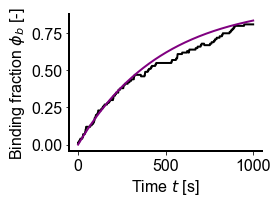

In [21]:
font = {'family' : 'arial',
        'weight' : 'normal',
        'size'   : 16}
matplotlib.rc('font', **font)
fig, axs = plt.subplots(1, 1,figsize=(4,3))
axs.plot(np.linspace(0,1000,1000),bond_tvec/100,color='black',linewidth=2)
axs.plot(np.linspace(0,1000,1000),phib,color='purple',linewidth=2)
axs.set_xlabel(r'Time $t$ [s]')
axs.set_ylabel('Binding fraction '+r'$\phi_b$ [-]')
axs.spines['right'].set_visible(False)
axs.spines['top'].set_visible(False)
axs.spines['bottom'].set_linewidth(2)
axs.spines['left'].set_linewidth(2)
plt.tight_layout()
#plt.savefig('adhesionMC.png',dpi=300)

The previous model considers a single fiber. However, as seen in the beginning of this notebook, there is a fiber orientation and a fiber waviness distribution. The orientation will be taking into consideration later. Here, first the waviness distribution is taken into consideration for a particular orientation. This is termed 'mesoscale' because it is not longer a single fiber, but it is also not the whole tissue response. On the other hand, note that we are not doing a representative volume element with a discrete fiber network, we are still using the fiber waviness distribution. 

In [25]:
## From single fiber to mesoscale response 
# energy density of a fiber network subjected to total strain lam, with current viscous stretch lamv 
# difference with previous one is integration over waviness or slack distribution
def integrand_Psi_eq(lams,lam,beta,delta,gama,mu_co):
    # eval Weibull
    p_lams=(beta/delta)*((lams-gama)/delta)**(beta-1)*np.exp(-((lams-gama)/delta)**beta)
    lamr = lam/lams
    # equilibrium portion of the energy 
    Psi_eq = mu_co*(lamr**2+(2./lamr)-3)
    return Psi_eq

def evalPsi_meso(lam,lamv,param,dt):
    mu_co = param[0]
    beta_visc = param[1]
    tau_visc = param[2] # not used
    # INTEGRAL over fiber waviness for equilibrium portion
    Psi_eq = quad(integrand_Psi_eq, gama_co, lam, args=(lam,beta_co,delta_co,gama_co,mu_co),limit=10)
    # INTEGRAL over fiber waviness for non-equilibrium portion
    lame_n = lam/lamv
    Psi_neq = beta_visc*quad(integrand_Psi_eq, gama_co, lame_n, args=(lame_n,beta_co,delta_co,gama_co),limit=10)
    return Psi_eq+Psi_neq

def integrand_dPsif(lams,lam,beta,delta,gama):
    # eval Weibull
    p_lams=(beta/delta)*((lams-gama)/delta)**(beta-1)*np.exp(-((lams-gama)/delta)**beta)
    lamr = lam/lams
    dPsif = (lamr**2-(1/lamr))
    return dPsif

def integrand_d2Psif(lams,lam,beta,delta,gama):
    # eval Weibull
    p_lams=(beta/delta)*((lams-gama)/delta)**(beta-1)*np.exp(-((lams-gama)/delta)**beta)
    lamr = lam/lams
    d2Psif = p_lams*(2*lamr**2+(1/lamr))
    return d2Psif

    
def evalPK1_meso(lam,lamv,param,dt):
    mu_co = param[0]
    beta_visc = param[1]
    tau_visc = param[2]
    
    # equilibrium branch 
    dPsifeq_aux = quad(integrand_dPsif, gama_co, lam, args=(lam,beta_co,delta_co,gama_co),limit=10)[0]
    # update of the viscous branch 
    lame = lam/lamv 
    dPsif_aux = quad(integrand_dPsif, gama_co, lame, args=(lame,beta_co,delta_co,gama_co),limit=10)[0]
    dPsif = 2*beta_visc*mu_co*(1.0/(lame**2))*dPsif_aux
    d2Psif_aux = quad(integrand_d2Psif, gama_co, lame, args=(lame,beta_co,delta_co,gama_co),limit=10)[0]
    d2Psif = -2*mu_co*beta_visc/lame**4*dPsif_aux+mu_co*beta_visc/lame**4*d2Psif_aux
    if np.abs(d2Psif*lame**2 + dPsif)>0:
        I4edot = ((-1.0/tau_visc)*dPsif*lame**2)/(d2Psif*lame**2 + dPsif)
    else:
        I4edot = 0
    if (d2Psif*lame**2 + dPsif)<0:
        print('negative I4edot denominator, check')
    # new elastic strain 
    I4e = lame**2 + dt*I4edot
    lamenew = np.sqrt(I4e)
    # update the viscoelastic internal variable 
    lamvnew = (lam/lamenew)
    
    # eval stress and return 
    PK2_eq = 2*mu_co*(1.0/(lam**2))*dPsifeq_aux
    PK2_neq = 2*beta_visc*mu_co*(1.0/(lame**2))*dPsif_aux*lame**2/lam**2  
    # transform to PK1 
    PK1 = lam*(PK2_eq+PK2_neq)
    return PK1,lamvnew

def evalKeff_meso(lam,lamv,param,dt):
    mu_co = param[0]
    beta_visc = param[1]
    tau_visc = param[2]
    lame = lam/lamv
    dPsifeq_aux = quad(integrand_dPsif, gama_co, lam, args=(lam,beta_co,delta_co,gama_co),limit=10)[0]
    d2Psifeq_aux = quad(integrand_d2Psif, gama_co, lam, args=(lam,beta_co,delta_co,gama_co),limit=10)[0]
    dPsifneq_aux = quad(integrand_dPsif, gama_co, lame, args=(lame,beta_co,delta_co,gama_co),limit=10)[0]
    d2Psifneq_aux = quad(integrand_d2Psif, gama_co, lame, args=(lame,beta_co,delta_co,gama_co),limit=10)[0]
    PK2_eq = 2*mu_co*(1.0/(lam**2))*dPsifeq_aux
    PK2_neq = 2*beta_visc*mu_co*(1.0/(lam**2))*dPsifneq_aux 
    # transform to PK1 
    PK1 = lam*(PK2_eq+PK2_neq)
    # stiffness is derivative with respect to stretch
    dPK2_eq = -4*mu_co*(1.0/(lam**3))*dPsifeq_aux + 2*mu_co*(1/lam**3)*d2Psifeq_aux
    dlame = 1/lamv
    dPK2_neq = -4*beta_visc*mu_co*(1.0/(lam**3))*dPsifneq_aux + 2*mu_co*beta_visc*(1.0/(lam**2*lame))*d2Psifneq_aux*dlame
    keff = (PK2_eq+PK2_neq) + lam*(dPK2_eq+dPK2_neq)
    return keff

In [26]:
# Mesoscale
# ODE version but with deltaE from hyperelastic extremes 
# the viscoelastic model is such that an average energy at the adhesion is needed. This coupling is actually
# quite complicated. In the MC case the energy at every bond was tracked and used to compute the average energy for 
# the ODE. Without the MC simulation, an estimate of the deltaE is needed. The reason why this is complicated
# is because deltaE depends on the time that a bond lasts until it dissociates, which in turn is a function of the
# viscous dissipation near that bond. An approximation is to consider the two hyperelastic extremes, either no 
# dissipation or perfect dissipation of the non-equilibrium part of the energy at an integrin bond 
def solve_mindE_meso(lam,f,lamc0):
    A0 = 2e4*1e-6 # um^2
    l0 = 0.01 # um 
    PK10,aux = evalPK1_meso(lam,lam,param_one,dt)
    F0 = PK10*A0*1e6
    resnorm = 1
    iter = 0
    itermax = 30
    tol = 1e-4
    eps = 1e-7
    lamc=lamc0
    while resnorm>tol and iter<itermax:
        # stress PK2 given lamc and lamvi 
        PK1,aux= evalPK1_meso(lamc,lam,param_one,dt)
        # trying to solve the PK1 boundary condition 
        res = PK1*A0*1e6-F0-f # 1 N/mm^2*um^2 = 1e12 pN/(1e6 um^2)*um^2 = 1e6 pN 
        #print('res',res)
        resnorm = np.abs(res)
        lamp = lamc+eps
        #Ep,aux = evalPsi(lamp,lamvi,param_one,dt)
        PK1p,aux= evalPK1_meso(lamp,lam,param_one,dt)
        resp = PK1p*A0*1e6-F0-f
        dres = (resp-res)/eps
        lamc -= res/dres
        #print('lamc',lamc)
        iter+=1
    dE = f*(lamc*l0-lam*l0)*1e-18
    #print('res',resnorm)
    #print('iter',iter)
    #print('dE',dE)
    #print('lamc',lamc)
    return lamc, dE

# ODE version but with deltaE from hyperelastic extremes 
def solve_maxdE_meso(lam,f,lamc0):
    A0 = 2e4*1e-6 # um^2
    l0 = 0.01 # um 
    PK10,aux = evalPK1_meso(lam,lam,param_one,dt)
    F0 = PK10*A0*1e6
    resnorm = 1
    iter = 0
    itermax = 30
    tol = 1e-4
    eps = 1e-7
    lamc=lamc0
    while resnorm>tol and iter<itermax:
        # stress PK2 given lamc and lamvi 
        PK1,aux= evalPK1_meso(lamc,lamc,param_one,dt)
        # trying to solve the PK1 boundary condition 
        res = PK1*A0*1e6-F0-f # 1 N/mm^2*um^2 = 1e12 pN/(1e6 um^2)*um^2 = 1e6 pN 
        #print('res',res)
        resnorm = np.abs(res)
        lamp = lamc+eps
        #Ep,aux = evalPsi(lamp,lamvi,param_one,dt)
        PK1p,aux= evalPK1_meso(lamp,lamp,param_one,dt)
        resp = PK1p*A0*1e6-F0-f
        dres = (resp-res)/eps
        lamc -= res/dres
        #print('lamc',lamc)
        iter+=1
    dE = f*(lamc*l0-lam*l0)*1e-18
    #print('res',resnorm)
    #print('iter',iter)
    #print('dE',dE)
    #print('lamc',lamc)
    return lamc, dE

def solve_mindE_f_meso(lam,lamc0):
    #A0 = 2e4*1e-6 # um^2
    A0 = 0.01
    l0 = 0.01 # um 
    f0 = 100 #pN 
    ka = 50 #pN/nm 
    kN = 25 #10-50 pN/nm 
    beta = 0.5 #0 to 1 
    PK10,aux = evalPK1_meso(lam,lam,param_one,dt)
    F0 = PK10*A0*1e6
    resnorm = 1
    iter = 0
    itermax = 30
    tol = 1e-4
    eps = 1e-7
    lamc=lamc0
    while resnorm>tol and iter<itermax:
        PK1,lamvn= evalPK1_meso(lamc,lam,param_one,dt)
        if PK1<PK10:
            PK1=PK10
            lamc=lam
        # keff is force over distance
        keff = evalKeff_meso(lamc,lam,param_one,dt)+1e-8 # 1 N/mm^2*um^2/um = 1 N/mm^2*um = 1 1e12pN/1e6um^2*um = 1e6 pN/um = 1e3 pN/nm
        # active force now depends on keff too 
        f = f0/(1-beta+(ka/keff+ka/kN))
        res = PK1*A0*1e6-F0-f # 1 N/mm^2*um^2 = 1e12 pN/(1e6 um^2)*um^2 = 1e6 pN 
        #print('res',res)
        resnorm = np.abs(res)
        lamp = lamc+eps
        #Ep,aux = evalPsi(lamp,lamvi,param_one,dt)
        PK1p,aux= evalPK1_meso(lamp,lam,param_one,dt)
        keffp = evalKeff_meso(lamp,lam,param_one,dt)+1e-8
        fp = f0/(1-beta+(ka/keffp+ka/kN))
        resp = PK1p*A0*1e6-F0-fp
        dres = (resp-res)/eps
        lamc -= res/dres
        iter+=1
    dE = f*(lamc*l0-lam*l0)*1e-18
    #print('res',resnorm)
    #print('iter',iter)
    #print('dE',dE)
    #print('lamc',lamc)
    #print('f',f)
    #print('keff',keff)
    return lamc, f, dE, keff

# ODE version but with deltaE from hyperelastic extremes 
def solve_maxdE_f_meso(lam,lamc0):
    #A0 = 2e4*1e-6 # um^2
    A0 = 0.01 # um^2
    l0 = 0.01 # um 
    f0 = 100 #pN 
    ka = 50 #pN/nm 
    kN = 25 #10-50 pN/nm 
    beta = 0.5 #0 to 1 
    PK10,aux = evalPK1_meso(lam,lam,param_one,dt)
    F0 = PK10*A0*1e6
    resnorm = 1
    iter = 0
    itermax = 30
    tol = 1e-4
    eps = 1e-7
    lamc=lamc0
    while resnorm>tol and iter<itermax:
        PK1,lamvn= evalPK1_meso(lamc,lamc,param_one,dt)
        if PK1<PK10:
            PK1=PK10
            lamc=lam
        # keff is force over distance
        keff = evalKeff_meso(lamc,lamc,param_one,dt)+1e-8 # 1 N/mm^2*um^2/um = 1 N/mm^2*um = 1 1e12pN/1e6um^2*um = 1e6 pN/um = 1e3 pN/nm
        # active force now depends on keff too 
        f = f0/(1-beta+(ka/keff+ka/kN))
        res = PK1*A0*1e6-F0-f # 1 N/mm^2*um^2 = 1e12 pN/(1e6 um^2)*um^2 = 1e6 pN 
        #print('res',res)
        resnorm = np.abs(res)
        lamp = lamc+eps
        #Ep,aux = evalPsi(lamp,lamvi,param_one,dt)
        PK1p,aux= evalPK1_meso(lamp,lamp,param_one,dt)
        keffp = evalKeff_meso(lamp,lamp,param_one,dt)+1e-8
        fp = f0/(1-beta+(ka/keffp+ka/kN))
        resp = PK1p*A0*1e6-F0-fp
        dres = (resp-res)/eps
        lamc -= res/dres
        iter+=1
    dE = f*(lamc*l0-lam*l0)*1e-18
    #print('res',resnorm)
    #print('iter',iter)
    #print('dE',dE)
    #print('lamc',lamc)
    #print('f',f)
    #print('keff',keff)
    return lamc, f, dE, keff

Figure 4: Dependence of cell adhesion on substrate stretch 

As stretch increases, the tangent or effective stiffness of the ECM changes. As a result, the active cell stress changes to match the substrate stiffness. 

In [27]:
## Mesoscale
## Equilibrium response with change in stretch
nstretch=25
stretch_vec = np.linspace(1,1.25,nstretch)
keff_vec = np.zeros((nstretch))
phib_ss1_uncoupled = np.zeros((nstretch))
phib_ss2_uncoupled = np.zeros((nstretch))
phib_ss1_coupled = np.zeros((nstretch))
phib_ss2_coupled = np.zeros((nstretch))
sigma_min_uncoupled = np.zeros((nstretch))
sigma_max_uncoupled = np.zeros((nstretch))
phib_ss1_coupled = np.zeros((nstretch))
phib_ss2_coupled = np.zeros((nstretch))
sigma_min_coupled = np.zeros((nstretch))
sigma_max_coupled = np.zeros((nstretch))

param_one = [1,beta_visc,tau_visc]
for i in range(nstretch):
    lam = stretch_vec[i]
    #print('lam',lam)
    # uncoupled
    f=10
    lamc,mindeltaE=solve_mindE_meso(lam,f,lam)
    lamc,maxdeltaE=solve_maxdE_meso(lam,f,lam)
    koffmax = koffhat*np.exp(maxdeltaE/kBT)
    koffmin = koffhat*np.exp(mindeltaE/kBT)
    phib_ss1_uncoupled[i] = kon/(kon+koffmax)
    phib_ss2_uncoupled[i] = kon/(kon+koffmin)
    sigma_min_uncoupled[i] = phib_ss1_uncoupled[i]*f
    sigma_max_uncoupled[i] = phib_ss2_uncoupled[i]*f
    # coupled
    lamc,fmin,mindeltaE,keffmin=solve_mindE_f_meso(lam,lam)
    lamc,fmax,maxdeltaE,keffmax=solve_maxdE_f_meso(lam,lam)
    koffmax = koffhat*np.exp(maxdeltaE/kBT)
    koffmin = koffhat*np.exp(mindeltaE/kBT)
    phib_ss1_coupled[i] = kon/(kon+koffmax)
    phib_ss2_coupled[i] = kon/(kon+koffmin)
    sigma_min_coupled[i] = phib_ss1_coupled[i]*fmax
    sigma_max_coupled[i] = phib_ss2_coupled[i]*fmin
    keff_vec[i] = keffmin

<ipython-input-25-09a8c8e07d48>:49: IntegrationWarning: The maximum number of subdivisions (10) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  d2Psif_aux = quad(integrand_d2Psif, gama_co, lame, args=(lame,beta_co,delta_co,gama_co),limit=10)[0]
<ipython-input-25-09a8c8e07d48>:44: IntegrationWarning: The maximum number of subdivisions (10) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling t

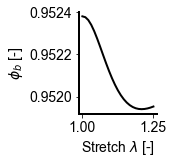

In [28]:
## plot the coupled case
#plt.plot(stretch_vec,phib_ss1_coupled)
#plt.plot(stretch_vec,phib_ss2_coupled)
font = {'family' : 'arial',
        'weight' : 'normal',
        'size'   : 14}
matplotlib.rc('font', **font)
fig, axs = plt.subplots(1, 1,figsize=(2.5,2.5))
axs.plot(stretch_vec,phib_ss2_coupled,color='black',linewidth=2)
axs.set_xlabel(r'Stretch $\lambda$ [-]')
axs.set_ylabel(r'$\phi_b$ [-]')
axs.spines['right'].set_visible(False)
axs.spines['top'].set_visible(False)
axs.spines['bottom'].set_linewidth(2)
axs.spines['left'].set_linewidth(2)
plt.tight_layout()
#plt.savefig('adhesion_stretch.png',dpi=300)

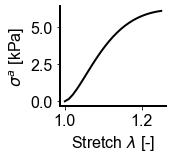

In [29]:
# active stress of cells is simply the equilibrium adhesion by the corresponding force 
#plt.plot(stretch_vec,sigma_min_coupled)
#plt.plot(stretch_vec,sigma_max_coupled)
font = {'family' : 'arial',
        'weight' : 'normal',
        'size'   : 16}
matplotlib.rc('font', **font)
fig, axs = plt.subplots(1, 1,figsize=(2.5,2.5))
axs.plot(stretch_vec,sigma_max_coupled,color='black',linewidth=2)
axs.set_xlabel(r'Stretch $\lambda$ [-]')
axs.set_ylabel(r'$\sigma^a$ [kPa]')
axs.spines['right'].set_visible(False)
axs.spines['top'].set_visible(False)
axs.spines['bottom'].set_linewidth(2)
axs.spines['left'].set_linewidth(2)
plt.tight_layout()
#plt.savefig('sigma_stretch.png',dpi=300)

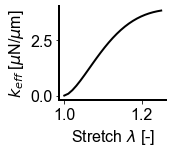

In [41]:
font = {'family' : 'arial',
        'weight' : 'normal',
        'size'   : 16}
matplotlib.rc('font', **font)
fig, axs = plt.subplots(1, 1,figsize=(2.5,2.5))
axs.plot(stretch_vec,keff_vec,color='black',linewidth=2)
axs.set_xlabel(r'Stretch $\lambda$ [-]')
axs.set_ylabel(r'$k_{eff}$ [$\mu$N/$\mu$m]')
axs.spines['right'].set_visible(False)
axs.spines['top'].set_visible(False)
axs.spines['bottom'].set_linewidth(2)
axs.spines['left'].set_linewidth(2)
plt.tight_layout()
plt.savefig('keff_stretch.png',dpi=300)

## Example: A growting tissue in response to cellular mechanobiology

Adding dynamic equations for the cell density, TGFbeta, and collagen mass fraction

In [31]:
# from Sohutskay paper on wound healing:
# dynamics of cytokine, cell density, and collagen turnover  
def c_dot(c,rho,Hs):
    pcc = 90e-16 #1/h
    pcs = 3e-18 #1/h
    Kcc = 1 #mol/mm^3
    dc = 0.001 #1/h
    Dcc = 0.012 #mm^2/h
    cphys = 0
    return (pcc*c+pcs*Hs)*rho/(Kcc+c) - dc*c + Dcc*(cphys-c)

def rho_dot(c,rho,Hs):
    prho = 0.034 #1/hr 
    rhophys = 1000
    cmax = 1e-4
    Krhorho = 10000
    prhoc = 0.0085
    prhos = 0.0085
    Krhoc = cmax/10
    Drhorho = 0.08333
    drho = prho*(1-rhophys/Krhorho)
    return (prho+c*prhoc*c/(c+Krhoc) +prhos*Hs)*(1-rho/Krhorho)*rho - drho*rho + Drhorho*(rhophys-rho)

def phi_dot(c,rho,phi,Hs):
    rhophys = 1000
    pphi=0.002/rhophys
    phic = pphi
    phis = pphi
    cmax = 1e-4
    Kphic = cmax/10
    dphi = 0.000970
    dphirhoc = 0.5*0.000970/rhophys/cmax
    Kphirho = rhophys*pphi/dphi - 1
    return (pphi+phic*c/(c+Kphic)+phis*Hs)*rho/(Kphirho+phi) - dphi*phi - dphirhoc*rho*c*phi
    

Coupling between cell activity and mechanical input. The coupling is the stress in the cell, which is regulated based on the apparent stiffness of the substrate, which in turn changes as a function of stretch. 

In [32]:
# main function for the mechanobiology coupling 
def eval_mechanobiology(lam):
    # solve the adhesion model and get the active stress by the cell 
    # coupled problem, contractile force is solved as part of adhesion problem 
    lamc,fmin,mindeltaE,keffmin=solve_mindE_f_meso(lam,lam)
    koffmin = koffhat*np.exp(mindeltaE/kBT)
    phib_ss_coupled = kon/(kon+koffmin)
    sigma_a = phib_ss_coupled*fmin
    return sigma_a

Second Piola Kirchhoff stress taking into consideration the mechanobiology couplings. 

There are two couplings. 

On the one hand, the current deformation is used to evaluate the mechanobiology coupling (adhesion model) which in turn specifies the changes in collagen production, cell proliferation, TGF beta production. 

The second coupling is the effect on mechanics: active stress and the growth. The active stress also comes from the adhesion model, and the growth is given by collagen production. 

In [33]:
def evalPK2cell(F,param,rho_theta,lamg_theta_n,c,rho_cell_theta_n,phi_theta_n,dt):
    # unpack parameters 
    # isotropic matrix
    mu0      = param[0]
    K        = param[1]
    # collagen 
    mu_co    = param[2]
    beta_co  = param[3]
    delta_co = param[4]
    gama_co  = param[5]
    # beta controls the viscosity branch relative to equilibrium branch
    beta_visc= param[6]
    # tau controls the time scale of relaxation 
    tau_visc = param[7]

    # initialize fiber to zero
    C=np.dot(F,F.transpose())
    J=np.sqrt(np.linalg.det(C))
    I1= np.trace(C)
    Cinv = np.linalg.inv(C)
    Sf=np.zeros([3,3])
    Id=np.eye(3)
    
    # initialize active stress to zero 
    sigma_act=np.zeros([3,3])
    
    # W Isochoric
    Siso=2*(J**(-2./3.))*(mu0)*(Id-(1./3.)*I1*(Cinv))

    # W Volume
    #Wvol = p*(J-1)
    p = 2*K*(J-1)
    Svol = p*J*Cinv

    ntheta = len(rho_theta)
    dtheta = rho_theta[1,0]-rho_theta[0,0]
    lamg_theta = np.ones((ntheta))
    rho_cell_theta = np.ones((ntheta))
    phi_theta = np.ones((ntheta))
    c_new = c
    for i in range(ntheta):
        thetai = rho_theta[i,0]
        rhooi = rho_theta[i,1]*dtheta
        a0 = np.array([math.cos(thetai),math.sin(thetai),0])
        d_a0 = np.outer(a0,a0)
        # total deformation
        lam = np.sqrt(np.dot(a0,np.dot(C,a0)))
        # elastic deformation from previous growth step
        lamg_n_i = lamg_theta_n[i]
        lam_eq_n = lam/lamg_n_i
        
        ######---------------------------------#########
        # cell mechanobiology 
        rho_cell_thei = rho_cell_theta_n[i]
        phi_thei = phi_theta_n[i]
        # evaluate the adhesion model 
        sigma_a_thei = eval_mechanobiology(lam_eq_n)
        # cytokine is integrated over all orientations theta because it is a scalar
        c_new += dt*c_dot(c,rho_cell_thei,sigma_a_thei)*dtheta
        # evaluate the update of the cell density for a particular orientation        
        rho_cell_thei_new = rho_cell_thei + dt*rho_dot(c,rho_cell_thei,sigma_a_thei)
        # also collagen deposition in a particular orientation 
        phi_thei_new =  phi_thei + dt*phi_dot(c,rho_cell_thei,phi_thei,sigma_a_thei)
        phidot = phi_dot(c,rho_cell_thei,phi_thei,sigma_a_thei)
        # store new solution 
        rho_cell_theta[i] = rho_cell_thei_new
        phi_theta[i] = phi_thei_new
        ######---------------------------------#########
        
        ######---------------------------------#########
        # update the growth 
        #
        # growth given by the collagen turnover 
        rhophi = 1 # density of collagen
        lamgi = lamg_theta_n[i] + dt*phidot*rhophi
        lamg_theta[i] = lamgi
        ######---------------------------------#########
        
        # new stretch in the equilibrium branch 
        lam_eq = lam/lamgi
        # integrate the stress contribution from equilibrium branch 
        if lam_eq>gama_co:
            int_po = quad(integrand, gama_co, lam_eq, args=(lam_eq,beta_co,delta_co,gama_co),limit=10)
        else:
            int_po = [0]
        # ignore viscoelastic behavior for this example #
        # stress with the new elastic stretch 
        Sfiber_eq = 2*mu_co*(1.0/(lam_eq**2))*int_po[0]*rhooi  
        # this is PK2 in the intermediate, for PK2 need to pull back
        Sf_middle =  (Sfiber_eq)*d_a0
        # for a fiber, growth is only in the direction of fiber 
        # Fg = lamg*a0a0 + s0s0 + n0n0 = (1+lamg-1)*a0a0 + s0s0 + n0n0 = Id + (lamg-1)*a0a0
        # Fginv = 1/lamg*a0a0 + s0s0 + n0n0 = (1+1/lamg - 1)*a0a0 + s0s0 + n0n0 = Id + (1/lamg-1)*a0a0
        Fginv = (1/lamgi-1)*d_a0 + np.eye(3)
        Sf += np.dot(Fginv,np.dot(Sf_middle,Fginv))
        
        # total active stress also accumulated 
        # deformed fiber 
        a = np.dot(F,a0)
        ahat = a/np.linalg.norm(a)
        a_dyad_a = np.outer(ahat,ahat)*rhooi
        sigma_act += sigma_a_thei*rho_cell_thei_new*a_dyad_a
        
        
    # this is compressible 
    S = Siso + Svol + Sf
    
    # this is incompressible 
    p = mu0/Cinv[2,2]
    S = mu0*Id - p*Cinv + Sf
    
    # transform active stress to PK2
    Finv = np.linalg.inv(F)
    Sact = np.dot(Finv,np.dot(sigma_act,Finv.transpose()))
    
    return S,Sact, lamg_theta, rho_cell_theta, phi_theta, c_new

Figure 5: tissue growth coupled to cell mechanobiology. 

A given deformation is applied. By solving the coupled system of equations, the tissue grows in order to restore homeostatic conditions, which in this case is a target cell stress of zero. The target stress could be changed to a different target, without loss of generality. 

In [34]:
## Prescribed displacement, calculate stress and update growth 
n_t = 250
time_vec = np.linspace(0,250,n_t)
dt = time_vec[1]-time_vec[0] # in hrs!!!! 
# boundary condition
lamx = 1.1
lamy = 1.00
lamxg_vec = np.ones((n_t+1))
lamyg_vec = np.ones((n_t+1))
rhox_vec = 1000*np.ones((n_t+1))
phix_vec = np.ones((n_t+1))
tax_vec = np.ones((n_t+1))
c_vec = np.zeros((n_t+1))
rho_cell_theta_n = np.ones((ntheta))*1000
c = 0
phi_theta_n = np.ones((ntheta))
lamg_theta_n = np.ones((ntheta))
tau_growth = 50
param_co = [mu0,K,mu_co,beta_co,delta_co,gama_co,beta_visc,tau_visc,tau_growth]
for i in range(50,n_t):
    # simply eval
    F = np.array([[lamx,0,0],[0,lamy,0],[0,0,1/(lamx*lamy)]])
    PK2,PK2act,lamgnew,rhocellnew,phinew,cnew = evalPK2cell(F,param_co,rho_theta,lamg_theta_n,c,rho_cell_theta_n,phi_theta_n,dt)
    lamg_theta_n = lamgnew
    rho_cell_theta_n = rhocellnew
    phi_theta_n = phinew 
    c = cnew 
    lamxg_vec[i+1] = lamgnew[int(ntheta/2)]
    lamyg_vec[i+1] = lamgnew[0]
    rhox_vec[i+1] = rhocellnew[int(ntheta/2)]
    phix_vec[i+1] = phinew[int(ntheta/2)]
    tax_vec[i+1] = PK2act[0,0]*lamx**2
    c_vec[i+1]=cnew
    

/Users/abuganza/opt/anaconda3/lib/python3.8/site-packages/scipy/integrate/quadpack.py:463: ComplexWarning: Casting complex values to real discards the imaginary part
  return _quadpack._qagse(func,a,b,args,full_output,epsabs,epsrel,limit)


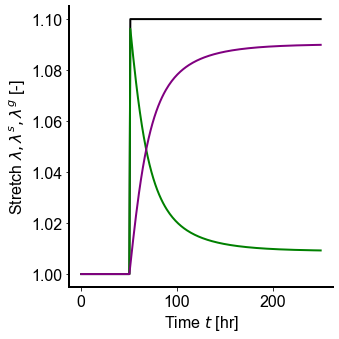

In [35]:
font = {'family' : 'arial',
        'weight' : 'normal',
        'size'   : 16}
matplotlib.rc('font', **font)
fig, axs = plt.subplots(1, 1,figsize=(5,5))
lamx_vec = np.ones((n_t+1))
lamx_vec[0:51] = 1
lamx_vec[51:] = lamx
axs.plot(time_vec[0:],lamx_vec[0:-1],color='black',linewidth=2)
axs.plot(time_vec[0:],lamx_vec[0:-1]/lamxg_vec[0:-1],color='green',linewidth=2)
axs.plot(time_vec[0:],lamxg_vec[0:-1],color='purple',linewidth=2)
axs.set_xlabel(r'Time $t$ [hr]')
axs.set_ylabel('Stretch '+r'$\lambda, \lambda^s, \lambda^g$ [-]')
axs.spines['right'].set_visible(False)
axs.spines['top'].set_visible(False)
axs.spines['bottom'].set_linewidth(2)
axs.spines['left'].set_linewidth(2)
plt.tight_layout()
#plt.savefig('growth_coupled.png',dpi=300)

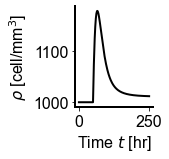

In [36]:
font = {'family' : 'arial',
        'weight' : 'normal',
        'size'   : 16}
matplotlib.rc('font', **font)
fig, axs = plt.subplots(1, 1,figsize=(2.5,2.5))
axs.plot(time_vec,rhox_vec[:-1],color='black',linewidth=2)
axs.set_xlabel(r'Time $t$ [hr]')
axs.set_ylabel(r'$\rho$ [cell/mm$^3$]')
axs.spines['right'].set_visible(False)
axs.spines['top'].set_visible(False)
axs.spines['bottom'].set_linewidth(2)
axs.spines['left'].set_linewidth(2)
plt.tight_layout()
#plt.savefig('rho_coupled.png',dpi=300)

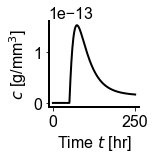

In [37]:
font = {'family' : 'arial',
        'weight' : 'normal',
        'size'   : 16}
matplotlib.rc('font', **font)
fig, axs = plt.subplots(1, 1,figsize=(2.5,2.5))
axs.plot(time_vec,c_vec[:-1],color='black',linewidth=2)
axs.set_xlabel(r'Time $t$ [hr]')
axs.set_ylabel(r'$c$ [g/mm$^3$]')
axs.spines['right'].set_visible(False)
axs.spines['top'].set_visible(False)
axs.spines['bottom'].set_linewidth(2)
axs.spines['left'].set_linewidth(2)
plt.tight_layout()
#plt.savefig('c_coupled.png',dpi=300)

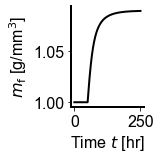

In [38]:
font = {'family' : 'arial',
        'weight' : 'normal',
        'size'   : 16}
matplotlib.rc('font', **font)
fig, axs = plt.subplots(1, 1,figsize=(2.5,2.5))
axs.plot(time_vec,phix_vec[:-1],color='black',linewidth=2)
axs.set_xlabel(r'Time $t$ [hr]')
axs.set_ylabel(r'$m_{\mathrm{f}}$ [g/mm$^3$]')
axs.spines['right'].set_visible(False)
axs.spines['top'].set_visible(False)
axs.spines['bottom'].set_linewidth(2)
axs.spines['left'].set_linewidth(2)
plt.tight_layout()
#plt.savefig('phi_coupled.png',dpi=300)

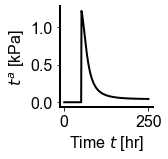

In [39]:
font = {'family' : 'arial',
        'weight' : 'normal',
        'size'   : 16}
matplotlib.rc('font', **font)
fig, axs = plt.subplots(1, 1,figsize=(2.5,2.5))
axs.plot(time_vec,tax_vec[:-1]/1000,color='black',linewidth=2)
axs.set_xlabel(r'Time $t$ [hr]')
axs.set_ylabel(r'$t^{a}$ [kPa]')
axs.spines['right'].set_visible(False)
axs.spines['top'].set_visible(False)
axs.spines['bottom'].set_linewidth(2)
axs.spines['left'].set_linewidth(2)
plt.tight_layout()
#plt.savefig('ta_coupled.png',dpi=300)